# Incorporate Safety Specification to Learned Specification from User Demonstration on Seshia Paper's Env 

by Kandai Watanabe (kandai.watanabe@colorado.edu / kandai.wata@gmail.com)

or reach me out on github (https://github.com/watakandai)


**FOR SESHIA's paper on Learning Task Specifications from Demonstrations:**

In this notebook, we're going to incorporate safety specification to a learned specification (liveness) to safety navigate to a goal. 

We will then apply the composed specification to an environment with a different robot / environmental dynamics, but with the same intended goal as in the environment where we demonstrated the task.

This shows that we can actually learn the intended task the user had in mind when they demonstrate it on a system with actual dynamics, maitain safety, and then apply that specification to a different environment.



Change up to the main repo directory:

In [1]:
import os
os.chdir(os.path.join('..', '..'))

In [2]:
%load_ext autoreload
%autoreload 2
import gym
from IPython.display import Video, display
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from pathlib import Path
import itertools
import numpy as np
import matplotlib.pyplot as plt

from wombats.systems import (StaticMinigridTSWrapper,
                             LavaComparison_noDryingOff)
from wombats.automaton import active_automata
from wombats.automaton import MinigridTransitionSystem
from wombats.learning import FlexfringeInterface, PDFADataLoader, DummyEstimator, BatchEstimator, ComparativeEvaluation
from wombats.learning import VanillaSL, PostprocessingSL, GreedyEmbeddingSL, PolynomialEmbeddingSL, TargetSpecification
from wombats.automaton import Automaton
from wombats.utils import get_experiment_paths

# setting all paths
ENV_ID_0 = 'MiniGrid-LavaComparison_SeshiaSecondGoal-v0'
ENV_ID_1 = 'MiniGrid-LavaComparison_seshia-v0'

EXPERIMENT_NAME = 'safe_pdfa_learning_performance_analysis'
path_data = get_experiment_paths(EXPERIMENT_NAME)
EXPERIMENT_DIR = path_data['EXPERIMENT_DIR']
PDFA_MODEL_CONFIG_FILE = path_data['PDFA_MODEL_CONFIG_FILE']
DFA_MODEL_CONFIG_FILE = path_data['DFA_MODEL_CONFIG_FILE']
LEARNER_DATA_DIR = path_data['LEARNER_DATA_DIR']
LEARNING_TRAIN_DATA_REL_FILEPATH = path_data['LEARNING_TRAIN_DATA_REL_FILEPATH']
LEARNING_TEST_DATA_REL_FILEPATH = path_data['LEARNING_TEST_DATA_REL_FILEPATH']
GYM_MONITOR_LOG_DIR = path_data['GYM_MONITOR_LOG_DIR']
Automaton.automata_data_dir = os.path.join(EXPERIMENT_DIR)
path_data

{'EXPERIMENT_DIR': 'experiments/safe_pdfa_learning_performance_analysis',
 'PDFA_MODEL_CONFIG_FILE': 'wombats/config/PDFA_safe_pdfa_learning_performance_analysis.yaml',
 'DFA_MODEL_CONFIG_FILE': 'wombats/config/DFA_safe_pdfa_learning_performance_analysis.yaml',
 'TS_MODEL_CONFIG_FILE': 'wombats/config/TS_safe_pdfa_learning_performance_analysis.yaml',
 'GYM_MONITOR_LOG_DIR': 'experiments/safe_pdfa_learning_performance_analysis/minigrid_env_logs',
 'LEARNER_DATA_DIR': 'experiments/safe_pdfa_learning_performance_analysis/flexfringe_data',
 'LEARNING_TRAIN_DATA_REL_FILEPATH': 'flexfringe_data/safe_pdfa_learning_performance_analysis_train',
 'LEARNING_TEST_DATA_REL_FILEPATH': 'flexfringe_data/safe_pdfa_learning_performance_analysis_test'}

## Loading in the Desired LTL-style PDFA Specification

We're going to assume the user has some task in mind that can be expressed as some form of complicated LTL formula that has been translated to a DFA with probabilistic weights to encode their task preferences.

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/systems/minigrid.py:717: RuntimeWarning: could not find any goal objects.
  warnings.warn(msg, RuntimeWarning)


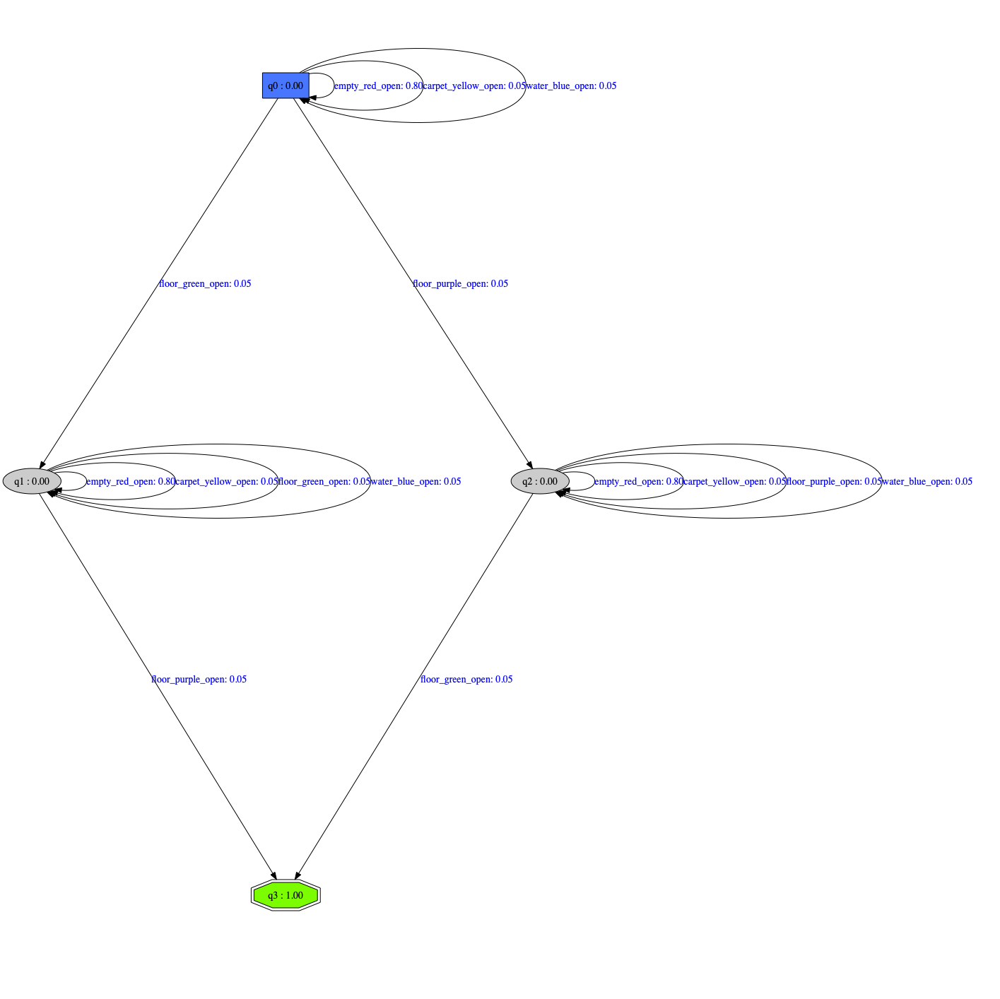

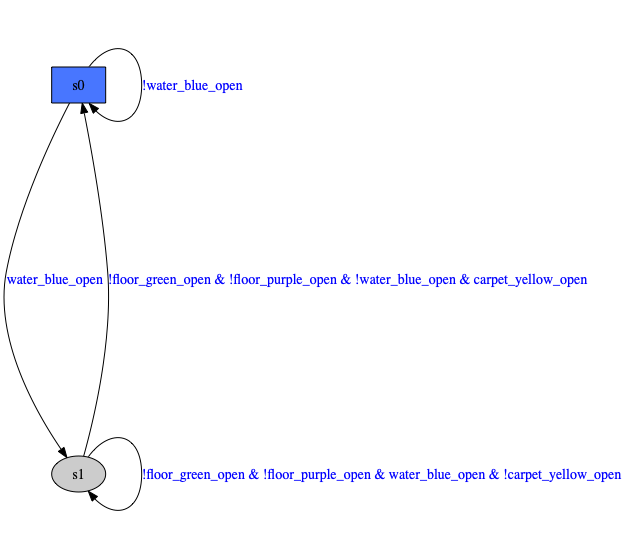

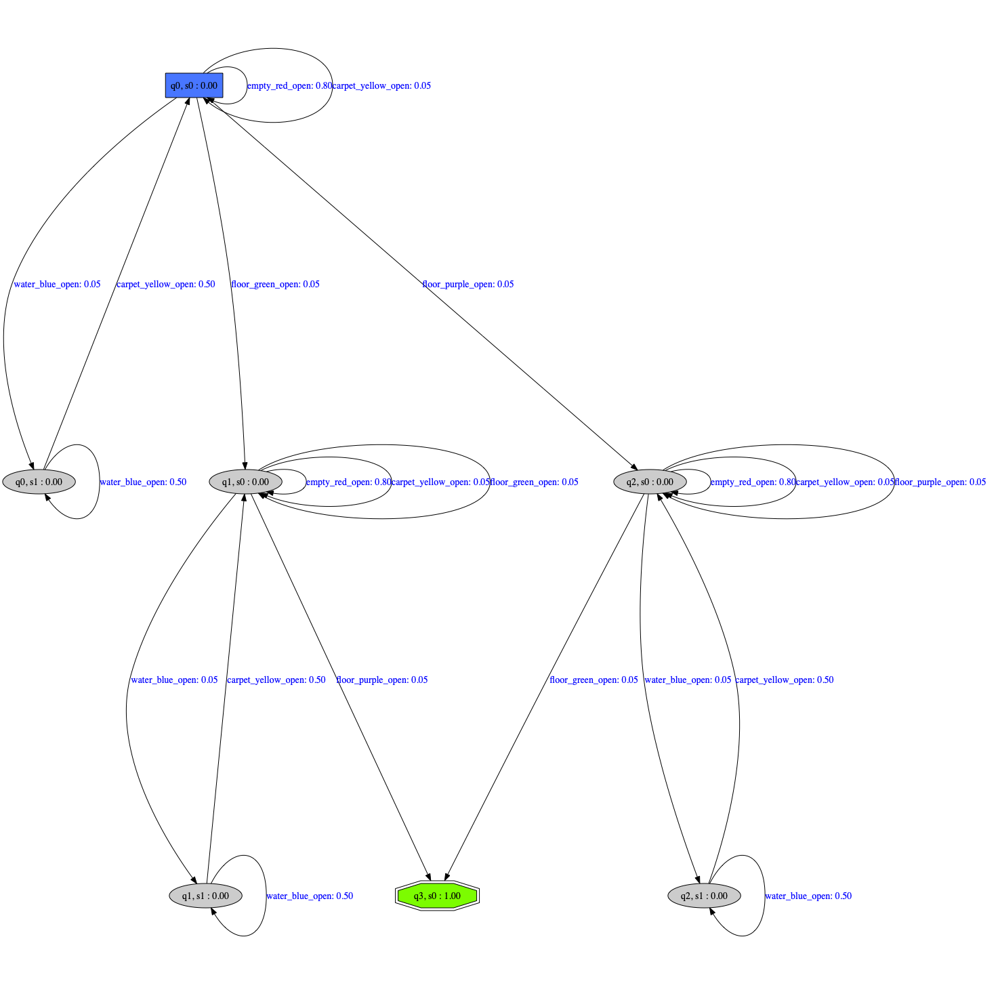

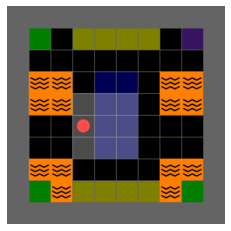

In [87]:
def load_automata_from_experiment(experiment_name, env_id, draw=False):
    path_data = get_experiment_paths(experiment_name)
    pdfa_model_config_file = path_data['PDFA_MODEL_CONFIG_FILE']
    dfa_model_config_file = path_data['DFA_MODEL_CONFIG_FILE']
    
    # cosafe
    cosafe_specification = active_automata.get(automaton_type='PDFA',
                                               graph_data=pdfa_model_config_file)
        
    # safe
    safe_specification = active_automata.get(automaton_type='DFA',
                                             graph_data=dfa_model_config_file)
    
    # pdfa
    pdfa_specification = active_automata.get(automaton_type='PDFA',
                                             graph_data=(cosafe_specification,
                                                         safe_specification),
                                             graph_data_format='existing_objects',
                                             normalize_trans_probabilities=True)
    
    # env
    env = gym.make(env_id)

    env = StaticMinigridTSWrapper(env, actions_type='simple_static',
                                  monitor_log_location=GYM_MONITOR_LOG_DIR)
    env.reset()

    minigrid_TS = active_automata.get(automaton_type='TS', graph_data=env,
                                      graph_data_format='minigrid')
    
    if draw: 
        cosafe_specification.draw('_'.join([EXPERIMENT_NAME, env_id, 'PDFA']))
        safe_specification.draw('_'.join([EXPERIMENT_NAME, env_id, 'DFA']))
        pdfa_specification.draw('_'.join([EXPERIMENT_NAME, env_id, 'SPECIFICATION']))
        env.render_notebook()
#         minigrid_TS.draw('_'.join([EXPERIMENT_NAME, env_id, 'TS']))
    
    return pdfa_specification, safe_specification, minigrid_TS


experiment_name = EXPERIMENT_NAME
env_id = ENV_ID_0

pdfa_specification, safe_specification, _ = load_automata_from_experiment(experiment_name, env_id, draw=True)

# Generate Data, Train, and Evaluate

In [88]:
dataloader = PDFADataLoader(pdfa_specification, LEARNER_DATA_DIR)

# param_dict = {'num_samples': [20, 40, 60, 80, 100],
num_samples = np.logspace(1, 4, num=100)
param_dict = {'num_samples': num_samples,
              'N': [20]}
dataloader.generate_datasets(param_dict)

KeyboardInterrupt: 

In [ ]:

param_dict = {'num_samples':  num_samples}
datasets = dataloader.select_datasets(param_dict)

# Create a pipeline
steps = [('clf', DummyEstimator())]
pipeline = Pipeline(steps=steps)

# Candidate learning algorithms and their hyperparameters
# param_dict = [{'clf': [VanillaSL(), PostprocessingSL(), GreedyEmbeddingSL(), PolynomialEmbeddingSL(), TargetSpecification()],
param_dict = [{'clf': [VanillaSL(), PostprocessingSL(), PolynomialEmbeddingSL(), TargetSpecification()],
# param_dict = [{'clf': [PolynomialEmbeddingSL(), TargetSpecification()],
               'clf__specification': [pdfa_specification],
               'clf__safe_specification': [safe_specification],
#                'clf__p': ['0.6']}]
               'clf__p': ['0.6', '5']}]

estimator = BatchEstimator(pipeline, param_dict)
estimator.fit(datasets)

In [ ]:
evaluation = ComparativeEvaluation(estimator.experiments)
evaluation._df

In [ ]:
evaluation.plot(x='num_samples', 
                selected_params={'p': '0.6', 'N': 20}, 
                figsize=(10, 8), 
                logx=True,
                logy=True,
                style={'PolynomialEmbeddingSL': '-o', 'PostprocessingSL': '-*'})
#                 style={'GreedyEmbeddingSL': '-x', 'PolynomialEmbeddingSL': '-o', 'PostprocessingSL': '-*'})

In [ ]:
evaluation.plot(x='num_samples', 
                selected_params={'p': '5', 'N': 20}, 
                figsize=(10, 8), 
                logx=True,
                style={'PolynomialEmbeddingSL': '-o', 'PostprocessingSL': '-*'})
#                 style={'GreedyEmbeddingSL': '-x', 'PolynomialEmbeddingSL': '-o', 'PostprocessingSL': '-*'})

# Now run with original environment with the original safe specification

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/systems/minigrid.py:717: RuntimeWarning: could not find any goal objects.
  warnings.warn(msg, RuntimeWarning)


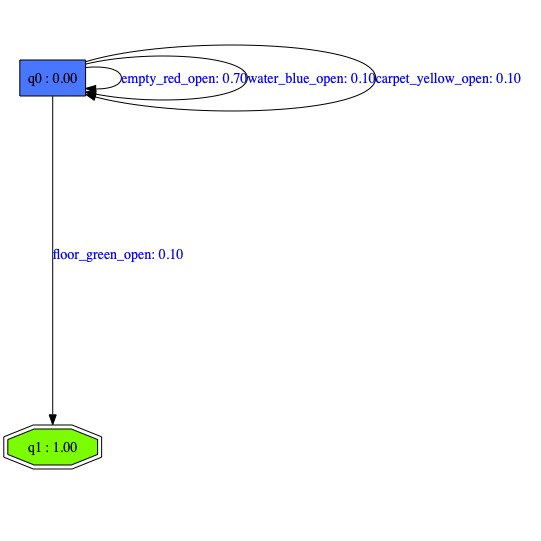

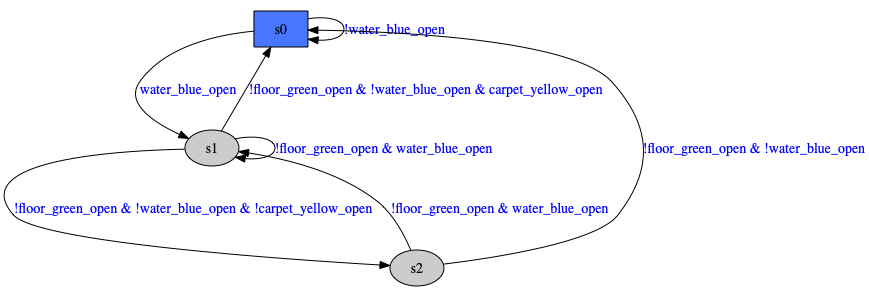

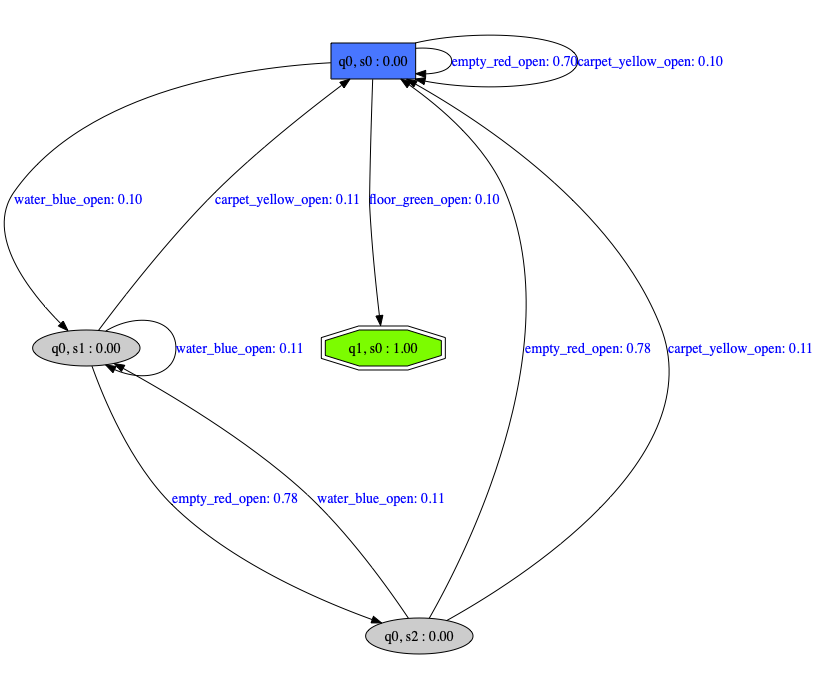

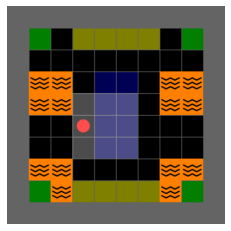

In [89]:
# env

experiment_name = 'merge_safety_to_seshia_paper'
env_id = ENV_ID_1

pdfa_specification, safe_specification, _ = load_automata_from_experiment(experiment_name, env_id, draw=True)

In [90]:
# Generate Datasets

dataloader = PDFADataLoader(pdfa_specification, LEARNER_DATA_DIR)
num_samples = np.logspace(1, 4, num=100)
param_dict = {'num_samples': num_samples,
              'N': [20]}
dataloader.generate_datasets(param_dict)

In [91]:
# load data  & fit estimators


param_dict = {'num_samples':  num_samples}
datasets = dataloader.select_datasets(param_dict)

# Create a pipeline
steps = [('clf', DummyEstimator())]
pipeline = Pipeline(steps=steps)

# Candidate learning algorithms and their hyperparameters
# param_dict = [{'clf': [VanillaSL(), PostprocessingSL(), GreedyEmbeddingSL(), PolynomialEmbeddingSL(), TargetSpecification()],
param_dict = [{'clf': [VanillaSL(), PostprocessingSL(), PolynomialEmbeddingSL(), TargetSpecification()],
               'clf__specification': [pdfa_specification],
               'clf__safe_specification': [safe_specification],
               'clf__p': ['0.6', '5']}]

estimator = BatchEstimator(pipeline, param_dict)
estimator.fit(datasets)

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 3 , red: 1
m99997 blue: 2 , red: 1
m99945 blue: 2 , red: 1
No Merge was successful
x6 blue: 1 , red: 2
No Merge was successful
x4 blue: 1 

loaded fdfa
{'N': 20, 'num_samples': 10.0, 'actual_num_samples': 10.0}
{'p': '5', 'clf': 'PolynomialEmbeddingSL'}
[]
0
{'N': 20, 'num_samples': 10.0, 'actual_num_samples': 10.0}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 10.0, 'actual_num_samples': 10.0}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
over

loaded fdfa
{'N': 20, 'num_samples': 10.722672220103231, 'actual_num_samples': 10.722672220103231}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (floor_green_open) is not found in the curr_state's (q0, s2) transition distribution
  warnings.warn(str(e))


{'N': 20, 'num_samples': 11.497569953977356, 'actual_num_samples': 11.497569953977356}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open']]
1
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (floor_green_open) is not found in the curr_state's (q0, s1) transition distribution
  warnings.warn(str(e))


{'N': 20, 'num_samples': 11.497569953977356, 'actual_num_samples': 11.497569953977356}
{'p': '5', 'clf': 'VanillaSL'}
[['carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'floor_green_open']]
1
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode s

{'N': 20, 'num_samples': 12.32846739442066, 'actual_num_samples': 12.32846739442066}
{'p': '0.6', 'clf': 'VanillaSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 3 , red: 1
m99998

{'N': 20, 'num_samples': 12.32846739442066, 'actual_num_samples': 12.32846739442066}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 12.32846739442066, 'actual_num_samples': 12.32846739442066}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldist

{'N': 20, 'num_samples': 13.219411484660288, 'actual_num_samples': 13.219411484660288}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selecte

loaded fdfa
{'N': 20, 'num_samples': 14.174741629268055, 'actual_num_samples': 14.174741629268055}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998 blue: 3 , red: 1
m99950 blue: 2 , red: 1
No Merge was succe

{'N': 20, 'num_samples': 16.297508346206442, 'actual_num_samples': 16.297508346206442}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 3 , red:

{'N': 20, 'num_samples': 17.47528400007684, 'actual_num_samples': 17.47528400007684}
{'p': '0.6', 'clf': 'VanillaSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 3 , red: 1
m99967

{'N': 20, 'num_samples': 17.47528400007684, 'actual_num_samples': 17.47528400007684}
{'p': '5', 'clf': 'PolynomialEmbeddingSL'}
[]
0
{'N': 20, 'num_samples': 17.47528400007684, 'actual_num_samples': 17.47528400007684}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 17.47528400007684, 'actual_num_samples': 17.47528400007684}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overla

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998 blue: 3 , red: 1
No Merge was successful
x18 blue: 4 , red:

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998 blue: 3 , red: 1
m99991 blue: 2 , red: 1
No Merge was successful
x28 blue: 5 , red: 2
m99994 blue: 4 , red: 2
m99978 blu

loaded fdfa
{'N': 20, 'num_samples': 20.09233002565047, 'actual_num_samples': 20.09233002565047}
{'p': '5', 'clf': 'PolynomialEmbeddingSL'}
[]
0
{'N': 20, 'num_samples': 20.09233002565047, 'actual_num_samples': 20.09233002565047}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 20.09233002565047, 'actual_num_samples': 20.09233002565047}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1

loaded fdfa
{'N': 20, 'num_samples': 21.544346900318846, 'actual_num_samples': 21.544346900318846}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

{'N': 20, 'num_samples': 23.101297000831604, 'actual_num_samples': 23.101297000831604}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red:

{'N': 20, 'num_samples': 24.770763559917114, 'actual_num_samples': 24.770763559917114}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open']]
1
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using eval

loaded fdfa
{'N': 20, 'num_samples': 24.770763559917114, 'actual_num_samples': 24.770763559917114}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

{'N': 20, 'num_samples': 26.560877829466868, 'actual_num_samples': 26.560877829466868}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 3 , red:

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 3 , red: 1
m99986 blue: 2 , red: 1
m99941 blue: 2 , red: 1
m99904 blue: 1 , red: 1
No Merge was successful
x23 blue: 0 , red: 2


found inte

{'N': 20, 'num_samples': 28.48035868435802, 'actual_num_samples': 28.48035868435802}
{'p': '5', 'clf': 'PolynomialEmbeddingSL'}
[]
0
{'N': 20, 'num_samples': 28.48035868435802, 'actual_num_samples': 28.48035868435802}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 28.48035868435802, 'actual_num_samples': 28.48035868435802}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overla

{'N': 20, 'num_samples': 30.538555088334157, 'actual_num_samples': 30.538555088334157}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 3 , red:

{'N': 20, 'num_samples': 32.74549162877728, 'actual_num_samples': 32.74549162877728}
{'p': '0.6', 'clf': 'VanillaSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998

loaded fdfa
{'N': 20, 'num_samples': 32.74549162877728, 'actual_num_samples': 32.74549162877728}
{'p': '5', 'clf': 'PolynomialEmbeddingSL'}
[]
0
{'N': 20, 'num_samples': 32.74549162877728, 'actual_num_samples': 32.74549162877728}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 32.74549162877728, 'actual_num_samples': 32.74549162877728}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1

{'N': 20, 'num_samples': 35.11191734215131, 'actual_num_samples': 35.11191734215131}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1

{'N': 20, 'num_samples': 37.64935806792467, 'actual_num_samples': 37.64935806792467}
{'p': '0.6', 'clf': 'VanillaSL'}
[['water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open']]
1
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Crea

loaded fdfa
{'N': 20, 'num_samples': 37.64935806792467, 'actual_num_samples': 37.64935806792467}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mo

{'N': 20, 'num_samples': 40.37017258596554, 'actual_num_samples': 40.37017258596554}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1

{'N': 20, 'num_samples': 43.28761281083057, 'actual_num_samples': 43.28761281083057}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'floor_green_open']]
1
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_dri

loaded fdfa
{'N': 20, 'num_samples': 43.28761281083057, 'actual_num_samples': 43.28761281083057}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mo

{'N': 20, 'num_samples': 46.4158883361278, 'actual_num_samples': 46.4158883361278}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m

{'N': 20, 'num_samples': 49.770235643321115, 'actual_num_samples': 49.770235643321115}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'water_blue_open', 'floor_green_open']]
2
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy

loaded fdfa
{'N': 20, 'num_samples': 49.770235643321115, 'actual_num_samples': 49.770235643321115}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99992 blue: 2 , red: 1
No Merge was successful
x74 blue: 5 , red: 2
m99991 blue: 4 , red: 2
m99990 blu

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99948 blue: 2 , red: 1
No Merge was success

{'N': 20, 'num_samples': 57.22367659350217, 'actual_num_samples': 57.22367659350217}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1

{'N': 20, 'num_samples': 61.35907273413173, 'actual_num_samples': 61.35907273413173}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'water_blue_open', 'floor_green_open'], ['carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open']]
4
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
e

loaded fdfa
{'N': 20, 'num_samples': 61.35907273413173, 'actual_num_samples': 61.35907273413173}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mo

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99990 blue: 3 , red: 1
m99988 blue: 2 , red: 1
No Merge was successful
x88 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99983 blu

loaded fdfa
{'N': 20, 'num_samples': 65.79332246575683, 'actual_num_samples': 65.79332246575683}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mo

{'N': 20, 'num_samples': 70.54802310718645, 'actual_num_samples': 70.54802310718645}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1

{'N': 20, 'num_samples': 75.64633275546291, 'actual_num_samples': 75.64633275546291}
{'p': '0.6', 'clf': 'VanillaSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99989

loaded fdfa
{'N': 20, 'num_samples': 75.64633275546291, 'actual_num_samples': 75.64633275546291}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mo

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99991 blue: 3 , red: 1
m99988 blue: 2 , red: 1
No Merge was successful
x108 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99991 bl

{'N': 20, 'num_samples': 81.11308307896873, 'actual_num_samples': 81.11308307896873}
{'p': '5', 'clf': 'PolynomialEmbeddingSL'}
[]
0
{'N': 20, 'num_samples': 81.11308307896873, 'actual_num_samples': 81.11308307896873}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 81.11308307896873, 'actual_num_samples': 81.11308307896873}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overla

{'N': 20, 'num_samples': 86.97490026177834, 'actual_num_samples': 86.97490026177834}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1

{'N': 20, 'num_samples': 93.26033468832199, 'actual_num_samples': 93.26033468832199}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open']]
2
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mini

loaded fdfa
{'N': 20, 'num_samples': 93.26033468832199, 'actual_num_samples': 93.26033468832199}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mo

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99989 blue: 3 , red: 1
m99990 blue: 2 , red: 1
No Merge was successful
x138 blue: 5 , red: 2
m99997 blue: 4 , red: 2
m99993 bl

loaded fdfa
{'N': 20, 'num_samples': 100.0, 'actual_num_samples': 100.0}
{'p': '5', 'clf': 'PolynomialEmbeddingSL'}
[]
0
{'N': 20, 'num_samples': 100.0, 'actual_num_samples': 100.0}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 100.0, 'actual_num_samples': 100.0}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 

{'N': 20, 'num_samples': 107.22672220103232, 'actual_num_samples': 107.22672220103232}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red:

{'N': 20, 'num_samples': 114.97569953977356, 'actual_num_samples': 114.97569953977356}
{'p': '0.6', 'clf': 'VanillaSL'}
[['water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'carpet_yellow_open', 'water_blue_open', 'carpet_yellow_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'empt

{'N': 20, 'num_samples': 114.97569953977356, 'actual_num_samples': 114.97569953977356}
{'p': '5', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
rea

{'N': 20, 'num_samples': 123.28467394420659, 'actual_num_samples': 123.28467394420659}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['carpet_yellow_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'water_blue_open', 'floor_green_open']]
6
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flex

loaded fdfa
{'N': 20, 'num_samples': 123.28467394420659, 'actual_num_samples': 123.28467394420659}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99991 blue: 3 , red: 1
m99991 blue: 2 , red: 1
No Merge was successful
x180 blue: 5 , red: 2
m99994 blue: 4 , red: 2
m99993 bl

{'N': 20, 'num_samples': 132.19411484660287, 'actual_num_samples': 132.19411484660287}
{'p': '5', 'clf': 'PolynomialEmbeddingSL'}
[]
0
{'N': 20, 'num_samples': 132.19411484660287, 'actual_num_samples': 132.19411484660287}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 132.19411484660287, 'actual_num_samples': 132.19411484660287}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_

{'N': 20, 'num_samples': 141.74741629268047, 'actual_num_samples': 141.74741629268047}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red:

{'N': 20, 'num_samples': 151.99110829529332, 'actual_num_samples': 151.99110829529332}
{'p': '0.6', 'clf': 'VanillaSL'}
[['carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open']]
4
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94

loaded fdfa
{'N': 20, 'num_samples': 151.99110829529332, 'actual_num_samples': 151.99110829529332}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99995 blue: 3 , red: 1
m99992 blue: 2 , red: 1
No Merge was successful
x224 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99992 bl

loaded fdfa
{'N': 20, 'num_samples': 162.97508346206433, 'actual_num_samples': 162.97508346206433}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

{'N': 20, 'num_samples': 174.7528400007683, 'actual_num_samples': 174.7528400007683}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'water_blue_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'floor_green_open']]
5
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: 

loaded fdfa
{'N': 20, 'num_samples': 174.7528400007683, 'actual_num_samples': 174.7528400007683}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mo

{'N': 20, 'num_samples': 187.3817422860383, 'actual_num_samples': 187.3817422860383}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'carpet_yellow_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open']]
5
welcome, running

loaded fdfa
{'N': 20, 'num_samples': 187.3817422860383, 'actual_num_samples': 187.3817422860383}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mo

{'N': 20, 'num_samples': 200.92330025650458, 'actual_num_samples': 200.92330025650458}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'floor_green_open']]
4
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/e

loaded fdfa
{'N': 20, 'num_samples': 200.92330025650458, 'actual_num_samples': 200.92330025650458}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

{'N': 20, 'num_samples': 215.44346900318845, 'actual_num_samples': 215.44346900318845}
{'p': '5', 'clf': 'VanillaSL'}
[['water_blue_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['carpet_yellow_open', 'water_blue_open', 'empty_red_open', 'floor_green_open']]
5
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-d

loaded fdfa
{'N': 20, 'num_samples': 215.44346900318845, 'actual_num_samples': 215.44346900318845}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

{'N': 20, 'num_samples': 231.01297000831605, 'actual_num_samples': 231.01297000831605}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open']]
6
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_

loaded fdfa
{'N': 20, 'num_samples': 231.01297000831605, 'actual_num_samples': 231.01297000831605}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99992 blue: 2 , red: 1
No Merge was successful
x342 blue: 5 , red: 2
m99994 blue: 4 , red: 2
m99993 bl

{'N': 20, 'num_samples': 247.70763559917114, 'actual_num_samples': 247.70763559917114}
{'p': '5', 'clf': 'PolynomialEmbeddingSL'}
[]
0
{'N': 20, 'num_samples': 247.70763559917114, 'actual_num_samples': 247.70763559917114}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 247.70763559917114, 'actual_num_samples': 247.70763559917114}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_

{'N': 20, 'num_samples': 265.6087782946687, 'actual_num_samples': 265.6087782946687}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'empty_red_open', 'water_blue_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'carpet_yellow_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'carpet_yellow_open', 'em

loaded fdfa
{'N': 20, 'num_samples': 265.6087782946687, 'actual_num_samples': 265.6087782946687}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mo

{'N': 20, 'num_samples': 284.8035868435802, 'actual_num_samples': 284.8035868435802}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open']]
8
welcome, running git commit c8fad5bd3b0c0dad0e28e

loaded fdfa
{'N': 20, 'num_samples': 284.8035868435802, 'actual_num_samples': 284.8035868435802}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mo

{'N': 20, 'num_samples': 305.3855508833416, 'actual_num_samples': 305.3855508833416}
{'p': '5', 'clf': 'VanillaSL'}
[['water_blue_open', 'floor_green_open'], ['empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'floor_green_open']]
5
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/researc

loaded fdfa
{'N': 20, 'num_samples': 305.3855508833416, 'actual_num_samples': 305.3855508833416}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mo

{'N': 20, 'num_samples': 327.45491628777285, 'actual_num_samples': 327.45491628777285}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'carpet_yellow_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['carpet_yellow_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'em

loaded fdfa
{'N': 20, 'num_samples': 327.45491628777285, 'actual_num_samples': 327.45491628777285}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

{'N': 20, 'num_samples': 351.1191734215131, 'actual_num_samples': 351.1191734215131}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['

loaded fdfa
{'N': 20, 'num_samples': 351.1191734215131, 'actual_num_samples': 351.1191734215131}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mo

{'N': 20, 'num_samples': 376.49358067924675, 'actual_num_samples': 376.49358067924675}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'em

loaded fdfa
{'N': 20, 'num_samples': 376.49358067924675, 'actual_num_samples': 376.49358067924675}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

{'N': 20, 'num_samples': 403.70172585965577, 'actual_num_samples': 403.70172585965577}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['water_blue_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_

loaded fdfa
{'N': 20, 'num_samples': 403.70172585965577, 'actual_num_samples': 403.70172585965577}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

{'N': 20, 'num_samples': 432.87612810830615, 'actual_num_samples': 432.87612810830615}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'carpet_yellow_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_r

loaded fdfa
{'N': 20, 'num_samples': 432.87612810830615, 'actual_num_samples': 432.87612810830615}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

{'N': 20, 'num_samples': 464.1588833612782, 'actual_num_samples': 464.1588833612782}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_

loaded fdfa
{'N': 20, 'num_samples': 464.1588833612782, 'actual_num_samples': 464.1588833612782}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mo

{'N': 20, 'num_samples': 497.7023564332114, 'actual_num_samples': 497.7023564332114}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'em

loaded fdfa
{'N': 20, 'num_samples': 497.7023564332114, 'actual_num_samples': 497.7023564332114}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mo

{'N': 20, 'num_samples': 533.6699231206312, 'actual_num_samples': 533.6699231206312}
{'p': '5', 'clf': 'VanillaSL'}
[['water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor

loaded fdfa
{'N': 20, 'num_samples': 533.6699231206312, 'actual_num_samples': 533.6699231206312}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mo

{'N': 20, 'num_samples': 572.236765935022, 'actual_num_samples': 572.236765935022}
{'p': '5', 'clf': 'VanillaSL'}
[['water_blue_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blu

loaded fdfa
{'N': 20, 'num_samples': 572.236765935022, 'actual_num_samples': 572.236765935022}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode

{'N': 20, 'num_samples': 613.5907273413176, 'actual_num_samples': 613.5907273413176}
{'p': '5', 'clf': 'VanillaSL'}
[['carpet_yellow_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'floor_green_open'], ['carpet_yellow_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'carpet_yellow_open', 'wate

{'N': 20, 'num_samples': 613.5907273413176, 'actual_num_samples': 613.5907273413176}
{'p': '5', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
readi

{'N': 20, 'num_samples': 657.9332246575682, 'actual_num_samples': 657.9332246575682}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', '

{'N': 20, 'num_samples': 657.9332246575682, 'actual_num_samples': 657.9332246575682}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1

{'N': 20, 'num_samples': 657.9332246575682, 'actual_num_samples': 657.9332246575682}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 657.9332246575682, 'actual_num_samples': 657.9332246575682}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldist

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99992 blue: 3 , red: 1
m99992 blue: 2 , red: 1
No Merge was successful
x984 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99994 bl

loaded fdfa
{'N': 20, 'num_samples': 705.4802310718645, 'actual_num_samples': 705.4802310718645}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mo

{'N': 20, 'num_samples': 756.463327554629, 'actual_num_samples': 756.463327554629}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'carpet_yellow_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['carpet_yellow

{'N': 20, 'num_samples': 756.463327554629, 'actual_num_samples': 756.463327554629}
{'p': '5', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading

{'N': 20, 'num_samples': 811.1308307896873, 'actual_num_samples': 811.1308307896873}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_ope

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99992 blue: 2 , red: 1
No Merge was successful
x1142 blue: 5 , red: 2
m99994 blue: 4 , red: 2
m99994 b

loaded fdfa
{'N': 20, 'num_samples': 811.1308307896873, 'actual_num_samples': 811.1308307896873}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mo

{'N': 20, 'num_samples': 869.7490026177834, 'actual_num_samples': 869.7490026177834}
{'p': '5', 'clf': 'VanillaSL'}
[['water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red

loaded fdfa
{'N': 20, 'num_samples': 869.7490026177834, 'actual_num_samples': 869.7490026177834}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mo

{'N': 20, 'num_samples': 932.60334688322, 'actual_num_samples': 932.60334688322}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'carpet_yellow_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'e

{'N': 20, 'num_samples': 932.60334688322, 'actual_num_samples': 932.60334688322}
{'p': '5', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading d

{'N': 20, 'num_samples': 1000.0, 'actual_num_samples': 1000.0}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'water_blue_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open'

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x1408 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99993 b

loaded fdfa
{'N': 20, 'num_samples': 1000.0, 'actual_num_samples': 1000.0}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading da

{'N': 20, 'num_samples': 1072.2672220103232, 'actual_num_samples': 1072.2672220103232}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty

{'N': 20, 'num_samples': 1072.2672220103232, 'actual_num_samples': 1072.2672220103232}
{'p': '5', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
rea

{'N': 20, 'num_samples': 1149.7569953977356, 'actual_num_samples': 1149.7569953977356}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'c

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99992 blue: 2 , red: 1
No Merge was successful
x1614 blue: 5 , red: 2
m99994 blue: 4 , red: 2
m99994 b

loaded fdfa
{'N': 20, 'num_samples': 1149.7569953977356, 'actual_num_samples': 1149.7569953977356}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

{'N': 20, 'num_samples': 1232.8467394420659, 'actual_num_samples': 1232.8467394420659}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'water_blue_open', 'floor_green_open'], ['carpet_yellow_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empt

{'N': 20, 'num_samples': 1232.8467394420659, 'actual_num_samples': 1232.8467394420659}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red:

{'N': 20, 'num_samples': 1232.8467394420659, 'actual_num_samples': 1232.8467394420659}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 1232.8467394420659, 'actual_num_samples': 1232.8467394420659}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kl

{'N': 20, 'num_samples': 1321.9411484660286, 'actual_num_samples': 1321.9411484660286}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'water_blue_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_bl

{'N': 20, 'num_samples': 1321.9411484660286, 'actual_num_samples': 1321.9411484660286}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red:

{'N': 20, 'num_samples': 1321.9411484660286, 'actual_num_samples': 1321.9411484660286}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , r

{'N': 20, 'num_samples': 1417.4741629268049, 'actual_num_samples': 1417.4741629268049}
{'p': '5', 'clf': 'VanillaSL'}
[['carpet_yellow_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'carpet_yellow_open', 'water_blue_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open',

{'N': 20, 'num_samples': 1417.4741629268049, 'actual_num_samples': 1417.4741629268049}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red:

{'N': 20, 'num_samples': 1417.4741629268049, 'actual_num_samples': 1417.4741629268049}
{'p': '5', 'clf': 'PolynomialEmbeddingSL'}
[]
0
{'N': 20, 'num_samples': 1417.4741629268049, 'actual_num_samples': 1417.4741629268049}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 1417.4741629268049, 'actual_num_samples': 1417.4741629268049}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_

{'N': 20, 'num_samples': 1519.9110829529332, 'actual_num_samples': 1519.9110829529332}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'carpet_yellow_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_re

{'N': 20, 'num_samples': 1519.9110829529332, 'actual_num_samples': 1519.9110829529332}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red:

loaded fdfa
{'N': 20, 'num_samples': 1519.9110829529332, 'actual_num_samples': 1519.9110829529332}
{'p': '5', 'clf': 'PolynomialEmbeddingSL'}
[]
0
{'N': 20, 'num_samples': 1519.9110829529332, 'actual_num_samples': 1519.9110829529332}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 1519.9110829529332, 'actual_num_samples': 1519.9110829529332}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_e

{'N': 20, 'num_samples': 1629.750834620645, 'actual_num_samples': 1629.750834620645}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['carpet_yellow_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_g

{'N': 20, 'num_samples': 1629.750834620645, 'actual_num_samples': 1629.750834620645}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1

{'N': 20, 'num_samples': 1747.5284000076847, 'actual_num_samples': 1747.5284000076847}
{'p': '0.6', 'clf': 'VanillaSL'}
[['water_blue_open', 'floor_green_open'], ['empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open

{'N': 20, 'num_samples': 1747.5284000076847, 'actual_num_samples': 1747.5284000076847}
{'p': '5', 'clf': 'VanillaSL'}
[['carpet_yellow_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'carpet_yellow_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_op

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99992 blue: 2 , red: 1
No Merge was successful
x2446 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99994 b

loaded fdfa
{'N': 20, 'num_samples': 1747.5284000076847, 'actual_num_samples': 1747.5284000076847}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

{'N': 20, 'num_samples': 1873.817422860385, 'actual_num_samples': 1873.817422860385}
{'p': '5', 'clf': 'VanillaSL'}
[['water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_

{'N': 20, 'num_samples': 1873.817422860385, 'actual_num_samples': 1873.817422860385}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1

{'N': 20, 'num_samples': 2009.2330025650479, 'actual_num_samples': 2009.2330025650479}
{'p': '0.6', 'clf': 'VanillaSL'}
[['water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_o

{'N': 20, 'num_samples': 2009.2330025650479, 'actual_num_samples': 2009.2330025650479}
{'p': '5', 'clf': 'VanillaSL'}
[['water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['carpet_yellow_open', 'water_blue_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open

{'N': 20, 'num_samples': 2009.2330025650479, 'actual_num_samples': 2009.2330025650479}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red:

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99992 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x2992 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99993 b

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99992 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99917 blue: 1 , red: 1
No Merge was successful
x1724 blue: 0 , red: 2


found in

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99992 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x2992 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99993 b

{'N': 20, 'num_samples': 2154.4346900318847, 'actual_num_samples': 2154.4346900318847}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selecte

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99992 blue: 2 , red: 1
m99916 blue: 1 , red: 1
No Merge was successful
x1848 blue: 0 , red: 2


found in

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99992 blue: 2 , red: 1
No Merge was successful
x3246 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99993 b

{'N': 20, 'num_samples': 2310.1297000831605, 'actual_num_samples': 2310.1297000831605}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selecte

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99914 blue: 1 , red: 1
No Merge was successful
x1982 blue: 0 , red: 2


found in

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x3462 blue: 5 , red: 2
m99992 blue: 4 , red: 2
m99992 b

{'N': 20, 'num_samples': 2477.0763559917114, 'actual_num_samples': 2477.0763559917114}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selecte

[Parallel(n_jobs=4)]: Done  29 tasks      | elapsed:    5.7s
[Parallel(n_jobs=4)]: Done  30 tasks      | elapsed:    5.8s
[Parallel(n_jobs=4)]: Done  31 tasks      | elapsed:    5.8s
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    5.8s
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    5.8s
[Parallel(n_jobs=4)]: Done  34 tasks      | elapsed:    5.8s
[Parallel(n_jobs=4)]: Done  35 tasks      | elapsed:    5.9s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    5.9s
[Parallel(n_jobs=4)]: Done  38 tasks      | elapsed:    5.9s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0966s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    5.9s
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    5.9s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    5.9s
[Parallel(n_jobs=4)]: Done  46 tasks      | elapsed:    5.9s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    5.9s
[Parallel(n_jobs=4)]: Done  50 tasks      | elapsed:    5.9s
[Pa

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99915 blue: 1 , red: 1
No Merge was successful
x2125 blue: 0 , red: 2


found in

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x3720 blue: 5 , red: 2
m99992 blue: 4 , red: 2
m99993 b

[Parallel(n_jobs=4)]: Done 138 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 140 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 142 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 146 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 148 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 150 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 158 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 160 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 162 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 164 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 166 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 532 out of 532 | elapsed:    6.8s finished
{'N': 20, 'num_samples': 2656.0877829466867, 'actual_num_samples': 2656.0877829466867}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode sel

loaded fdfa
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0328s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0695s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=

[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0789s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0808s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      

{'N': 20, 'num_samples': 2656.0877829466867, 'actual_num_samples': 2656.0877829466867}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0278s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0529s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.1s
[Parallel(n_jobs

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0288s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0969s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  1

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99915 blue: 1 , red: 1
No Merge was successful
x2279 blue: 0 , red: 2


found in

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x3986 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99992 b

[Parallel(n_jobs=4)]: Done 146 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 148 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 150 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 158 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 160 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 162 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 164 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 166 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 170 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 172 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 174 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 176 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 426 tasks      | elapsed:    6.3s
[Parallel(n_jobs=4)]: Done 428 tasks      | elapsed:    6.4s
[Parallel(n_jobs=4)]: Done 430 tasks      | elapsed:    6.4s
[Parallel(n_jobs=4)]: Done 432 tasks      | elapsed:    6.4s
[Parallel(n_jobs=4)]: Done 434 tasks      | elapsed:    6.5s
[Parallel(n_jobs=4)]: Done 436 tasks      | elapsed:    6.5s
[Parallel(n_jobs=4)]: Done 438 tasks      | elapsed:    6.5s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    6.5s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:    6.6s
[Parallel(n_jobs=4)]: Done 444 tasks      | elapsed:    6.6s
[Parallel(n_jobs=4)]: Done 446 tasks      | elapsed:    6.6s
[Parallel(n_jobs=4)]: Done 448 tasks      | elapsed:    6.7s
[Parallel(n_jobs=4)]: Done 450 tasks      | elapsed:    6.7s
[Parallel(n_jobs=4)]: Done 452 tasks      | elapsed:    6.7s
[Parallel(n_jobs=4)]: Done 454 tasks      | elapsed:    6.8s
[Parallel(n_jobs=4)]: Done 456 tasks      | elapsed:    6.8s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 409 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 410 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 411 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 412 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 413 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 414 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 415 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 447 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Do

loaded fdfa
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1274s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0966s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.3s
[Parallel(n_jobs=

[Parallel(n_jobs=4)]: Done   9 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0452s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0415s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  44 tasks      |

[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1482s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.6s
[P

[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 409 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 410 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 474 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 475 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 476 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 477 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 478 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 479 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 480 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 481 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0621s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1455s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  1

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99915 blue: 1 , red: 1
No Merge was successful
x2443 blue: 0 , red: 2


found in

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x4274 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99992 b

[Parallel(n_jobs=4)]: Done 140 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 142 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 146 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 148 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 150 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 158 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 160 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 162 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 164 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 166 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 170 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 414 tasks      | elapsed:    7.4s
[Parallel(n_jobs=4)]: Done 416 tasks      | elapsed:    7.4s
[Parallel(n_jobs=4)]: Done 418 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 420 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 422 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    7.6s
[Parallel(n_jobs=4)]: Done 426 tasks      | elapsed:    7.6s
[Parallel(n_jobs=4)]: Done 428 tasks      | elapsed:    7.7s
[Parallel(n_jobs=4)]: Done 430 tasks      | elapsed:    7.7s
[Parallel(n_jobs=4)]: Done 432 tasks      | elapsed:    7.7s
[Parallel(n_jobs=4)]: Done 434 tasks      | elapsed:    7.8s
[Parallel(n_jobs=4)]: Done 436 tasks      | elapsed:    7.8s
[Parallel(n_jobs=4)]: Done 438 tasks      | elapsed:    7.8s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 444 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0504s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0709s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  88 tasks      

loaded fdfa
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0225s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   9 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1533s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=

[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0532s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0703s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      

[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 506 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 508 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 510 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 512 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 514 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 516 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 518 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 520 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 548 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 550 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 552 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 554 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 556 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 558 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 560 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 562 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 564 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 566 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 570 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 572 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 574 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 576 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 578 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Do

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99992 blue: 2 , red: 1
m99915 blue: 1 , red: 1
No Merge was successful
x2620 blue: 0 , red: 2


found in

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99992 blue: 2 , red: 1
No Merge was successful
x4590 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99993 b

[Parallel(n_jobs=4)]: Done 134 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 138 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 140 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 142 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 146 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 148 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 150 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 158 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 160 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 162 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 164 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 406 tasks      | elapsed:    6.1s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    6.2s
[Parallel(n_jobs=4)]: Done 410 tasks      | elapsed:    6.2s
[Parallel(n_jobs=4)]: Done 412 tasks      | elapsed:    6.2s
[Parallel(n_jobs=4)]: Done 414 tasks      | elapsed:    6.2s
[Parallel(n_jobs=4)]: Done 416 tasks      | elapsed:    6.3s
[Parallel(n_jobs=4)]: Done 418 tasks      | elapsed:    6.3s
[Parallel(n_jobs=4)]: Done 420 tasks      | elapsed:    6.3s
[Parallel(n_jobs=4)]: Done 422 tasks      | elapsed:    6.4s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    6.4s
[Parallel(n_jobs=4)]: Done 426 tasks      | elapsed:    6.4s
[Parallel(n_jobs=4)]: Done 428 tasks      | elapsed:    6.5s
[Parallel(n_jobs=4)]: Done 430 tasks      | elapsed:    6.5s
[Parallel(n_jobs=4)]: Done 432 tasks      | elapsed:    6.5s
[Parallel(n_jobs=4)]: Done 434 tasks      | elapsed:    6.5s
[Parallel(n_jobs=4)]: Done 436 tasks      | elapsed:    6.5s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  60 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0772s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1859s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks     

[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1362s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1233s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  44 tasks      |

[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1713s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    0.9s
[P

[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1388s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.6s
[P

[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1586s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.8s
[P

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99915 blue: 1 , red: 1
No Merge was successful
x2809 blue: 0 , red: 2


found in

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x4916 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99993 b

[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 146 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 148 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 150 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 158 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 160 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 162 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 164 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 166 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Done 170 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Done 172 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Done 174 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 416 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Done 418 tasks      | elapsed:    8.1s
[Parallel(n_jobs=4)]: Done 420 tasks      | elapsed:    8.1s
[Parallel(n_jobs=4)]: Done 422 tasks      | elapsed:    8.1s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 426 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 428 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 430 tasks      | elapsed:    8.3s
[Parallel(n_jobs=4)]: Done 432 tasks      | elapsed:    8.3s
[Parallel(n_jobs=4)]: Done 434 tasks      | elapsed:    8.3s
[Parallel(n_jobs=4)]: Done 436 tasks      | elapsed:    8.4s
[Parallel(n_jobs=4)]: Done 438 tasks      | elapsed:    8.4s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    8.4s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:    8.4s
[Parallel(n_jobs=4)]: Done 444 tasks      | elapsed:    8.5s
[Parallel(n_jobs=4)]: Done 446 tasks      | elapsed:    8.5s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 688 tasks      | elapsed:   12.5s
[Parallel(n_jobs=4)]: Done 690 tasks      | elapsed:   12.5s
[Parallel(n_jobs=4)]: Done 692 tasks      | elapsed:   12.6s
[Parallel(n_jobs=4)]: Done 694 tasks      | elapsed:   12.6s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:   12.6s
[Parallel(n_jobs=4)]: Done 703 out of 703 | elapsed:   12.9s finished
{'N': 20, 'num_samples': 3511.191734215131, 'actual_num_samples': 3511.191734215131}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
con

loaded fdfa
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0967s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0906s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=

[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0562s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1580s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  88 tasks      

[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1044s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1833s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 184 tasks     

[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1821s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.6s
[P

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1215s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1135s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  1

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99992 blue: 2 , red: 1
m99914 blue: 1 , red: 1
No Merge was successful
x3012 blue: 0 , red: 2


found in

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99992 blue: 2 , red: 1
No Merge was successful
x5276 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99992 b

[Parallel(n_jobs=4)]: Done 132 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 134 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 138 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 140 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 142 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 146 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 148 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 150 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 158 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 160 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 162 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 406 tasks      | elapsed:    8.9s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    8.9s
[Parallel(n_jobs=4)]: Done 410 tasks      | elapsed:    9.0s
[Parallel(n_jobs=4)]: Done 412 tasks      | elapsed:    9.1s
[Parallel(n_jobs=4)]: Done 414 tasks      | elapsed:    9.1s
[Parallel(n_jobs=4)]: Done 416 tasks      | elapsed:    9.2s
[Parallel(n_jobs=4)]: Done 418 tasks      | elapsed:    9.2s
[Parallel(n_jobs=4)]: Done 420 tasks      | elapsed:    9.3s
[Parallel(n_jobs=4)]: Done 422 tasks      | elapsed:    9.4s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    9.4s
[Parallel(n_jobs=4)]: Done 426 tasks      | elapsed:    9.5s
[Parallel(n_jobs=4)]: Done 428 tasks      | elapsed:    9.6s
[Parallel(n_jobs=4)]: Done 430 tasks      | elapsed:    9.6s
[Parallel(n_jobs=4)]: Done 432 tasks      | elapsed:    9.7s
[Parallel(n_jobs=4)]: Done 434 tasks      | elapsed:    9.7s
[Parallel(n_jobs=4)]: Done 436 tasks      | elapsed:    9.8s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 678 tasks      | elapsed:   13.6s
[Parallel(n_jobs=4)]: Done 680 tasks      | elapsed:   13.6s
[Parallel(n_jobs=4)]: Done 682 tasks      | elapsed:   13.7s
[Parallel(n_jobs=4)]: Done 684 tasks      | elapsed:   13.7s
[Parallel(n_jobs=4)]: Done 686 tasks      | elapsed:   13.7s
[Parallel(n_jobs=4)]: Done 688 tasks      | elapsed:   13.8s
[Parallel(n_jobs=4)]: Done 690 tasks      | elapsed:   13.8s
[Parallel(n_jobs=4)]: Done 692 tasks      | elapsed:   13.8s
[Parallel(n_jobs=4)]: Done 694 tasks      | elapsed:   13.8s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:   13.9s
[Parallel(n_jobs=4)]: Done 698 tasks      | elapsed:   13.9s
[Parallel(n_jobs=4)]: Done 700 tasks      | elapsed:   13.9s
[Parallel(n_jobs=4)]: Done 702 tasks      | elapsed:   14.0s
[Parallel(n_jobs=4)]: Done 704 tasks      | elapsed:   14.0s
[Parallel(n_jobs=4)]: Done 706 tasks      | elapsed:   14.0s
[Parallel(n_jobs=4)]: Done 708 tasks      | elapsed:   14.1s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 719 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 722 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 725 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 731 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 734 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 746 out of 753 | elapsed:    2.0s remaining:    0.0s
[Parallel(n_jobs=4)]: Done 753 out of 753 | elapsed:    2.0s finished
{'N': 20, 'num_samples': 3764.9358067924672, 'actual_num_samples': 3764.9358067924672}
{'p': '5', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents

[Parallel(n_jobs=4)]: Done 456 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 488 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 520 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 552 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 584 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 616 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 648 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 649 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 665 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 681 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 264 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 296 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 328 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 360 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 264 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 296 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 328 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 360 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 392 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 456 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 360 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 392 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 456 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 488 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 520 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 552 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 584 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0694s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1008s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  1

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99992 blue: 2 , red: 1
m99915 blue: 1 , red: 1
No Merge was successful
x3230 blue: 0 , red: 2


found in

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99992 blue: 2 , red: 1
No Merge was successful
x5656 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99993 b

[Parallel(n_jobs=4)]: Done 236 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 240 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 244 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 252 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 256 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 260 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 264 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 268 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 272 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 276 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 284 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 288 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 292 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 296 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 808 out of 808 | elapsed:    7.8s finished
{'N': 20, 'num_samples': 4037.017258596554, 'actual_num_samples': 4037.017258596554}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selec

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99948 blue: 2 , red: 1
No Merge was succe

[Parallel(n_jobs=4)]: Done 771 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 772 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 773 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 774 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 775 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 777 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 778 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 779 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 780 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 781 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 782 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 783 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 784 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 785 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 786 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 801 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 808 out of 808 | elapsed:    1.6s finished
{'N': 20, 'num_samples': 4037.017258596554, 'actual_num_samples': 4037.017258596554}
{'p': '5', 'clf': 'PolynomialEmbeddingSL'}
[]
0
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0180s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch co

[Parallel(n_jobs=4)]: Done  26 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1159s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0758s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  96 tasks      

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1164s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  20 tasks      | elapse

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99913 blue: 1 , red: 1
No Merge was successful
x3463 blue: 0 , red: 2


found in

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x6126 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99992 b

[Parallel(n_jobs=4)]: Done 134 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 138 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 140 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 142 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 146 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 148 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 150 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 158 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 160 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Done 162 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Done 164 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 456 tasks      | elapsed:    7.6s
[Parallel(n_jobs=4)]: Done 460 tasks      | elapsed:    7.7s
[Parallel(n_jobs=4)]: Done 464 tasks      | elapsed:    7.8s
[Parallel(n_jobs=4)]: Done 468 tasks      | elapsed:    7.8s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    7.8s
[Parallel(n_jobs=4)]: Done 476 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 480 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 484 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Done 488 tasks      | elapsed:    8.1s
[Parallel(n_jobs=4)]: Done 492 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 496 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 500 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    8.3s
[Parallel(n_jobs=4)]: Done 508 tasks      | elapsed:    8.3s
[Parallel(n_jobs=4)]: Done 512 tasks      | elapsed:    8.4s
[Parallel(n_jobs=4)]: Done 516 tasks      | elapsed:    8.4s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0690s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  60 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0827s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  88 tasks      

loaded fdfa
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0862s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1428s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.3s
[Parallel(n_jobs=

[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0335s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0809s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  48 tasks      |

[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1605s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    1.0s
[P

[Parallel(n_jobs=4)]: Done 488 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 520 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 552 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 584 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 616 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 648 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 680 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 712 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0905s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1365s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  44 tasks      |

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99914 blue: 1 , red: 1
No Merge was successful
x3713 blue: 0 , red: 2


found in

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x6514 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99993 b

[Parallel(n_jobs=4)]: Done 146 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 148 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 150 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 158 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 160 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 162 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 164 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 166 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 170 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 172 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 174 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 176 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 428 tasks      | elapsed:    6.9s
[Parallel(n_jobs=4)]: Done 430 tasks      | elapsed:    6.9s
[Parallel(n_jobs=4)]: Done 432 tasks      | elapsed:    6.9s
[Parallel(n_jobs=4)]: Done 434 tasks      | elapsed:    7.0s
[Parallel(n_jobs=4)]: Done 436 tasks      | elapsed:    7.0s
[Parallel(n_jobs=4)]: Done 438 tasks      | elapsed:    7.1s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    7.1s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:    7.1s
[Parallel(n_jobs=4)]: Done 444 tasks      | elapsed:    7.2s
[Parallel(n_jobs=4)]: Done 446 tasks      | elapsed:    7.2s
[Parallel(n_jobs=4)]: Done 448 tasks      | elapsed:    7.3s
[Parallel(n_jobs=4)]: Done 450 tasks      | elapsed:    7.3s
[Parallel(n_jobs=4)]: Done 452 tasks      | elapsed:    7.4s
[Parallel(n_jobs=4)]: Done 454 tasks      | elapsed:    7.4s
[Parallel(n_jobs=4)]: Done 456 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 458 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 702 tasks      | elapsed:   12.1s
[Parallel(n_jobs=4)]: Done 704 tasks      | elapsed:   12.1s
[Parallel(n_jobs=4)]: Done 706 tasks      | elapsed:   12.2s
[Parallel(n_jobs=4)]: Done 708 tasks      | elapsed:   12.2s
[Parallel(n_jobs=4)]: Done 710 tasks      | elapsed:   12.2s
[Parallel(n_jobs=4)]: Done 712 tasks      | elapsed:   12.3s
[Parallel(n_jobs=4)]: Done 714 tasks      | elapsed:   12.3s
[Parallel(n_jobs=4)]: Done 716 tasks      | elapsed:   12.4s
[Parallel(n_jobs=4)]: Done 718 tasks      | elapsed:   12.4s
[Parallel(n_jobs=4)]: Done 720 tasks      | elapsed:   12.4s
[Parallel(n_jobs=4)]: Done 722 tasks      | elapsed:   12.5s
[Parallel(n_jobs=4)]: Done 724 tasks      | elapsed:   12.5s
[Parallel(n_jobs=4)]: Done 726 tasks      | elapsed:   12.6s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:   12.6s
[Parallel(n_jobs=4)]: Done 730 tasks      | elapsed:   12.6s
[Parallel(n_jobs=4)]: Done 732 tasks      | elapsed:   12.6s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1004s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  26 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0490s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  30 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  34 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      |

loaded fdfa
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0874s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1554s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.3s
[Parallel(n_jobs=

[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0646s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0520s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      |

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1937s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    1.7s
[P

[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 584 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 616 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 648 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 680 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 712 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 744 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 760 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 776 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 808 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1364s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done  60 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    1.2s
[Pa

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99914 blue: 1 , red: 1
No Merge was successful
x3982 blue: 0 , red: 2


found in

{'N': 20, 'num_samples': 4977.023564332114, 'actual_num_samples': 4977.023564332114}
{'p': '5', 'clf': 'VanillaSL'}
[['water_blue_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'empty_r

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x6984 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99993 b

[Parallel(n_jobs=4)]: Done 138 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 140 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 142 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Done 146 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Done 148 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Done 150 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    3.6s
[Parallel(n_jobs=4)]: Done 158 tasks      | elapsed:    3.6s
[Parallel(n_jobs=4)]: Done 160 tasks      | elapsed:    3.6s
[Parallel(n_jobs=4)]: Done 162 tasks      | elapsed:    3.7s
[Parallel(n_jobs=4)]: Done 164 tasks      | elapsed:    3.8s
[Parallel(n_jobs=4)]: Done 166 tasks      | elapsed:    3.8s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    3.9s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    9.5s
[Parallel(n_jobs=4)]: Done 410 tasks      | elapsed:    9.5s
[Parallel(n_jobs=4)]: Done 412 tasks      | elapsed:    9.5s
[Parallel(n_jobs=4)]: Done 414 tasks      | elapsed:    9.6s
[Parallel(n_jobs=4)]: Done 416 tasks      | elapsed:    9.7s
[Parallel(n_jobs=4)]: Done 418 tasks      | elapsed:    9.9s
[Parallel(n_jobs=4)]: Done 420 tasks      | elapsed:   10.0s
[Parallel(n_jobs=4)]: Done 422 tasks      | elapsed:   10.1s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:   10.3s
[Parallel(n_jobs=4)]: Done 426 tasks      | elapsed:   10.5s
[Parallel(n_jobs=4)]: Done 428 tasks      | elapsed:   10.5s
[Parallel(n_jobs=4)]: Done 430 tasks      | elapsed:   10.5s
[Parallel(n_jobs=4)]: Done 432 tasks      | elapsed:   10.6s
[Parallel(n_jobs=4)]: Done 434 tasks      | elapsed:   10.6s
[Parallel(n_jobs=4)]: Done 436 tasks      | elapsed:   10.7s
[Parallel(n_jobs=4)]: Done 438 tasks      | elapsed:   10.7s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 840 tasks      | elapsed:   15.3s
[Parallel(n_jobs=4)]: Done 844 tasks      | elapsed:   15.4s
[Parallel(n_jobs=4)]: Done 848 tasks      | elapsed:   15.4s
[Parallel(n_jobs=4)]: Done 852 tasks      | elapsed:   15.4s
[Parallel(n_jobs=4)]: Done 856 tasks      | elapsed:   15.5s
[Parallel(n_jobs=4)]: Done 860 tasks      | elapsed:   15.5s
[Parallel(n_jobs=4)]: Done 864 tasks      | elapsed:   15.6s
[Parallel(n_jobs=4)]: Done 868 tasks      | elapsed:   15.6s
[Parallel(n_jobs=4)]: Done 872 tasks      | elapsed:   15.6s
[Parallel(n_jobs=4)]: Done 876 tasks      | elapsed:   15.7s
[Parallel(n_jobs=4)]: Done 880 tasks      | elapsed:   15.8s
[Parallel(n_jobs=4)]: Done 884 tasks      | elapsed:   15.8s
[Parallel(n_jobs=4)]: Done 888 tasks      | elapsed:   15.9s
[Parallel(n_jobs=4)]: Done 892 tasks      | elapsed:   16.1s
[Parallel(n_jobs=4)]: Done 896 tasks      | elapsed:   16.1s
[Parallel(n_jobs=4)]: Done 900 tasks      | elapsed:   16.2s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 972 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 973 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 974 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 975 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 976 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 977 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 978 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 979 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 980 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 981 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 982 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 983 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 984 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 985 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 986 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 987 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 392 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 400 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 416 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 432 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 448 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 456 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 464 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 480 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 488 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 496 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 512 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1725s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.8s
[P

[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 760 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 760 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 794 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 796 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 828 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 830 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 832 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 834 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 866 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 868 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 870 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 872 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 874 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 876 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 878 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 880 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1490s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done  60 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.8s
[Pa

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99913 blue: 1 , red: 1
No Merge was successful
x4269 blue: 0 , red: 2


found in

{'N': 20, 'num_samples': 5336.699231206313, 'actual_num_samples': 5336.699231206313}
{'p': '5', 'clf': 'VanillaSL'}
[['water_blue_open', 'floor_green_open'], ['carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_ope

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x7436 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99992 b

[Parallel(n_jobs=4)]: Done 224 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 228 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 236 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 240 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 244 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 252 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 256 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 260 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 264 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 268 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 272 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 276 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 284 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 772 tasks      | elapsed:    7.3s
[Parallel(n_jobs=4)]: Done 776 tasks      | elapsed:    7.3s
[Parallel(n_jobs=4)]: Done 780 tasks      | elapsed:    7.4s
[Parallel(n_jobs=4)]: Done 784 tasks      | elapsed:    7.4s
[Parallel(n_jobs=4)]: Done 788 tasks      | elapsed:    7.4s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    7.4s
[Parallel(n_jobs=4)]: Done 796 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 800 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 804 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 808 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 812 tasks      | elapsed:    7.6s
[Parallel(n_jobs=4)]: Done 816 tasks      | elapsed:    7.6s
[Parallel(n_jobs=4)]: Done 820 tasks      | elapsed:    7.6s
[Parallel(n_jobs=4)]: Done 824 tasks      | elapsed:    7.7s
[Parallel(n_jobs=4)]: Done 828 tasks      | elapsed:    7.7s
[Parallel(n_jobs=4)]: Done 832 tasks      | elapsed:    7.7s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1712s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    1.2s
[P

loaded fdfa
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0438s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1889s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.3s
[Parallel(n_jobs=

[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0405s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0719s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  88 tasks      

[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1136s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.5s
[P

[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0718s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0852s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  1

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99992 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99914 blue: 1 , red: 1
No Merge was successful
x4578 blue: 0 , red: 2


found in

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99992 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x8016 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99993 b

[Parallel(n_jobs=4)]: Done 148 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 150 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 158 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1968s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done 160 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 162 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 164 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 166 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 170 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 172 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Done 174 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Done 176 tasks      | elapsed:    3.5s
[Pa

[Parallel(n_jobs=4)]: Done 652 tasks      | elapsed:    8.4s
[Parallel(n_jobs=4)]: Done 656 tasks      | elapsed:    8.4s
[Parallel(n_jobs=4)]: Done 660 tasks      | elapsed:    8.4s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    8.5s
[Parallel(n_jobs=4)]: Done 668 tasks      | elapsed:    8.5s
[Parallel(n_jobs=4)]: Done 672 tasks      | elapsed:    8.5s
[Parallel(n_jobs=4)]: Done 676 tasks      | elapsed:    8.5s
[Parallel(n_jobs=4)]: Done 680 tasks      | elapsed:    8.6s
[Parallel(n_jobs=4)]: Done 684 tasks      | elapsed:    8.6s
[Parallel(n_jobs=4)]: Done 688 tasks      | elapsed:    8.6s
[Parallel(n_jobs=4)]: Done 692 tasks      | elapsed:    8.6s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    8.7s
[Parallel(n_jobs=4)]: Done 700 tasks      | elapsed:    8.7s
[Parallel(n_jobs=4)]: Done 704 tasks      | elapsed:    8.7s
[Parallel(n_jobs=4)]: Done 708 tasks      | elapsed:    8.8s
[Parallel(n_jobs=4)]: Done 712 tasks      | elapsed:    8.8s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done  26 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0586s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  30 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0800s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  96 tasks      

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0372s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0854s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  1

[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1353s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.8s
[P

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99994 blue: 2 , red: 1
No Merge was successful
x8554 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99992 b

[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 680 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 712 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 744 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 760 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 776 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 808 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 824 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 840 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 856 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 872 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 888 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 904 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Do

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99994 blue: 2 , red: 1
m99913 blue: 1 , red: 1
No Merge was successful
x4908 blue: 0 , red: 2


found in

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99994 blue: 2 , red: 1
No Merge was successful
x8554 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99992 b

[Parallel(n_jobs=4)]: Done 320 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 328 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 336 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 352 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 360 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 368 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 384 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 392 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 400 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 416 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 432 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0779s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.4s
[P

loaded fdfa
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0290s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1311s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=

[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  26 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0371s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0663s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  80 tasks      

[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 824 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 856 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 888 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 920 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 952 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 984 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 1016 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 1048 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 1080 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 1082 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 1084 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 1086 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 1088 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 1120 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 1122 tasks      | elapsed:    1.8s
[Parallel(n_job

[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1721s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.8s
[P

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99913 blue: 1 , red: 1
No Merge was successful
x5264 blue: 0 , red: 2


found in

{'N': 20, 'num_samples': 6579.332246575683, 'actual_num_samples': 6579.332246575683}
{'p': '5', 'clf': 'VanillaSL'}
[['carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'wa

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x9140 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99992 b

[Parallel(n_jobs=4)]: Done 256 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 264 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 272 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 288 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 296 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 304 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 320 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 328 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 336 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 352 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 360 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 368 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Do

{'N': 20, 'num_samples': 6579.332246575683, 'actual_num_samples': 6579.332246575683}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1

{'N': 20, 'num_samples': 6579.332246575683, 'actual_num_samples': 6579.332246575683}
{'p': '5', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
readi

[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 760 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 824 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 856 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 888 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 920 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 952 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 984 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 1016 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 1048 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1080 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 1112 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)

[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 760 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 760 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 824 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 856 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 888 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 920 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 952 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 984 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 1016 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 1048 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 1080 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 1112 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)

[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 680 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 712 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 744 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 760 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 776 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 808 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 824 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 840 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 856 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 872 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 888 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 904 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0899s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1032s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  1

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99914 blue: 1 , red: 1
No Merge was successful
x5644 blue: 0 , red: 2


found in

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x9832 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99993 b

[Parallel(n_jobs=4)]: Done 132 tasks      | elapsed:    4.3s
[Parallel(n_jobs=4)]: Done 134 tasks      | elapsed:    4.4s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    4.5s
[Parallel(n_jobs=4)]: Done 138 tasks      | elapsed:    4.5s
[Parallel(n_jobs=4)]: Done 140 tasks      | elapsed:    4.6s
[Parallel(n_jobs=4)]: Done 142 tasks      | elapsed:    4.6s
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    4.7s
[Parallel(n_jobs=4)]: Done 146 tasks      | elapsed:    4.7s
[Parallel(n_jobs=4)]: Done 148 tasks      | elapsed:    4.8s
[Parallel(n_jobs=4)]: Done 150 tasks      | elapsed:    4.8s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    4.8s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    4.9s
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    4.9s
[Parallel(n_jobs=4)]: Done 158 tasks      | elapsed:    4.9s
[Parallel(n_jobs=4)]: Done 160 tasks      | elapsed:    5.0s
[Parallel(n_jobs=4)]: Done 162 tasks      | elapsed:    5.0s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 404 tasks      | elapsed:   10.1s
[Parallel(n_jobs=4)]: Done 406 tasks      | elapsed:   10.1s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:   10.1s
[Parallel(n_jobs=4)]: Done 410 tasks      | elapsed:   10.2s
[Parallel(n_jobs=4)]: Done 412 tasks      | elapsed:   10.2s
[Parallel(n_jobs=4)]: Done 414 tasks      | elapsed:   10.2s
[Parallel(n_jobs=4)]: Done 416 tasks      | elapsed:   10.3s
[Parallel(n_jobs=4)]: Done 418 tasks      | elapsed:   10.3s
[Parallel(n_jobs=4)]: Done 420 tasks      | elapsed:   10.3s
[Parallel(n_jobs=4)]: Done 422 tasks      | elapsed:   10.4s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:   10.4s
[Parallel(n_jobs=4)]: Done 426 tasks      | elapsed:   10.4s
[Parallel(n_jobs=4)]: Done 428 tasks      | elapsed:   10.5s
[Parallel(n_jobs=4)]: Done 430 tasks      | elapsed:   10.5s
[Parallel(n_jobs=4)]: Done 432 tasks      | elapsed:   10.7s
[Parallel(n_jobs=4)]: Done 434 tasks      | elapsed:   10.7s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 682 tasks      | elapsed:   14.9s
[Parallel(n_jobs=4)]: Done 684 tasks      | elapsed:   14.9s
[Parallel(n_jobs=4)]: Done 686 tasks      | elapsed:   14.9s
[Parallel(n_jobs=4)]: Done 688 tasks      | elapsed:   15.0s
[Parallel(n_jobs=4)]: Done 690 tasks      | elapsed:   15.0s
[Parallel(n_jobs=4)]: Done 692 tasks      | elapsed:   15.0s
[Parallel(n_jobs=4)]: Done 694 tasks      | elapsed:   15.1s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:   15.1s
[Parallel(n_jobs=4)]: Done 698 tasks      | elapsed:   15.1s
[Parallel(n_jobs=4)]: Done 700 tasks      | elapsed:   15.2s
[Parallel(n_jobs=4)]: Done 702 tasks      | elapsed:   15.2s
[Parallel(n_jobs=4)]: Done 704 tasks      | elapsed:   15.3s
[Parallel(n_jobs=4)]: Done 706 tasks      | elapsed:   15.3s
[Parallel(n_jobs=4)]: Done 708 tasks      | elapsed:   15.3s
[Parallel(n_jobs=4)]: Done 710 tasks      | elapsed:   15.4s
[Parallel(n_jobs=4)]: Done 712 tasks      | elapsed:   15.4s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 952 tasks      | elapsed:   19.6s
[Parallel(n_jobs=4)]: Done 954 tasks      | elapsed:   19.7s
[Parallel(n_jobs=4)]: Done 956 tasks      | elapsed:   19.7s
[Parallel(n_jobs=4)]: Done 958 tasks      | elapsed:   19.7s
[Parallel(n_jobs=4)]: Done 960 tasks      | elapsed:   19.8s
[Parallel(n_jobs=4)]: Done 962 tasks      | elapsed:   19.8s
[Parallel(n_jobs=4)]: Done 964 tasks      | elapsed:   19.8s
[Parallel(n_jobs=4)]: Done 966 tasks      | elapsed:   19.9s
[Parallel(n_jobs=4)]: Done 968 tasks      | elapsed:   19.9s
[Parallel(n_jobs=4)]: Done 970 tasks      | elapsed:   19.9s
[Parallel(n_jobs=4)]: Done 972 tasks      | elapsed:   20.0s
[Parallel(n_jobs=4)]: Done 974 tasks      | elapsed:   20.0s
[Parallel(n_jobs=4)]: Done 976 tasks      | elapsed:   20.0s
[Parallel(n_jobs=4)]: Done 978 tasks      | elapsed:   20.0s
[Parallel(n_jobs=4)]: Done 980 tasks      | elapsed:   20.1s
[Parallel(n_jobs=4)]: Done 982 tasks      | elapsed:   20.1s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 1228 tasks      | elapsed:   23.7s
[Parallel(n_jobs=4)]: Done 1232 tasks      | elapsed:   23.7s
[Parallel(n_jobs=4)]: Done 1236 tasks      | elapsed:   23.7s
[Parallel(n_jobs=4)]: Done 1240 tasks      | elapsed:   23.8s
[Parallel(n_jobs=4)]: Done 1244 tasks      | elapsed:   23.8s
[Parallel(n_jobs=4)]: Done 1248 tasks      | elapsed:   23.8s
[Parallel(n_jobs=4)]: Done 1252 tasks      | elapsed:   23.9s
[Parallel(n_jobs=4)]: Done 1256 tasks      | elapsed:   23.9s
[Parallel(n_jobs=4)]: Done 1260 tasks      | elapsed:   23.9s
[Parallel(n_jobs=4)]: Done 1264 tasks      | elapsed:   23.9s
[Parallel(n_jobs=4)]: Done 1268 tasks      | elapsed:   24.0s
[Parallel(n_jobs=4)]: Done 1272 tasks      | elapsed:   24.0s
[Parallel(n_jobs=4)]: Done 1276 tasks      | elapsed:   24.0s
[Parallel(n_jobs=4)]: Done 1280 tasks      | elapsed:   24.0s
[Parallel(n_jobs=4)]: Done 1284 tasks      | elapsed:   24.1s
[Parallel(n_jobs=4)]: Done 1288 tasks      | elapsed:   24.1s
[Paralle

[Parallel(n_jobs=4)]: Done 760 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 824 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 856 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 888 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 920 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 952 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 984 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 1016 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 1048 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 1080 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 1112 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 1176 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1208 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 1240 tasks      | elapsed:    2.4s
[Parallel(n_jobs

[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 264 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 296 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 328 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0492s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0667s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 104 tasks      

[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 760 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 824 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 856 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 888 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 920 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 952 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 984 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 1016 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 1048 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 1080 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 1112 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0603s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  20 tasks      | elapse

{'N': 20, 'num_samples': 7564.633275546291, 'actual_num_samples': 7564.633275546291}
{'p': '0.6', 'clf': 'VanillaSL'}
[['carpet_yellow_open', 'empty_red_open', 'carpet_yellow_open', 'carpet_yellow_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_o

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99913 blue: 1 , red: 1
No Merge was successful
x6052 blue: 0 , red: 2


found in

[Parallel(n_jobs=4)]: Done 1482 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1484 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1486 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1488 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1490 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1492 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1494 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1496 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1498 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1500 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1506 out of 1513 | elapsed:    2.6s remaining:    0.0s
[Parallel(n_jobs=4)]: Done 1513 out of 1513 | elapsed:    2.6s finished
{'N': 20, 'num_samples': 7564.633275546291, 'actual_num_samples': 7564.633275546291}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x10626 blue: 5 , red: 2
m99994 blue: 4 , red: 2
m99993 

[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 252 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 256 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 260 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 264 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 268 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 272 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 276 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 284 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 288 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 292 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 296 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 300 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 304 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 308 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 804 tasks      | elapsed:    7.1s
[Parallel(n_jobs=4)]: Done 808 tasks      | elapsed:    7.1s
[Parallel(n_jobs=4)]: Done 812 tasks      | elapsed:    7.2s
[Parallel(n_jobs=4)]: Done 816 tasks      | elapsed:    7.2s
[Parallel(n_jobs=4)]: Done 820 tasks      | elapsed:    7.3s
[Parallel(n_jobs=4)]: Done 824 tasks      | elapsed:    7.3s
[Parallel(n_jobs=4)]: Done 828 tasks      | elapsed:    7.3s
[Parallel(n_jobs=4)]: Done 832 tasks      | elapsed:    7.4s
[Parallel(n_jobs=4)]: Done 836 tasks      | elapsed:    7.4s
[Parallel(n_jobs=4)]: Done 840 tasks      | elapsed:    7.4s
[Parallel(n_jobs=4)]: Done 844 tasks      | elapsed:    7.4s
[Parallel(n_jobs=4)]: Done 848 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 852 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 856 tasks      | elapsed:    7.6s
[Parallel(n_jobs=4)]: Done 860 tasks      | elapsed:    7.6s
[Parallel(n_jobs=4)]: Done 864 tasks      | elapsed:    7.6s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 1340 tasks      | elapsed:   12.0s
[Parallel(n_jobs=4)]: Done 1344 tasks      | elapsed:   12.0s
[Parallel(n_jobs=4)]: Done 1348 tasks      | elapsed:   12.1s
[Parallel(n_jobs=4)]: Done 1352 tasks      | elapsed:   12.1s
[Parallel(n_jobs=4)]: Done 1356 tasks      | elapsed:   12.2s
[Parallel(n_jobs=4)]: Done 1360 tasks      | elapsed:   12.2s
[Parallel(n_jobs=4)]: Done 1364 tasks      | elapsed:   12.3s
[Parallel(n_jobs=4)]: Done 1368 tasks      | elapsed:   12.3s
[Parallel(n_jobs=4)]: Done 1372 tasks      | elapsed:   12.4s
[Parallel(n_jobs=4)]: Done 1376 tasks      | elapsed:   12.4s
[Parallel(n_jobs=4)]: Done 1380 tasks      | elapsed:   12.4s
[Parallel(n_jobs=4)]: Done 1384 tasks      | elapsed:   12.5s
[Parallel(n_jobs=4)]: Done 1388 tasks      | elapsed:   12.5s
[Parallel(n_jobs=4)]: Done 1392 tasks      | elapsed:   12.6s
[Parallel(n_jobs=4)]: Done 1396 tasks      | elapsed:   12.6s
[Parallel(n_jobs=4)]: Done 1400 tasks      | elapsed:   12.7s
[Paralle

[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 712 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 744 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 760 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 776 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 808 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 824 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 840 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 856 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 872 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 888 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 904 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 920 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 936 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Do

loaded fdfa
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0720s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0879s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=

[Parallel(n_jobs=4)]: Done 1477 tasks      | elapsed:    4.1s
[Parallel(n_jobs=4)]: Done 1478 tasks      | elapsed:    4.1s
[Parallel(n_jobs=4)]: Done 1479 tasks      | elapsed:    4.1s
[Parallel(n_jobs=4)]: Done 1480 tasks      | elapsed:    4.1s
[Parallel(n_jobs=4)]: Done 1481 tasks      | elapsed:    4.1s
[Parallel(n_jobs=4)]: Done 1482 tasks      | elapsed:    4.1s
[Parallel(n_jobs=4)]: Done 1483 tasks      | elapsed:    4.1s
[Parallel(n_jobs=4)]: Done 1484 tasks      | elapsed:    4.1s
[Parallel(n_jobs=4)]: Done 1485 tasks      | elapsed:    4.2s
[Parallel(n_jobs=4)]: Done 1486 tasks      | elapsed:    4.2s
[Parallel(n_jobs=4)]: Done 1487 tasks      | elapsed:    4.2s
[Parallel(n_jobs=4)]: Done 1488 tasks      | elapsed:    4.2s
[Parallel(n_jobs=4)]: Done 1489 tasks      | elapsed:    4.2s
[Parallel(n_jobs=4)]: Done 1490 tasks      | elapsed:    4.2s
[Parallel(n_jobs=4)]: Done 1491 tasks      | elapsed:    4.2s
[Parallel(n_jobs=4)]: Done 1492 tasks      | elapsed:    4.3s
[Paralle

[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 1176 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 1208 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1240 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 1272 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 1304 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1306 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1308 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1340 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1372 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1374 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1376 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1378 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1380 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1382 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1384 tasks      | elapsed:    2.7s
[Paralle

[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 760 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 824 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 856 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 888 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 920 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 952 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 984 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1016 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1048 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1080 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1112 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1176 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1208 tasks      | elapsed:    3.3s
[Parallel(n_jobs=

[Parallel(n_jobs=4)]: Done 1048 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1080 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1112 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1176 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 1208 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 1240 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 1272 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1304 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1306 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1338 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 1340 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 1342 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 1374 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 1376 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 1378 tasks      | elapsed:    3.3s
[Paralle

[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1966s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  26 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  30 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.5s
[Pa

[Parallel(n_jobs=4)]: Done 1616 tasks      | elapsed:    4.3s
[Parallel(n_jobs=4)]: Done 1623 out of 1623 | elapsed:    4.4s finished
{'N': 20, 'num_samples': 8111.308307896872, 'actual_num_samples': 8111.308307896872}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'carpet_yellow_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'water_blue_op

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99913 blue: 1 , red: 1
No Merge was successful
x6489 blue: 0 , red: 2


found in

[Parallel(n_jobs=4)]: Done 1600 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1602 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1604 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1606 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1608 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1610 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1616 out of 1623 | elapsed:    2.8s remaining:    0.0s
[Parallel(n_jobs=4)]: Done 1623 out of 1623 | elapsed:    2.8s finished
{'N': 20, 'num_samples': 8111.308307896872, 'actual_num_samples': 8111.308307896872}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x11360 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99993 

[Parallel(n_jobs=4)]: Done 140 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 142 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 146 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 148 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 150 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 158 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 160 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 162 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 164 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 166 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 170 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 418 tasks      | elapsed:    7.3s
[Parallel(n_jobs=4)]: Done 420 tasks      | elapsed:    7.3s
[Parallel(n_jobs=4)]: Done 422 tasks      | elapsed:    7.4s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    7.4s
[Parallel(n_jobs=4)]: Done 426 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 428 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 430 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 432 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 434 tasks      | elapsed:    7.6s
[Parallel(n_jobs=4)]: Done 436 tasks      | elapsed:    7.6s
[Parallel(n_jobs=4)]: Done 438 tasks      | elapsed:    7.6s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    7.7s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:    7.7s
[Parallel(n_jobs=4)]: Done 444 tasks      | elapsed:    7.7s
[Parallel(n_jobs=4)]: Done 446 tasks      | elapsed:    7.8s
[Parallel(n_jobs=4)]: Done 448 tasks      | elapsed:    7.8s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 694 tasks      | elapsed:   11.7s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:   11.7s
[Parallel(n_jobs=4)]: Done 698 tasks      | elapsed:   11.7s
[Parallel(n_jobs=4)]: Done 700 tasks      | elapsed:   11.8s
[Parallel(n_jobs=4)]: Done 702 tasks      | elapsed:   11.8s
[Parallel(n_jobs=4)]: Done 704 tasks      | elapsed:   11.8s
[Parallel(n_jobs=4)]: Done 706 tasks      | elapsed:   11.8s
[Parallel(n_jobs=4)]: Done 708 tasks      | elapsed:   11.9s
[Parallel(n_jobs=4)]: Done 710 tasks      | elapsed:   11.9s
[Parallel(n_jobs=4)]: Done 712 tasks      | elapsed:   11.9s
[Parallel(n_jobs=4)]: Done 714 tasks      | elapsed:   12.0s
[Parallel(n_jobs=4)]: Done 716 tasks      | elapsed:   12.1s
[Parallel(n_jobs=4)]: Done 718 tasks      | elapsed:   12.1s
[Parallel(n_jobs=4)]: Done 720 tasks      | elapsed:   12.1s
[Parallel(n_jobs=4)]: Done 722 tasks      | elapsed:   12.2s
[Parallel(n_jobs=4)]: Done 724 tasks      | elapsed:   12.2s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 1080 tasks      | elapsed:   15.8s
[Parallel(n_jobs=4)]: Done 1084 tasks      | elapsed:   15.8s
[Parallel(n_jobs=4)]: Done 1088 tasks      | elapsed:   15.9s
[Parallel(n_jobs=4)]: Done 1092 tasks      | elapsed:   15.9s
[Parallel(n_jobs=4)]: Done 1096 tasks      | elapsed:   15.9s
[Parallel(n_jobs=4)]: Done 1100 tasks      | elapsed:   16.0s
[Parallel(n_jobs=4)]: Done 1104 tasks      | elapsed:   16.0s
[Parallel(n_jobs=4)]: Done 1108 tasks      | elapsed:   16.1s
[Parallel(n_jobs=4)]: Done 1112 tasks      | elapsed:   16.1s
[Parallel(n_jobs=4)]: Done 1116 tasks      | elapsed:   16.1s
[Parallel(n_jobs=4)]: Done 1120 tasks      | elapsed:   16.1s
[Parallel(n_jobs=4)]: Done 1124 tasks      | elapsed:   16.1s
[Parallel(n_jobs=4)]: Done 1128 tasks      | elapsed:   16.2s
[Parallel(n_jobs=4)]: Done 1132 tasks      | elapsed:   16.2s
[Parallel(n_jobs=4)]: Done 1136 tasks      | elapsed:   16.2s
[Parallel(n_jobs=4)]: Done 1140 tasks      | elapsed:   16.3s
[Paralle

[Parallel(n_jobs=4)]: Done 1615 tasks      | elapsed:   20.2s
[Parallel(n_jobs=4)]: Done 1616 tasks      | elapsed:   20.2s
[Parallel(n_jobs=4)]: Done 1623 out of 1623 | elapsed:   20.4s finished
{'N': 20, 'num_samples': 8111.308307896872, 'actual_num_samples': 8111.308307896872}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4log

[Parallel(n_jobs=4)]: Done 1572 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1574 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1576 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1578 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1580 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1582 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1584 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1586 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1588 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1590 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1592 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1594 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1596 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1598 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1600 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1602 tasks      | elapsed:    3.2s
[Paralle

[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 264 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 296 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0576s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0791s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  80 tasks      

[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1345s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.5s
[P

[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0388s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1774s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  1

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99912 blue: 1 , red: 1
No Merge was successful
x6958 blue: 0 , red: 2


found in

[Parallel(n_jobs=4)]: Done 1716 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1718 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1720 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1722 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1724 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1726 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1740 out of 1740 | elapsed:    2.8s finished
{'N': 20, 'num_samples': 8697.490026177835, 'actual_num_samples': 8697.490026177835}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open',

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x12156 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99993 

[Parallel(n_jobs=4)]: Done 244 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 252 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 256 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 260 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 264 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 268 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 272 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 276 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 284 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 288 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 292 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 296 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 300 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 304 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 784 tasks      | elapsed:    6.2s
[Parallel(n_jobs=4)]: Done 788 tasks      | elapsed:    6.2s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    6.2s
[Parallel(n_jobs=4)]: Done 796 tasks      | elapsed:    6.3s
[Parallel(n_jobs=4)]: Done 800 tasks      | elapsed:    6.3s
[Parallel(n_jobs=4)]: Done 804 tasks      | elapsed:    6.3s
[Parallel(n_jobs=4)]: Done 808 tasks      | elapsed:    6.3s
[Parallel(n_jobs=4)]: Done 812 tasks      | elapsed:    6.4s
[Parallel(n_jobs=4)]: Done 816 tasks      | elapsed:    6.4s
[Parallel(n_jobs=4)]: Done 820 tasks      | elapsed:    6.4s
[Parallel(n_jobs=4)]: Done 824 tasks      | elapsed:    6.5s
[Parallel(n_jobs=4)]: Done 828 tasks      | elapsed:    6.5s
[Parallel(n_jobs=4)]: Done 832 tasks      | elapsed:    6.5s
[Parallel(n_jobs=4)]: Done 836 tasks      | elapsed:    6.6s
[Parallel(n_jobs=4)]: Done 840 tasks      | elapsed:    6.6s
[Parallel(n_jobs=4)]: Done 844 tasks      | elapsed:    6.7s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 1332 tasks      | elapsed:   10.9s
[Parallel(n_jobs=4)]: Done 1336 tasks      | elapsed:   11.0s
[Parallel(n_jobs=4)]: Done 1340 tasks      | elapsed:   11.0s
[Parallel(n_jobs=4)]: Done 1344 tasks      | elapsed:   11.0s
[Parallel(n_jobs=4)]: Done 1348 tasks      | elapsed:   11.0s
[Parallel(n_jobs=4)]: Done 1352 tasks      | elapsed:   11.1s
[Parallel(n_jobs=4)]: Done 1356 tasks      | elapsed:   11.1s
[Parallel(n_jobs=4)]: Done 1360 tasks      | elapsed:   11.1s
[Parallel(n_jobs=4)]: Done 1364 tasks      | elapsed:   11.1s
[Parallel(n_jobs=4)]: Done 1368 tasks      | elapsed:   11.2s
[Parallel(n_jobs=4)]: Done 1372 tasks      | elapsed:   11.2s
[Parallel(n_jobs=4)]: Done 1376 tasks      | elapsed:   11.2s
[Parallel(n_jobs=4)]: Done 1380 tasks      | elapsed:   11.3s
[Parallel(n_jobs=4)]: Done 1384 tasks      | elapsed:   11.3s
[Parallel(n_jobs=4)]: Done 1388 tasks      | elapsed:   11.3s
[Parallel(n_jobs=4)]: Done 1392 tasks      | elapsed:   11.4s
[Paralle

[Parallel(n_jobs=4)]: Done  26 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0323s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  30 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  34 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0757s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  96 tasks      

loaded fdfa
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0554s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1416s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.3s
[Parallel(n_jobs=

[Parallel(n_jobs=4)]: Done 1689 tasks      | elapsed:    4.3s
[Parallel(n_jobs=4)]: Done 1705 tasks      | elapsed:    4.3s
[Parallel(n_jobs=4)]: Done 1706 tasks      | elapsed:    4.3s
[Parallel(n_jobs=4)]: Done 1707 tasks      | elapsed:    4.3s
[Parallel(n_jobs=4)]: Done 1708 tasks      | elapsed:    4.3s
[Parallel(n_jobs=4)]: Done 1724 tasks      | elapsed:    4.4s
[Parallel(n_jobs=4)]: Done 1725 tasks      | elapsed:    4.4s
[Parallel(n_jobs=4)]: Done 1726 tasks      | elapsed:    4.4s
[Parallel(n_jobs=4)]: Done 1727 tasks      | elapsed:    4.4s
[Parallel(n_jobs=4)]: Done 1728 tasks      | elapsed:    4.5s
[Parallel(n_jobs=4)]: Done 1729 tasks      | elapsed:    4.5s
[Parallel(n_jobs=4)]: Done 1730 tasks      | elapsed:    4.5s
[Parallel(n_jobs=4)]: Done 1731 tasks      | elapsed:    4.5s
[Parallel(n_jobs=4)]: Done 1732 tasks      | elapsed:    4.5s
[Parallel(n_jobs=4)]: Done 1733 tasks      | elapsed:    4.5s
[Parallel(n_jobs=4)]: Done 1740 out of 1740 | elapsed:    4.5s finishe

[Parallel(n_jobs=4)]: Done 1614 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 1616 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 1618 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 1620 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1622 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1624 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1656 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1658 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1660 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1662 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1664 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1666 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1668 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1670 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1702 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1704 tasks      | elapsed:    2.6s
[Paralle

[Parallel(n_jobs=4)]: Done 1700 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1702 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1704 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1706 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1708 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1710 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1712 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1714 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1716 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1718 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1720 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1722 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1724 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1726 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1740 out of 1740 | elapsed:    2.8s finished
{'N': 20, 'num_samples': 8697.490026177835, 'actual_num_samp

[Parallel(n_jobs=4)]: Done 1740 out of 1740 | elapsed:    2.7s finished
{'N': 20, 'num_samples': 8697.490026177835, 'actual_num_samples': 8697.490026177835}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode 

[Parallel(n_jobs=4)]: Done 824 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 856 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 888 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 920 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 952 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 984 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 1016 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 1048 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 1080 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 1112 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1176 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1208 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 1240 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1272 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1304 tasks      | elapsed:    2.7s
[Parallel(n_jo

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99914 blue: 1 , red: 1
No Merge was successful
x7461 blue: 0 , red: 2


found in

{'N': 20, 'num_samples': 9326.0334688322, 'actual_num_samples': 9326.0334688322}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', '

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x13040 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99993 

[Parallel(n_jobs=4)]: Done 138 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 140 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 142 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 146 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 148 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 150 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 158 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Done 160 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Done 162 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 164 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 166 tasks      | elapsed:    3.6s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    3.6s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    7.7s
[Parallel(n_jobs=4)]: Done 410 tasks      | elapsed:    7.8s
[Parallel(n_jobs=4)]: Done 412 tasks      | elapsed:    7.8s
[Parallel(n_jobs=4)]: Done 414 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 416 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 418 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 420 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 422 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Done 426 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Done 428 tasks      | elapsed:    8.1s
[Parallel(n_jobs=4)]: Done 430 tasks      | elapsed:    8.1s
[Parallel(n_jobs=4)]: Done 432 tasks      | elapsed:    8.1s
[Parallel(n_jobs=4)]: Done 434 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 436 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 438 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 682 tasks      | elapsed:   14.0s
[Parallel(n_jobs=4)]: Done 684 tasks      | elapsed:   14.0s
[Parallel(n_jobs=4)]: Done 686 tasks      | elapsed:   14.1s
[Parallel(n_jobs=4)]: Done 688 tasks      | elapsed:   14.1s
[Parallel(n_jobs=4)]: Done 690 tasks      | elapsed:   14.1s
[Parallel(n_jobs=4)]: Done 692 tasks      | elapsed:   14.2s
[Parallel(n_jobs=4)]: Done 694 tasks      | elapsed:   14.2s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:   14.3s
[Parallel(n_jobs=4)]: Done 698 tasks      | elapsed:   14.3s
[Parallel(n_jobs=4)]: Done 700 tasks      | elapsed:   14.3s
[Parallel(n_jobs=4)]: Done 702 tasks      | elapsed:   14.4s
[Parallel(n_jobs=4)]: Done 704 tasks      | elapsed:   14.4s
[Parallel(n_jobs=4)]: Done 706 tasks      | elapsed:   14.5s
[Parallel(n_jobs=4)]: Done 708 tasks      | elapsed:   14.5s
[Parallel(n_jobs=4)]: Done 710 tasks      | elapsed:   14.6s
[Parallel(n_jobs=4)]: Done 712 tasks      | elapsed:   14.6s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 954 tasks      | elapsed:   19.3s
[Parallel(n_jobs=4)]: Done 956 tasks      | elapsed:   19.4s
[Parallel(n_jobs=4)]: Done 958 tasks      | elapsed:   19.4s
[Parallel(n_jobs=4)]: Done 960 tasks      | elapsed:   19.4s
[Parallel(n_jobs=4)]: Done 962 tasks      | elapsed:   19.5s
[Parallel(n_jobs=4)]: Done 964 tasks      | elapsed:   19.5s
[Parallel(n_jobs=4)]: Done 966 tasks      | elapsed:   19.5s
[Parallel(n_jobs=4)]: Done 968 tasks      | elapsed:   19.6s
[Parallel(n_jobs=4)]: Done 970 tasks      | elapsed:   19.6s
[Parallel(n_jobs=4)]: Done 972 tasks      | elapsed:   19.6s
[Parallel(n_jobs=4)]: Done 974 tasks      | elapsed:   19.7s
[Parallel(n_jobs=4)]: Done 976 tasks      | elapsed:   19.7s
[Parallel(n_jobs=4)]: Done 978 tasks      | elapsed:   19.7s
[Parallel(n_jobs=4)]: Done 980 tasks      | elapsed:   19.8s
[Parallel(n_jobs=4)]: Done 982 tasks      | elapsed:   19.8s
[Parallel(n_jobs=4)]: Done 984 tasks      | elapsed:   19.8s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 1224 tasks      | elapsed:   24.2s
[Parallel(n_jobs=4)]: Done 1226 tasks      | elapsed:   24.2s
[Parallel(n_jobs=4)]: Done 1228 tasks      | elapsed:   24.3s
[Parallel(n_jobs=4)]: Done 1230 tasks      | elapsed:   24.3s
[Parallel(n_jobs=4)]: Done 1232 tasks      | elapsed:   24.4s
[Parallel(n_jobs=4)]: Done 1234 tasks      | elapsed:   24.5s
[Parallel(n_jobs=4)]: Done 1236 tasks      | elapsed:   24.6s
[Parallel(n_jobs=4)]: Done 1238 tasks      | elapsed:   24.6s
[Parallel(n_jobs=4)]: Done 1240 tasks      | elapsed:   24.7s
[Parallel(n_jobs=4)]: Done 1242 tasks      | elapsed:   24.7s
[Parallel(n_jobs=4)]: Done 1244 tasks      | elapsed:   24.7s
[Parallel(n_jobs=4)]: Done 1246 tasks      | elapsed:   24.8s
[Parallel(n_jobs=4)]: Done 1248 tasks      | elapsed:   24.8s
[Parallel(n_jobs=4)]: Done 1250 tasks      | elapsed:   24.9s
[Parallel(n_jobs=4)]: Done 1252 tasks      | elapsed:   24.9s
[Parallel(n_jobs=4)]: Done 1254 tasks      | elapsed:   24.9s
[Paralle

[Parallel(n_jobs=4)]: Done 1490 tasks      | elapsed:   30.1s
[Parallel(n_jobs=4)]: Done 1492 tasks      | elapsed:   30.1s
[Parallel(n_jobs=4)]: Done 1494 tasks      | elapsed:   30.2s
[Parallel(n_jobs=4)]: Done 1496 tasks      | elapsed:   30.2s
[Parallel(n_jobs=4)]: Done 1498 tasks      | elapsed:   30.2s
[Parallel(n_jobs=4)]: Done 1500 tasks      | elapsed:   30.3s
[Parallel(n_jobs=4)]: Done 1502 tasks      | elapsed:   30.3s
[Parallel(n_jobs=4)]: Done 1504 tasks      | elapsed:   30.3s
[Parallel(n_jobs=4)]: Done 1506 tasks      | elapsed:   30.4s
[Parallel(n_jobs=4)]: Done 1508 tasks      | elapsed:   30.5s
[Parallel(n_jobs=4)]: Done 1510 tasks      | elapsed:   30.5s
[Parallel(n_jobs=4)]: Done 1512 tasks      | elapsed:   30.5s
[Parallel(n_jobs=4)]: Done 1514 tasks      | elapsed:   30.6s
[Parallel(n_jobs=4)]: Done 1516 tasks      | elapsed:   30.6s
[Parallel(n_jobs=4)]: Done 1518 tasks      | elapsed:   30.7s
[Parallel(n_jobs=4)]: Done 1520 tasks      | elapsed:   30.7s
[Paralle

[Parallel(n_jobs=4)]: Done 1764 tasks      | elapsed:   35.3s
[Parallel(n_jobs=4)]: Done 1766 tasks      | elapsed:   35.3s
[Parallel(n_jobs=4)]: Done 1768 tasks      | elapsed:   35.4s
[Parallel(n_jobs=4)]: Done 1770 tasks      | elapsed:   35.4s
[Parallel(n_jobs=4)]: Done 1772 tasks      | elapsed:   35.4s
[Parallel(n_jobs=4)]: Done 1774 tasks      | elapsed:   35.5s
[Parallel(n_jobs=4)]: Done 1776 tasks      | elapsed:   35.5s
[Parallel(n_jobs=4)]: Done 1778 tasks      | elapsed:   35.5s
[Parallel(n_jobs=4)]: Done 1780 tasks      | elapsed:   35.6s
[Parallel(n_jobs=4)]: Done 1782 tasks      | elapsed:   35.6s
[Parallel(n_jobs=4)]: Done 1784 tasks      | elapsed:   35.6s
[Parallel(n_jobs=4)]: Done 1786 tasks      | elapsed:   35.7s
[Parallel(n_jobs=4)]: Done 1788 tasks      | elapsed:   35.7s
[Parallel(n_jobs=4)]: Done 1790 tasks      | elapsed:   35.8s
[Parallel(n_jobs=4)]: Done 1792 tasks      | elapsed:   35.8s
[Parallel(n_jobs=4)]: Done 1794 tasks      | elapsed:   35.8s
[Paralle

[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 520 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 552 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 584 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 616 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 648 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 680 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 712 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 744 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Do

loaded fdfa
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0717s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  20 tasks  

[Parallel(n_jobs=4)]: Done 1836 tasks      | elapsed:    6.1s
[Parallel(n_jobs=4)]: Done 1837 tasks      | elapsed:    6.2s
[Parallel(n_jobs=4)]: Done 1838 tasks      | elapsed:    6.2s
[Parallel(n_jobs=4)]: Done 1839 tasks      | elapsed:    6.2s
[Parallel(n_jobs=4)]: Done 1840 tasks      | elapsed:    6.2s
[Parallel(n_jobs=4)]: Done 1841 tasks      | elapsed:    6.2s
[Parallel(n_jobs=4)]: Done 1842 tasks      | elapsed:    6.3s
[Parallel(n_jobs=4)]: Done 1843 tasks      | elapsed:    6.3s
[Parallel(n_jobs=4)]: Done 1844 tasks      | elapsed:    6.3s
[Parallel(n_jobs=4)]: Done 1845 tasks      | elapsed:    6.3s
[Parallel(n_jobs=4)]: Done 1846 tasks      | elapsed:    6.3s
[Parallel(n_jobs=4)]: Done 1847 tasks      | elapsed:    6.4s
[Parallel(n_jobs=4)]: Done 1848 tasks      | elapsed:    6.4s
[Parallel(n_jobs=4)]: Done 1849 tasks      | elapsed:    6.4s
[Parallel(n_jobs=4)]: Done 1850 tasks      | elapsed:    6.4s
[Parallel(n_jobs=4)]: Done 1851 tasks      | elapsed:    6.4s
[Paralle

[Parallel(n_jobs=4)]: Done 1336 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1368 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1400 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1432 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1464 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1496 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1528 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1560 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 1592 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 1624 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 1656 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1688 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1690 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1692 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1694 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1696 tasks      | elapsed:    3.1s
[Paralle

[Parallel(n_jobs=4)]: Done 1240 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 1272 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 1304 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 1336 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 1368 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1400 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1432 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1464 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 1496 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 1528 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 1560 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1592 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1624 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1656 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1688 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1690 tasks      | elapsed:    2.7s
[Paralle

[Parallel(n_jobs=4)]: Done 1820 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1822 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1824 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1826 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1828 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1830 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1832 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1834 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1836 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1838 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1840 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1842 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1844 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1846 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1848 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1850 tasks      | elapsed:    2.8s
[Paralle

[Parallel(n_jobs=4)]: Done 328 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 360 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 392 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 456 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 488 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 520 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 552 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Do

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99913 blue: 1 , red: 1
No Merge was successful
x8000 blue: 0 , red: 2


found in

{'N': 20, 'num_samples': 10000.0, 'actual_num_samples': 10000.0}
{'p': '5', 'clf': 'VanillaSL'}
[['water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['carpet_yellow_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_o

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99993 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x13962 blue: 5 , red: 2
m99993 blue: 4 , red: 2
m99993 

[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 288 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 296 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 304 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 320 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 328 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 336 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 352 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 360 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 368 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 384 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 392 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 400 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 1352 tasks      | elapsed:    6.5s
[Parallel(n_jobs=4)]: Done 1360 tasks      | elapsed:    6.6s
[Parallel(n_jobs=4)]: Done 1368 tasks      | elapsed:    6.6s
[Parallel(n_jobs=4)]: Done 1376 tasks      | elapsed:    6.6s
[Parallel(n_jobs=4)]: Done 1384 tasks      | elapsed:    6.7s
[Parallel(n_jobs=4)]: Done 1392 tasks      | elapsed:    6.7s
[Parallel(n_jobs=4)]: Done 1400 tasks      | elapsed:    6.7s
[Parallel(n_jobs=4)]: Done 1408 tasks      | elapsed:    6.7s
[Parallel(n_jobs=4)]: Done 1416 tasks      | elapsed:    6.8s
[Parallel(n_jobs=4)]: Done 1424 tasks      | elapsed:    6.8s
[Parallel(n_jobs=4)]: Done 1432 tasks      | elapsed:    6.9s
[Parallel(n_jobs=4)]: Done 1440 tasks      | elapsed:    6.9s
[Parallel(n_jobs=4)]: Done 1448 tasks      | elapsed:    6.9s
[Parallel(n_jobs=4)]: Done 1456 tasks      | elapsed:    6.9s
[Parallel(n_jobs=4)]: Done 1464 tasks      | elapsed:    7.0s
[Parallel(n_jobs=4)]: Done 1472 tasks      | elapsed:    7.0s
[Paralle

[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0913s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.3s
[Pa

[Parallel(n_jobs=4)]: Done 1928 tasks      | elapsed:    4.7s
[Parallel(n_jobs=4)]: Done 1944 tasks      | elapsed:    4.7s
[Parallel(n_jobs=4)]: Done 1960 tasks      | elapsed:    4.7s
[Parallel(n_jobs=4)]: Done 1961 tasks      | elapsed:    4.8s
[Parallel(n_jobs=4)]: Done 1962 tasks      | elapsed:    4.8s
[Parallel(n_jobs=4)]: Done 1978 tasks      | elapsed:    4.8s
[Parallel(n_jobs=4)]: Done 1979 tasks      | elapsed:    4.8s
[Parallel(n_jobs=4)]: Done 1980 tasks      | elapsed:    4.8s
[Parallel(n_jobs=4)]: Done 1981 tasks      | elapsed:    4.8s
[Parallel(n_jobs=4)]: Done 1982 tasks      | elapsed:    4.8s
[Parallel(n_jobs=4)]: Done 1983 tasks      | elapsed:    4.8s
[Parallel(n_jobs=4)]: Done 1984 tasks      | elapsed:    4.8s
[Parallel(n_jobs=4)]: Done 1985 tasks      | elapsed:    4.8s
[Parallel(n_jobs=4)]: Done 1986 tasks      | elapsed:    4.8s
[Parallel(n_jobs=4)]: Done 1987 tasks      | elapsed:    4.8s
[Parallel(n_jobs=4)]: Done 1988 tasks      | elapsed:    4.9s
[Paralle

[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 128 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 160 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 176 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 1208 tasks      | elapsed:    5.3s
[Parallel(n_jobs=4)]: Done 1224 tasks      | elapsed:    5.3s
[Parallel(n_jobs=4)]: Done 1240 tasks      | elapsed:    5.4s
[Parallel(n_jobs=4)]: Done 1256 tasks      | elapsed:    5.4s
[Parallel(n_jobs=4)]: Done 1272 tasks      | elapsed:    5.5s
[Parallel(n_jobs=4)]: Done 1288 tasks      | elapsed:    5.6s
[Parallel(n_jobs=4)]: Done 1304 tasks      | elapsed:    5.6s
[Parallel(n_jobs=4)]: Done 1320 tasks      | elapsed:    5.6s
[Parallel(n_jobs=4)]: Done 1336 tasks      | elapsed:    5.7s
[Parallel(n_jobs=4)]: Done 1352 tasks      | elapsed:    5.7s
[Parallel(n_jobs=4)]: Done 1368 tasks      | elapsed:    5.8s
[Parallel(n_jobs=4)]: Done 1384 tasks      | elapsed:    5.8s
[Parallel(n_jobs=4)]: Done 1400 tasks      | elapsed:    5.9s
[Parallel(n_jobs=4)]: Done 1416 tasks      | elapsed:    6.0s
[Parallel(n_jobs=4)]: Done 1432 tasks      | elapsed:    6.1s
[Parallel(n_jobs=4)]: Done 1448 tasks      | elapsed:    6.1s
[Paralle

[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 264 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 296 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 328 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 360 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Do

{'N': 20, 'num_samples': 10000.0, 'actual_num_samples': 10000.0}
{'p': '5', 'clf': 'PolynomialEmbeddingSL'}
[]
0
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0305s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0483s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  14 tasks  

[Parallel(n_jobs=4)]: Done 1986 tasks      | elapsed:    4.2s
[Parallel(n_jobs=4)]: Done 2000 out of 2000 | elapsed:    4.2s finished
{'N': 20, 'num_samples': 10000.0, 'actual_num_samples': 10000.0}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0151s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fas

{'N': 20, 'num_samples': 10000.0, 'actual_num_samples': 10000.0}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0


In [92]:
evaluation = ComparativeEvaluation(estimator.experiments)
evaluation._df

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (water_blue_open) is not found in the curr_state's (q23) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (water_blue_open) is not found in the curr_state's (q23, s0) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (water_blue_open) is not found in the curr_state's (q19) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:415: RuntimeWarning: divide by zero encountered in log
  target_logscore = np.asscalar(np.log(target_prob) / np.log(base))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given s

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (empty_red_open) is not found in the curr_state's (q46) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (empty_red_open) is not found in the curr_state's (q46, s0) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (carpet_yellow_open) is not found in the curr_state's (q29) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (carpet_yellow_open) is not found in the curr_state's (q98) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: Use

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (water_blue_open) is not found in the curr_state's (q126) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (floor_green_open) is not found in the curr_state's (q192) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (floor_green_open) is not found in the curr_state's (q9) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (floor_green_open) is not found in the curr_state's (q9, s0) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: User

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (water_blue_open) is not found in the curr_state's (q107, s0) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (water_blue_open) is not found in the curr_state's (q200) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (floor_green_open) is not found in the curr_state's (q190) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (carpet_yellow_open) is not found in the curr_state's (q377) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209:

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (floor_green_open) is not found in the curr_state's (q545) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (carpet_yellow_open) is not found in the curr_state's (q1015) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (water_blue_open) is not found in the curr_state's (q1370) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (carpet_yellow_open) is not found in the curr_state's (q349) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209

,KL Divergence,L2 Norm of Trace Probabilities,L1 Norm of Trace Probabilities,No. of Nodes,Elapsed Time,Safe,N,num_samples,actual_num_samples,p,clf,pdfa
0,-0.004669,0.003039,0.003040,4,0.028624,0,20,10.0,10.0,0.6,VanillaSL,"(q0, q19, q23, q30)"
1,-0.002334,0.000977,0.001318,2,0.010172,0,20,10.0,10.0,5,VanillaSL,"(q0, q47)"
2,0.000107,0.000158,0.000165,8,0.012185,1,20,10.0,10.0,0.6,PostprocessingSL,"(q0, s0, q19, s1, q30, s0, q19, s2, q23, s1, q..."
3,-0.010287,0.004715,0.006668,4,0.008631,1,20,10.0,10.0,5,PostprocessingSL,"(q0, s0, q0, s1, q47, s0, q0, s2)"
4,0.000435,0.000610,0.000688,5,0.010935,1,20,10.0,10.0,0.6,PolynomialEmbeddingSL,"(q0, q19, q20, q21, q47)"
...,...,...,...,...,...,...,...,...,...,...,...,...
795,-0.008019,0.000155,0.005197,4,0.287819,1,20,10000.0,10000.0,5,PostprocessingSL,"(q0, s0, q0, s1, q5, s0, q0, s2)"
796,-0.006362,0.000124,0.004207,26,0.776790,1,20,10000.0,10000.0,0.6,PolynomialEmbeddingSL,"(q0, q5, q79, q80, q88, q173, q6357, q9134, q1..."
797,-0.000034,0.000002,0.000085,4,0.301936,1,20,10000.0,10000.0,5,PolynomialEmbeddingSL,"(q0, q5, q79, q80)"
798,0.000000,0.000000,0.000000,4,0.000000,1,20,10000.0,10000.0,0.6,TargetSpecification,"(q0, s0, q0, s1, q1, s0, q0, s2)"


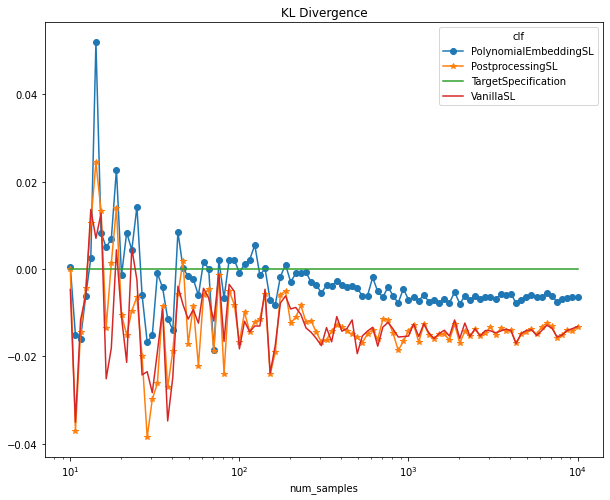

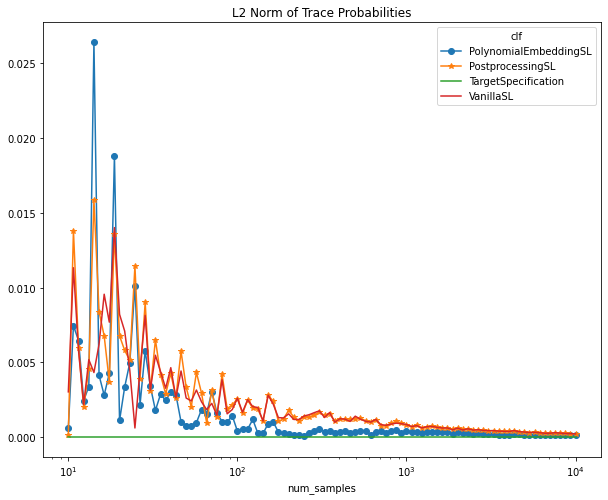

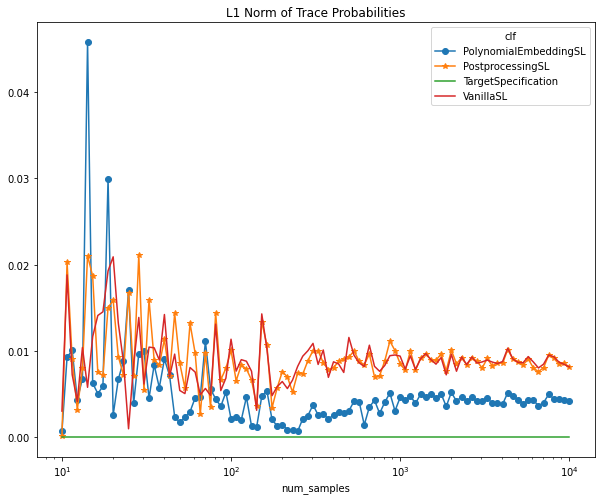

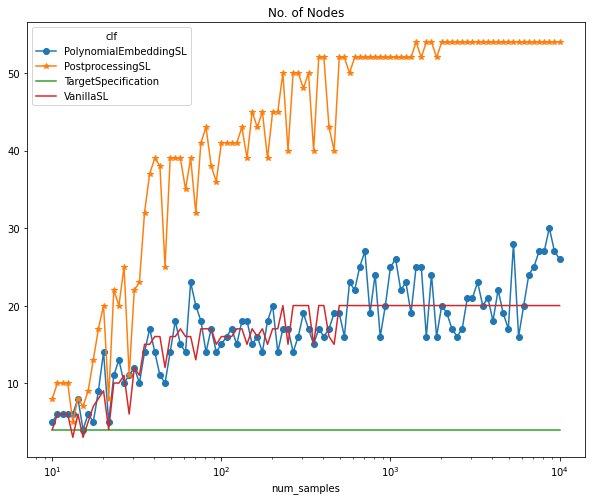

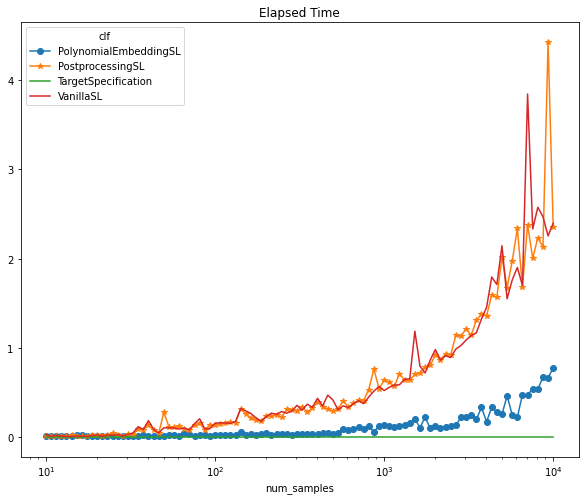

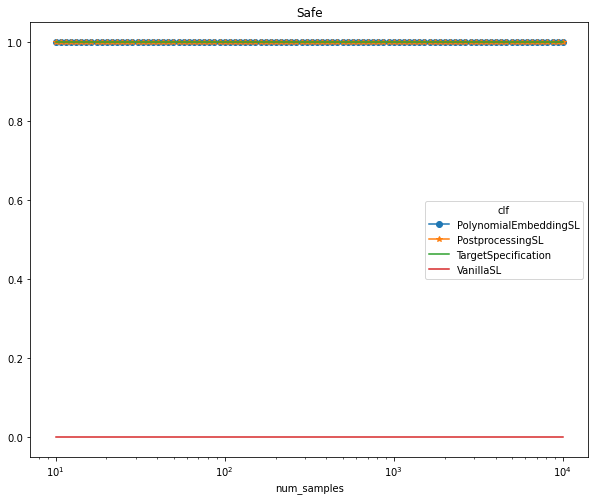

In [93]:
# Plot
evaluation.plot(x='num_samples', 
                selected_params={'p': '0.6', 'N': 20}, 
                figsize=(10, 8), 
                logx=True,
#                 logy=True,
                style={'PolynomialEmbeddingSL': '-o', 'PostprocessingSL': '-*'})
#                 style={'GreedyEmbeddingSL': '-x', 'PolynomialEmbeddingSL': '-o', 'PostprocessingSL': '-*'})

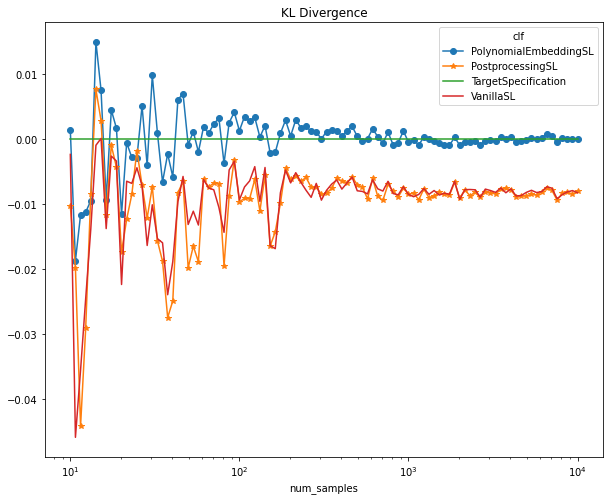

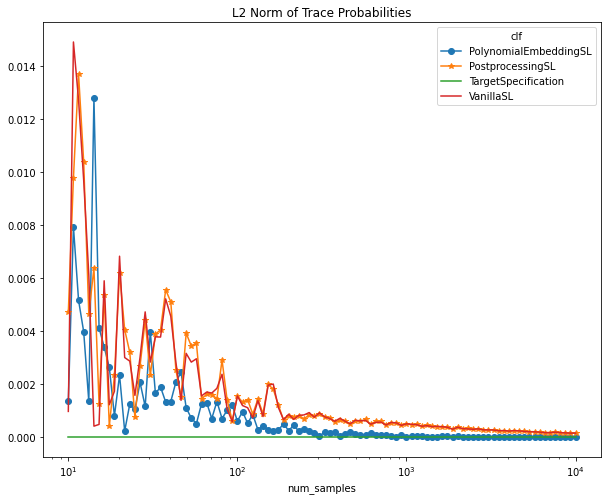

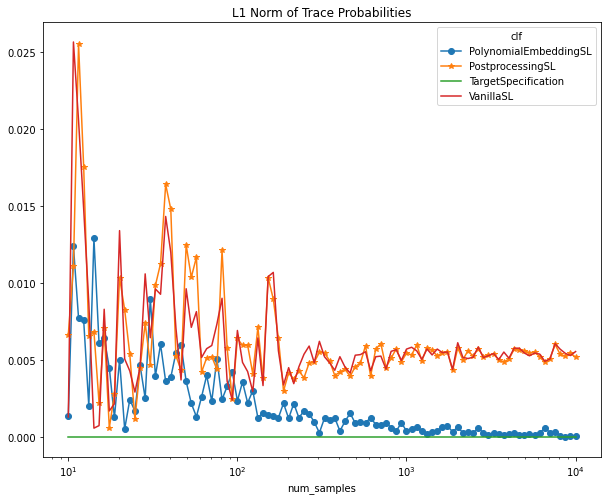

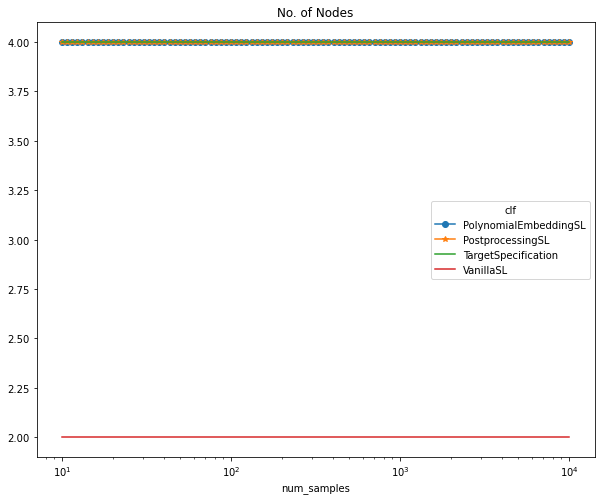

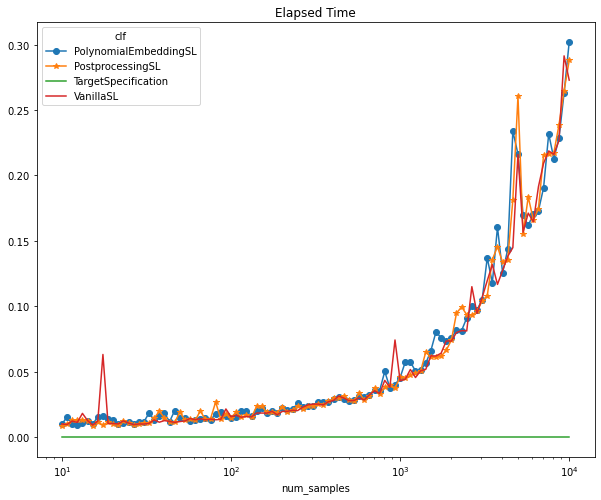

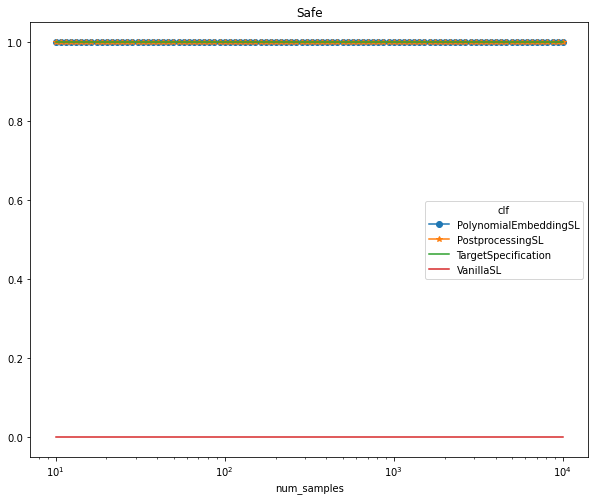

In [94]:
evaluation.plot(x='num_samples', 
                selected_params={'p': '5', 'N': 20}, 
                figsize=(10, 8), 
                logx=True,
#                 logy=True,
                style={'PolynomialEmbeddingSL': '-o', 'PostprocessingSL': '-*'})
#                 style={'GreedyEmbeddingSL': '-x', 'PolynomialEmbeddingSL': '-o', 'PostprocessingSL': '-*'})

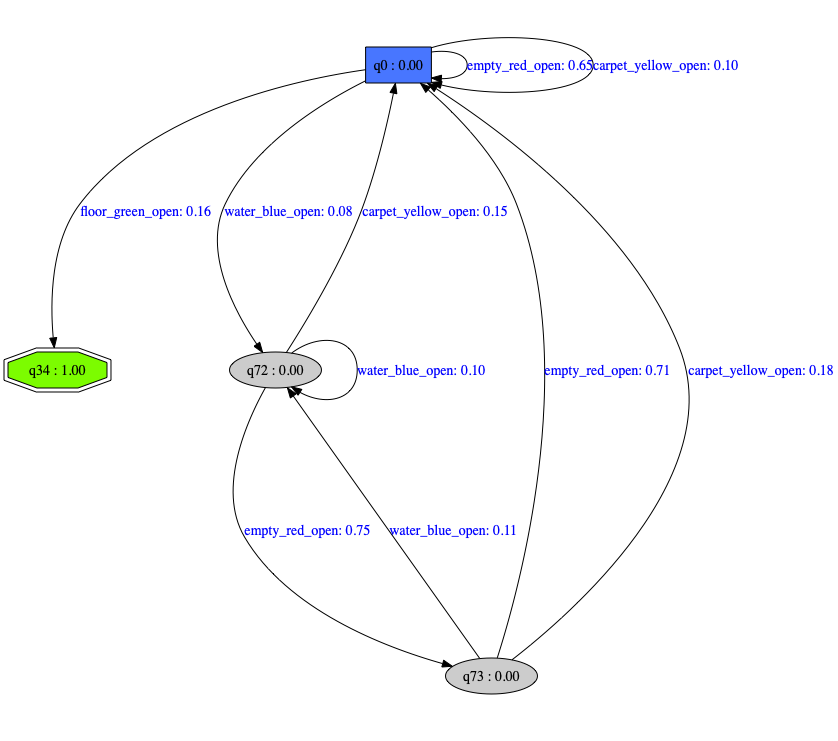

In [95]:
selected_params = {'p': '5',
                   'N': 20,
                   'clf': 'PolynomialEmbeddingSL',
                   'num_samples': num_samples[50]}
filename = '_'.join([EXPERIMENT_NAME, env_id, 'learnedPDFA'])

evaluation.draw(selected_params, filename=filename)

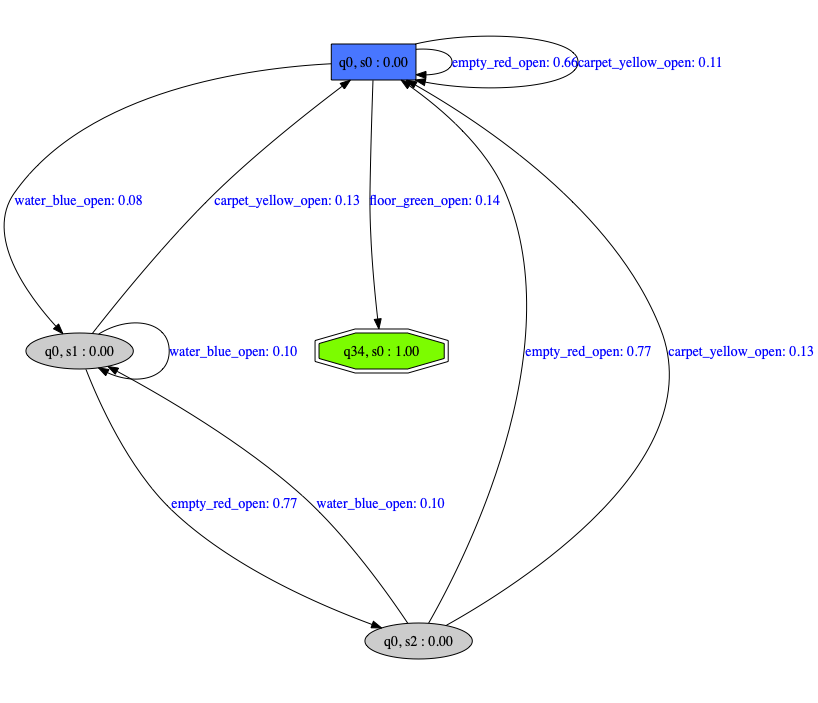

In [96]:
selected_params = {'p': '5',
                   'N': 20,
                   'clf': 'PostprocessingSL',
                   'num_samples': num_samples[50]}
filename = '_'.join([EXPERIMENT_NAME, env_id, 'learnedPDFA'])

evaluation.draw(selected_params, filename=filename)

In [ ]:
pdfa_specification.draw(filename)

# MANUALLY SPECIFIED PDFA

## Reason Why We Test
The reason why Postprocessing Algorithm performed better than preprocessing is because, the original PDFA specification was composed similarly to that of postprocessing algorithm, where I defined a PDFA and then composed a Product with a Safety DFA specification. Therefore, the resulting probability distributions were simiilar to that of postprocessing. 

However, in reality, we want to learn the actual preferences of a demonstrator where probability distributions are variant between transitions

## Hypothesis
In this experiment, we hypothesize that the Preprocessing Algorithm will perform better if the PDFA specification is manually given. We want to learn the nature of the demonstrator's preferences.

## Result
to be presented

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/systems/minigrid.py:717: RuntimeWarning: could not find any goal objects.
  warnings.warn(msg, RuntimeWarning)


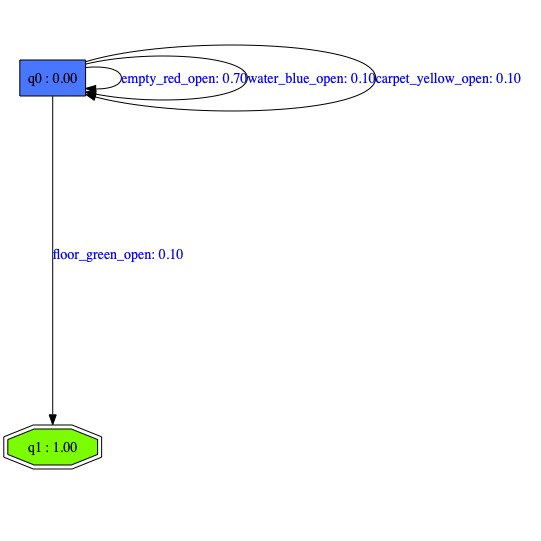

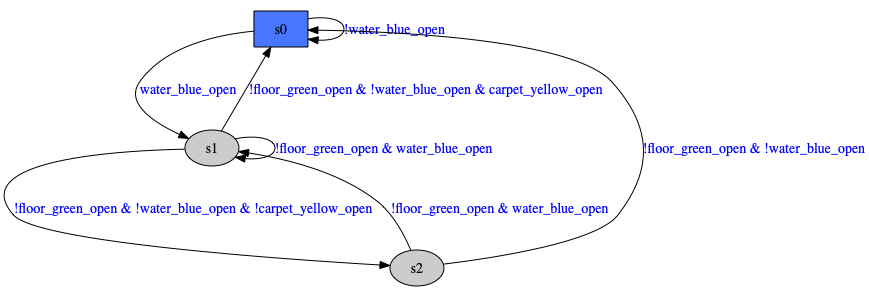

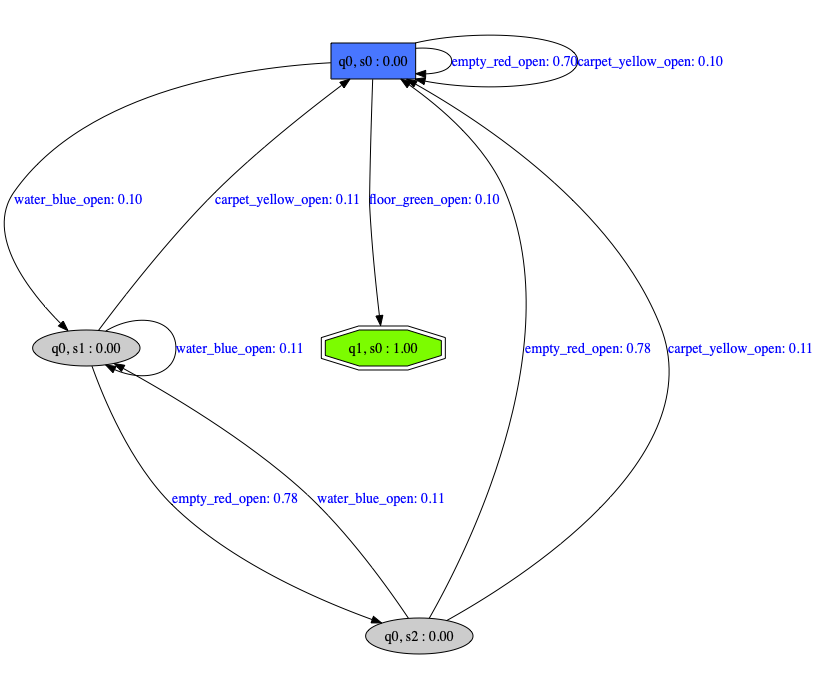

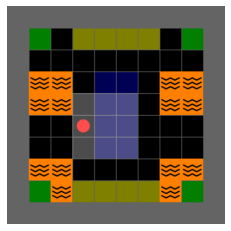

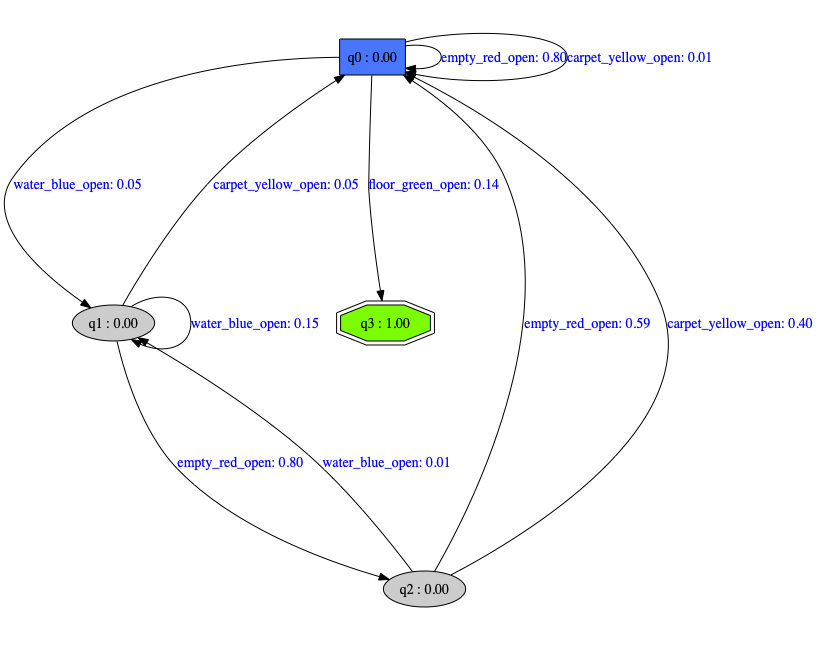

'/Users/kandai/Documents/projects/research/wombats_experiments'

In [7]:
# env

experiment_name = 'merge_safety_to_seshia_paper'
env_id = ENV_ID_1

pdfa_specification, safe_specification, _ = load_automata_from_experiment(experiment_name, env_id, draw=True)


p = Path(get_experiment_paths('merge_safety_to_seshia_paper')['PDFA_MODEL_CONFIG_FILE'])
new_pdfa_model_config_file = os.path.join(p.parent, p.stem + '_manual' + p.suffix)
manually_specified_pdfa = active_automata.get(automaton_type='PDFA',
                                              graph_data=new_pdfa_model_config_file)
manually_specified_pdfa.draw('_'.join([EXPERIMENT_NAME, env_id, 'newPDFA']))
os.getcwd()

In [30]:
dataloader = PDFADataLoader(manually_specified_pdfa, LEARNER_DATA_DIR)
num_samples = np.logspace(1, 4, num=100)
param_dict = {'num_samples': num_samples,
              'N': [20]}
dataloader.generate_datasets(param_dict)

In [53]:
# load data  & fit estimators


param_dict = {'num_samples':  num_samples}
datasets = dataloader.select_datasets(param_dict)

# Create a pipeline
steps = [('clf', DummyEstimator())]
pipeline = Pipeline(steps=steps)

# Candidate learning algorithms and their hyperparameters
# param_dict = [{'clf': [VanillaSL(), PostprocessingSL(), GreedyEmbeddingSL(), PolynomialEmbeddingSL(), TargetSpecification()],
param_dict = [{'clf': [VanillaSL(), PostprocessingSL(), PolynomialEmbeddingSL(), TargetSpecification()],
# param_dict = [{'clf': [PolynomialEmbeddingSL(), TargetSpecification()],
               'clf__specification': [manually_specified_pdfa],
               'clf__safe_specification': [safe_specification],
               'clf__p': ['0.6', '5']}]

estimator = BatchEstimator(pipeline, param_dict)
estimator.fit(datasets)

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 2 , red: 1
m100000 blue: 1 , red: 1
m99947 blue: 1 , red: 1
No Merge was successful
x8 blue: 0 , red: 2


found intermediate solution with

loaded fdfa
{'N': 20, 'num_samples': 10.0, 'actual_num_samples': 10.0}
{'p': '5', 'clf': 'PolynomialEmbeddingSL'}
[]
0
{'N': 20, 'num_samples': 10.0, 'actual_num_samples': 10.0}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 10.0, 'actual_num_samples': 10.0}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
over

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (floor_green_open) is not found in the curr_state's (q2) transition distribution
  warnings.warn(str(e))


welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 2 , red: 1
m100000 blue: 1 , red: 1
No Merge was successful
x16 blue: 2 , red: 2
No Merge was successful
x12 blue: 3 , red: 3
No Merge was

{'N': 20, 'num_samples': 11.497569953977356, 'actual_num_samples': 11.497569953977356}
{'p': '0.6', 'clf': 'VanillaSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 2 , red: 1
m999

{'N': 20, 'num_samples': 11.497569953977356, 'actual_num_samples': 11.497569953977356}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 2 , r

loaded fdfa
{'N': 20, 'num_samples': 12.32846739442066, 'actual_num_samples': 12.32846739442066}
{'p': '5', 'clf': 'PolynomialEmbeddingSL'}
[]
0
{'N': 20, 'num_samples': 12.32846739442066, 'actual_num_samples': 12.32846739442066}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 12.32846739442066, 'actual_num_samples': 12.32846739442066}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (floor_green_open) is not found in the curr_state's (q1) transition distribution
  warnings.warn(str(e))


{'N': 20, 'num_samples': 13.219411484660288, 'actual_num_samples': 13.219411484660288}
{'p': '5', 'clf': 'VanillaSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 2 , red: 1
m100

{'N': 20, 'num_samples': 14.174741629268055, 'actual_num_samples': 14.174741629268055}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 2 , red:

{'N': 20, 'num_samples': 15.199110829529339, 'actual_num_samples': 15.199110829529339}
{'p': '5', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
rea

loaded fdfa
{'N': 20, 'num_samples': 16.297508346206442, 'actual_num_samples': 16.297508346206442}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

loaded flexfringe
loaded fdfa
{'N': 20, 'num_samples': 17.47528400007684, 'actual_num_samples': 17.47528400007684}
{'p': '5', 'clf': 'PolynomialEmbeddingSL'}
[]
0
{'N': 20, 'num_samples': 17.47528400007684, 'actual_num_samples': 17.47528400007684}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 17.47528400007684, 'actual_num_samples': 17.47528400007684}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed

loaded fdfa
{'N': 20, 'num_samples': 18.73817422860384, 'actual_num_samples': 18.73817422860384}
{'p': '5', 'clf': 'PolynomialEmbeddingSL'}
[]
0
{'N': 20, 'num_samples': 18.73817422860384, 'actual_num_samples': 18.73817422860384}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 18.73817422860384, 'actual_num_samples': 18.73817422860384}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1

loaded fdfa
{'N': 20, 'num_samples': 20.09233002565047, 'actual_num_samples': 20.09233002565047}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mo

{'N': 20, 'num_samples': 21.544346900318846, 'actual_num_samples': 21.544346900318846}
{'p': '5', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
rea

loaded fdfa
{'N': 20, 'num_samples': 23.101297000831604, 'actual_num_samples': 23.101297000831604}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

{'N': 20, 'num_samples': 24.770763559917114, 'actual_num_samples': 24.770763559917114}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selecte

{'N': 20, 'num_samples': 26.560877829466868, 'actual_num_samples': 26.560877829466868}
{'p': '5', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
rea

{'N': 20, 'num_samples': 28.48035868435802, 'actual_num_samples': 28.48035868435802}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 3 , red: 1

{'N': 20, 'num_samples': 30.538555088334157, 'actual_num_samples': 30.538555088334157}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open']]
1
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creatin

{'N': 20, 'num_samples': 32.74549162877728, 'actual_num_samples': 32.74549162877728}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open']]
1
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluat

{'N': 20, 'num_samples': 35.11191734215131, 'actual_num_samples': 35.11191734215131}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open']]
1
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_d

{'N': 20, 'num_samples': 35.11191734215131, 'actual_num_samples': 35.11191734215131}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 35.11191734215131, 'actual_num_samples': 35.11191734215131}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldist

{'N': 20, 'num_samples': 37.64935806792467, 'actual_num_samples': 37.64935806792467}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected


{'N': 20, 'num_samples': 40.37017258596554, 'actual_num_samples': 40.37017258596554}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 3 , red: 1

{'N': 20, 'num_samples': 43.28761281083057, 'actual_num_samples': 43.28761281083057}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open']]
1
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_m

{'N': 20, 'num_samples': 46.4158883361278, 'actual_num_samples': 46.4158883361278}
{'p': '0.6', 'clf': 'VanillaSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 3 , red: 1
m99996 b

{'N': 20, 'num_samples': 46.4158883361278, 'actual_num_samples': 46.4158883361278}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 46.4158883361278, 'actual_num_samples': 46.4158883361278}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance

loaded fdfa
{'N': 20, 'num_samples': 49.770235643321115, 'actual_num_samples': 49.770235643321115}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

{'N': 20, 'num_samples': 53.3669923120631, 'actual_num_samples': 53.3669923120631}
{'p': '5', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading

{'N': 20, 'num_samples': 57.22367659350217, 'actual_num_samples': 57.22367659350217}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 3 , red: 1

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99999 blue: 3 , red: 1
m99989 blue: 2 , red: 1
m99933 blue: 1 , red: 1
No Merge was successful
x49 blue: 0 , red: 2


found inte

{'N': 20, 'num_samples': 65.79332246575683, 'actual_num_samples': 65.79332246575683}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open']]
1
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 

{'N': 20, 'num_samples': 65.79332246575683, 'actual_num_samples': 65.79332246575683}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 65.79332246575683, 'actual_num_samples': 65.79332246575683}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldist

{'N': 20, 'num_samples': 70.54802310718645, 'actual_num_samples': 70.54802310718645}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected


{'N': 20, 'num_samples': 75.64633275546291, 'actual_num_samples': 75.64633275546291}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1

{'N': 20, 'num_samples': 81.11308307896873, 'actual_num_samples': 81.11308307896873}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open']]
1
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data


welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99997 blue: 3 , red: 1
m99991 blue: 2 , red: 1
No Merge was successful
x116 blue: 5 , red: 2
m99997 blue: 4 , red: 2
m99994 bl

{'N': 20, 'num_samples': 86.97490026177834, 'actual_num_samples': 86.97490026177834}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected


{'N': 20, 'num_samples': 93.26033468832199, 'actual_num_samples': 93.26033468832199}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 3 , red: 1

{'N': 20, 'num_samples': 100.0, 'actual_num_samples': 100.0}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open']]
3
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristi

{'N': 20, 'num_samples': 100.0, 'actual_num_samples': 100.0}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m100000 blue: 3 , re

{'N': 20, 'num_samples': 107.22672220103232, 'actual_num_samples': 107.22672220103232}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selecte

{'N': 20, 'num_samples': 114.97569953977356, 'actual_num_samples': 114.97569953977356}
{'p': '5', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
rea

{'N': 20, 'num_samples': 123.28467394420659, 'actual_num_samples': 123.28467394420659}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red:

{'N': 20, 'num_samples': 132.19411484660287, 'actual_num_samples': 132.19411484660287}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open']]
2
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuri

loaded fdfa
{'N': 20, 'num_samples': 132.19411484660287, 'actual_num_samples': 132.19411484660287}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

{'N': 20, 'num_samples': 141.74741629268047, 'actual_num_samples': 141.74741629268047}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red:

{'N': 20, 'num_samples': 151.99110829529332, 'actual_num_samples': 151.99110829529332}
{'p': '0.6', 'clf': 'VanillaSL'}
[['water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open']]
4
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performan

loaded fdfa
{'N': 20, 'num_samples': 151.99110829529332, 'actual_num_samples': 151.99110829529332}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

{'N': 20, 'num_samples': 162.97508346206433, 'actual_num_samples': 162.97508346206433}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red:

{'N': 20, 'num_samples': 174.7528400007683, 'actual_num_samples': 174.7528400007683}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open']]
2
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Crea

loaded fdfa
{'N': 20, 'num_samples': 174.7528400007683, 'actual_num_samples': 174.7528400007683}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mo

{'N': 20, 'num_samples': 187.3817422860383, 'actual_num_samples': 187.3817422860383}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1

{'N': 20, 'num_samples': 200.92330025650458, 'actual_num_samples': 200.92330025650458}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open']]
1
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven

loaded fdfa
{'N': 20, 'num_samples': 200.92330025650458, 'actual_num_samples': 200.92330025650458}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99997 blue: 3 , red: 1
m99995 blue: 2 , red: 1
No Merge was successful
x282 blue: 5 , red: 2
m99995 blue: 4 , red: 2
m99994 bl

{'N': 20, 'num_samples': 215.44346900318845, 'actual_num_samples': 215.44346900318845}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 215.44346900318845, 'actual_num_samples': 215.44346900318845}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kl

{'N': 20, 'num_samples': 231.01297000831605, 'actual_num_samples': 231.01297000831605}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red:

{'N': 20, 'num_samples': 247.70763559917114, 'actual_num_samples': 247.70763559917114}
{'p': '0.6', 'clf': 'VanillaSL'}
[['water_blue_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'water_blue_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open']]
4
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflic

{'N': 20, 'num_samples': 247.70763559917114, 'actual_num_samples': 247.70763559917114}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selecte

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99995 blue: 3 , red: 1
m99994 blue: 2 , red: 1
No Merge was successful
x350 blue: 5 , red: 2
m99995 blue: 4 , red: 2
m99996 bl

{'N': 20, 'num_samples': 265.6087782946687, 'actual_num_samples': 265.6087782946687}
{'p': '5', 'clf': 'PolynomialEmbeddingSL'}
[]
0
{'N': 20, 'num_samples': 265.6087782946687, 'actual_num_samples': 265.6087782946687}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 265.6087782946687, 'actual_num_samples': 265.6087782946687}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overla

{'N': 20, 'num_samples': 284.8035868435802, 'actual_num_samples': 284.8035868435802}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1

{'N': 20, 'num_samples': 305.3855508833416, 'actual_num_samples': 305.3855508833416}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open']]
4
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performa

{'N': 20, 'num_samples': 305.3855508833416, 'actual_num_samples': 305.3855508833416}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected


welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99997 blue: 3 , red: 1
m99994 blue: 2 , red: 1
No Merge was successful
x438 blue: 5 , red: 2
m99997 blue: 4 , red: 2
m99993 bl

{'N': 20, 'num_samples': 327.45491628777285, 'actual_num_samples': 327.45491628777285}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , r

{'N': 20, 'num_samples': 351.1191734215131, 'actual_num_samples': 351.1191734215131}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1

{'N': 20, 'num_samples': 376.49358067924675, 'actual_num_samples': 376.49358067924675}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open']]
6
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --outpu

loaded fdfa
{'N': 20, 'num_samples': 376.49358067924675, 'actual_num_samples': 376.49358067924675}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

{'N': 20, 'num_samples': 403.70172585965577, 'actual_num_samples': 403.70172585965577}
{'p': '5', 'clf': 'VanillaSL'}
[['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open']]
6
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 

{'N': 20, 'num_samples': 403.70172585965577, 'actual_num_samples': 403.70172585965577}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selecte

{'N': 20, 'num_samples': 432.87612810830615, 'actual_num_samples': 432.87612810830615}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_ope

{'N': 20, 'num_samples': 432.87612810830615, 'actual_num_samples': 432.87612810830615}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selecte

{'N': 20, 'num_samples': 464.1588833612782, 'actual_num_samples': 464.1588833612782}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_op

{'N': 20, 'num_samples': 464.1588833612782, 'actual_num_samples': 464.1588833612782}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected


{'N': 20, 'num_samples': 497.7023564332114, 'actual_num_samples': 497.7023564332114}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', '

{'N': 20, 'num_samples': 497.7023564332114, 'actual_num_samples': 497.7023564332114}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected


{'N': 20, 'num_samples': 533.6699231206312, 'actual_num_samples': 533.6699231206312}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'

{'N': 20, 'num_samples': 533.6699231206312, 'actual_num_samples': 533.6699231206312}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected


{'N': 20, 'num_samples': 572.236765935022, 'actual_num_samples': 572.236765935022}
{'p': '5', 'clf': 'VanillaSL'}
[['water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'empty_red_open', 'floor_g

{'N': 20, 'num_samples': 572.236765935022, 'actual_num_samples': 572.236765935022}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
re

{'N': 20, 'num_samples': 613.5907273413176, 'actual_num_samples': 613.5907273413176}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open

{'N': 20, 'num_samples': 613.5907273413176, 'actual_num_samples': 613.5907273413176}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected


{'N': 20, 'num_samples': 657.9332246575682, 'actual_num_samples': 657.9332246575682}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open',

{'N': 20, 'num_samples': 657.9332246575682, 'actual_num_samples': 657.9332246575682}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected


{'N': 20, 'num_samples': 705.4802310718645, 'actual_num_samples': 705.4802310718645}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open'

{'N': 20, 'num_samples': 705.4802310718645, 'actual_num_samples': 705.4802310718645}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected


{'N': 20, 'num_samples': 756.463327554629, 'actual_num_samples': 756.463327554629}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_re

{'N': 20, 'num_samples': 756.463327554629, 'actual_num_samples': 756.463327554629}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
re

{'N': 20, 'num_samples': 811.1308307896873, 'actual_num_samples': 811.1308307896873}
{'p': '5', 'clf': 'VanillaSL'}
[['carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_

{'N': 20, 'num_samples': 811.1308307896873, 'actual_num_samples': 811.1308307896873}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected


{'N': 20, 'num_samples': 869.7490026177834, 'actual_num_samples': 869.7490026177834}
{'p': '5', 'clf': 'VanillaSL'}
[['carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_op

loaded fdfa
{'N': 20, 'num_samples': 869.7490026177834, 'actual_num_samples': 869.7490026177834}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mo

{'N': 20, 'num_samples': 932.60334688322, 'actual_num_samples': 932.60334688322}
{'p': '5', 'clf': 'VanillaSL'}
[['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], [

{'N': 20, 'num_samples': 932.60334688322, 'actual_num_samples': 932.60334688322}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
read

{'N': 20, 'num_samples': 1000.0, 'actual_num_samples': 1000.0}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_ope

{'N': 20, 'num_samples': 1000.0, 'actual_num_samples': 1000.0}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished,

{'N': 20, 'num_samples': 1072.2672220103232, 'actual_num_samples': 1072.2672220103232}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open'

loaded fdfa
{'N': 20, 'num_samples': 1072.2672220103232, 'actual_num_samples': 1072.2672220103232}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

{'N': 20, 'num_samples': 1149.7569953977356, 'actual_num_samples': 1149.7569953977356}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['e

{'N': 20, 'num_samples': 1149.7569953977356, 'actual_num_samples': 1149.7569953977356}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selecte

{'N': 20, 'num_samples': 1232.8467394420659, 'actual_num_samples': 1232.8467394420659}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'e

loaded fdfa
{'N': 20, 'num_samples': 1232.8467394420659, 'actual_num_samples': 1232.8467394420659}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

{'N': 20, 'num_samples': 1321.9411484660286, 'actual_num_samples': 1321.9411484660286}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'f

{'N': 20, 'num_samples': 1321.9411484660286, 'actual_num_samples': 1321.9411484660286}
{'p': '5', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
rea

{'N': 20, 'num_samples': 1417.4741629268049, 'actual_num_samples': 1417.4741629268049}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_op

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99996 blue: 3 , red: 1
m99994 blue: 2 , red: 1
No Merge was successful
x1892 blue: 5 , red: 2
m99998 blue: 4 , red: 2
m99992 b

{'N': 20, 'num_samples': 1417.4741629268049, 'actual_num_samples': 1417.4741629268049}
{'p': '5', 'clf': 'PolynomialEmbeddingSL'}
[]
0
{'N': 20, 'num_samples': 1417.4741629268049, 'actual_num_samples': 1417.4741629268049}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 1417.4741629268049, 'actual_num_samples': 1417.4741629268049}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_

{'N': 20, 'num_samples': 1519.9110829529332, 'actual_num_samples': 1519.9110829529332}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open

{'N': 20, 'num_samples': 1519.9110829529332, 'actual_num_samples': 1519.9110829529332}
{'p': '5', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
rea

{'N': 20, 'num_samples': 1629.750834620645, 'actual_num_samples': 1629.750834620645}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99995 blue: 3 , red: 1
m99991 blue: 2 , red: 1
No Merge was successful
x2220 blue: 5 , red: 2
m99998 blue: 4 , red: 2
m99991 b

{'N': 20, 'num_samples': 1629.750834620645, 'actual_num_samples': 1629.750834620645}
{'p': '5', 'clf': 'PolynomialEmbeddingSL'}
[]
0
{'N': 20, 'num_samples': 1629.750834620645, 'actual_num_samples': 1629.750834620645}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 1629.750834620645, 'actual_num_samples': 1629.750834620645}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overla

{'N': 20, 'num_samples': 1747.5284000076847, 'actual_num_samples': 1747.5284000076847}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_op

{'N': 20, 'num_samples': 1747.5284000076847, 'actual_num_samples': 1747.5284000076847}
{'p': '5', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
rea

{'N': 20, 'num_samples': 1873.817422860385, 'actual_num_samples': 1873.817422860385}
{'p': '0.6', 'clf': 'VanillaSL'}
[['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_op

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99996 blue: 3 , red: 1
m99992 blue: 2 , red: 1
No Merge was successful
x2512 blue: 5 , red: 2
m99998 blue: 4 , red: 2
m99990 b

{'N': 20, 'num_samples': 1873.817422860385, 'actual_num_samples': 1873.817422860385}
{'p': '5', 'clf': 'PolynomialEmbeddingSL'}
[]
0
{'N': 20, 'num_samples': 1873.817422860385, 'actual_num_samples': 1873.817422860385}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 1873.817422860385, 'actual_num_samples': 1873.817422860385}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overla

{'N': 20, 'num_samples': 2009.2330025650479, 'actual_num_samples': 2009.2330025650479}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water

{'N': 20, 'num_samples': 2009.2330025650479, 'actual_num_samples': 2009.2330025650479}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red:

{'N': 20, 'num_samples': 2154.4346900318847, 'actual_num_samples': 2154.4346900318847}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'wat

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99997 blue: 3 , red: 1
m99992 blue: 2 , red: 1
No Merge was successful
x2908 blue: 5 , red: 2
m99998 blue: 4 , red: 2
m99990 b

{'N': 20, 'num_samples': 2154.4346900318847, 'actual_num_samples': 2154.4346900318847}
{'p': '5', 'clf': 'PolynomialEmbeddingSL'}
[]
0
{'N': 20, 'num_samples': 2154.4346900318847, 'actual_num_samples': 2154.4346900318847}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 2154.4346900318847, 'actual_num_samples': 2154.4346900318847}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_

{'N': 20, 'num_samples': 2310.1297000831605, 'actual_num_samples': 2310.1297000831605}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_re

{'N': 20, 'num_samples': 2310.1297000831605, 'actual_num_samples': 2310.1297000831605}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red:

{'N': 20, 'num_samples': 2477.0763559917114, 'actual_num_samples': 2477.0763559917114}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99996 blue: 3 , red: 1
m99994 blue: 2 , red: 1
No Merge was successful
x3344 blue: 5 , red: 2
m99998 blue: 4 , red: 2
m99987 b

loaded fdfa
{'N': 20, 'num_samples': 2477.0763559917114, 'actual_num_samples': 2477.0763559917114}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    5.4s
[Parallel(n_jobs=4)]: Done  29 tasks      | elapsed:    5.4s
[Parallel(n_jobs=4)]: Done  30 tasks      | elapsed:    5.4s
[Parallel(n_jobs=4)]: Done  31 tasks      | elapsed:    5.4s
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    5.5s
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    5.5s
[Parallel(n_jobs=4)]: Done  34 tasks      | elapsed:    5.5s
[Parallel(n_jobs=4)]: Done  35 tasks      | elapsed:    5.6s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    5.6s
[Parallel(n_jobs=4)]: Done  38 tasks      | elapsed:    5.6s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1848s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    5.6s
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    5.6s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    5.6s
[Parallel(n_jobs=4)]: Done  46 tasks      | elapsed:    5.6s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    5.6s
[Pa

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998 blue: 3 , red: 1
m99992 blue: 2 , red: 1
m99911 blue: 1 , red: 1
No Merge was successful
x2125 blue: 0 , red: 2


found in

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998 blue: 3 , red: 1
m99992 blue: 2 , red: 1
No Merge was successful
x3614 blue: 5 , red: 2
m99999 blue: 4 , red: 2
m99988 b

[Parallel(n_jobs=4)]: Done 142 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 146 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 148 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 150 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 158 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 160 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 162 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 164 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 166 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 170 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 172 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 420 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 422 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 426 tasks      | elapsed:    7.6s
[Parallel(n_jobs=4)]: Done 428 tasks      | elapsed:    7.6s
[Parallel(n_jobs=4)]: Done 430 tasks      | elapsed:    7.6s
[Parallel(n_jobs=4)]: Done 432 tasks      | elapsed:    7.7s
[Parallel(n_jobs=4)]: Done 434 tasks      | elapsed:    7.7s
[Parallel(n_jobs=4)]: Done 436 tasks      | elapsed:    7.7s
[Parallel(n_jobs=4)]: Done 438 tasks      | elapsed:    7.8s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    7.8s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 444 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 446 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Done 448 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Done 450 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 532 out of 532 | elapsed:    1.3s finished
{'N': 20, 'num_samples': 2656.0877829466867, 'actual_num_samples': 2656.0877829466867}
{'p': '5', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistanc

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998 blue: 3 , red: 1
m99964 blue: 2 , red: 1
No Merge was success

[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0915s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1755s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 168 tasks     

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998 blue: 3 , red: 1
m99992 blue: 2 , red: 1
No Merge was successful
x3850 blue: 5 , red: 2
m99999 blue: 4 , red: 2
m99990 b

[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0293s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Batch computation too fast (0.0293s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0454s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  11 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: 

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998 blue: 3 , red: 1
m99992 blue: 2 , red: 1
No Merge was successful
x3850 blue: 5 , red: 2
m99999 blue: 4 , red: 2
m99990 b

[Parallel(n_jobs=4)]: Done 138 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 140 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 142 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 146 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 148 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 150 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 158 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 160 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 162 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 164 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 166 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    7.4s
[Parallel(n_jobs=4)]: Done 410 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 412 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 414 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 416 tasks      | elapsed:    7.6s
[Parallel(n_jobs=4)]: Done 418 tasks      | elapsed:    7.6s
[Parallel(n_jobs=4)]: Done 420 tasks      | elapsed:    7.6s
[Parallel(n_jobs=4)]: Done 422 tasks      | elapsed:    7.7s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    7.7s
[Parallel(n_jobs=4)]: Done 426 tasks      | elapsed:    7.7s
[Parallel(n_jobs=4)]: Done 428 tasks      | elapsed:    7.8s
[Parallel(n_jobs=4)]: Done 430 tasks      | elapsed:    7.8s
[Parallel(n_jobs=4)]: Done 432 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 434 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 436 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 438 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1361s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 409 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 441 tasks      | elapsed:    1.0s
[P

[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0901s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1080s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  96 tasks      

[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0884s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.4s
[P

[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 409 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 410 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 411 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 412 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 413 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 488 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 570 out of 570 | elapsed:    1.3s finished
{'N': 20, 'num_samples': 2848.035868435802, 'actual_num_samples': 2848.035868435802}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs

[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 537 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 553 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 569 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 570 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 571 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 572 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 573 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 574 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 575 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 576 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 577 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 578 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 579 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 580 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 581 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0259s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0434s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  20 tasks      |

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99996 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x4130 blue: 5 , red: 2
m99999 blue: 4 , red: 2
m99988 b

[Parallel(n_jobs=4)]: Done 140 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 142 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 146 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 148 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 150 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 158 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 160 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 162 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 164 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 166 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 170 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 414 tasks      | elapsed:    7.4s
[Parallel(n_jobs=4)]: Done 416 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 418 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 420 tasks      | elapsed:    7.6s
[Parallel(n_jobs=4)]: Done 422 tasks      | elapsed:    7.6s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    7.6s
[Parallel(n_jobs=4)]: Done 426 tasks      | elapsed:    7.6s
[Parallel(n_jobs=4)]: Done 428 tasks      | elapsed:    7.7s
[Parallel(n_jobs=4)]: Done 430 tasks      | elapsed:    7.7s
[Parallel(n_jobs=4)]: Done 432 tasks      | elapsed:    7.8s
[Parallel(n_jobs=4)]: Done 434 tasks      | elapsed:    7.8s
[Parallel(n_jobs=4)]: Done 436 tasks      | elapsed:    7.8s
[Parallel(n_jobs=4)]: Done 438 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Done 444 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0967s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1417s.) Sett

[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0889s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1365s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  80 tasks      

[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0375s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1243s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 104 tasks      

[Parallel(n_jobs=4)]: Done 296 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 328 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 360 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 392 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 456 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 488 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 520 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 552 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 554 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 556 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 558 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 560 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 562 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 564 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 566 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 570 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 572 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 574 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 576 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 578 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 580 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 582 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 264 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 296 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 328 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 360 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 392 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Do

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99997 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99908 blue: 1 , red: 1
No Merge was successful
x2620 blue: 0 , red: 2


found in

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99997 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x4476 blue: 5 , red: 2
m99999 blue: 4 , red: 2
m99988 b

[Parallel(n_jobs=4)]: Done 140 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 142 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 146 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 148 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 150 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 158 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 160 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 162 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 164 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 166 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 170 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    7.7s
[Parallel(n_jobs=4)]: Done 640 tasks      | elapsed:    7.7s
[Parallel(n_jobs=4)]: Done 641 tasks      | elapsed:    7.7s
[Parallel(n_jobs=4)]: Done 642 tasks      | elapsed:    7.8s
[Parallel(n_jobs=4)]: Done 643 tasks      | elapsed:    7.8s
[Parallel(n_jobs=4)]: Done 644 tasks      | elapsed:    7.8s
[Parallel(n_jobs=4)]: Done 645 tasks      | elapsed:    7.8s
[Parallel(n_jobs=4)]: Done 646 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 647 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 648 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 655 out of 655 | elapsed:    8.1s finished
{'N': 20, 'num_samples': 3274.5491628777286, 'actual_num_samples': 3274.5491628777286}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --out

loaded fdfa
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0581s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0702s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=

[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0611s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0991s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 200 tasks     

[Parallel(n_jobs=4)]: Done 594 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 597 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 603 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 606 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 609 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 612 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 615 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 618 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 621 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 624 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 627 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 630 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 633 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 636 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 648 out of 655 | elapsed:    1.0s remaining:    0.0s
[Para

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0368s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1680s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  1

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0165s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0311s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  1

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998 blue: 3 , red: 1
m99992 blue: 2 , red: 1
No Merge was successful
x4810 blue: 5 , red: 2
m99999 blue: 4 , red: 2
m99988 b

[Parallel(n_jobs=4)]: Done 703 out of 703 | elapsed:    2.5s finished
{'N': 20, 'num_samples': 3511.191734215131, 'actual_num_samples': 3511.191734215131}
{'p': '0.6', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selec

loaded fdfa
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0167s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0813s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.1s
[Parallel(n_jobs=

loaded fdfa
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0223s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0958s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=

[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0487s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.1s
[Pa

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0905s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    0.7s
[P

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0352s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1217s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  1

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99996 blue: 3 , red: 1
m99992 blue: 2 , red: 1
m99910 blue: 1 , red: 1
No Merge was successful
x3012 blue: 0 , red: 2


found in

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99996 blue: 3 , red: 1
m99992 blue: 2 , red: 1
No Merge was successful
x5166 blue: 5 , red: 2
m99999 blue: 4 , red: 2
m99991 b

[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 616 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 648 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 680 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 681 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 697 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 698 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 714 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 715 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 716 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 717 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 718 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 719 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 720 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 677 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 680 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 683 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 686 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 689 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 692 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 695 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 698 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 701 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 704 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 707 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 710 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 713 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 716 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 719 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 722 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 689 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 692 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 695 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 698 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 701 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 704 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 707 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 710 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 713 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 716 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 719 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 722 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 725 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 731 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 734 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Do

{'N': 20, 'num_samples': 3764.9358067924672, 'actual_num_samples': 3764.9358067924672}
{'p': '5', 'clf': 'PolynomialEmbeddingSL'}
[]
0
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0308s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0315s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.1s
[Parallel(n_jobs

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1225s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    0.7s
[P

[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1137s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1080s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  48 tasks      |

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99997 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99907 blue: 1 , red: 1
No Merge was successful
x3230 blue: 0 , red: 2


found in

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99997 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x5508 blue: 5 , red: 2
m99999 blue: 4 , red: 2
m99990 b

[Parallel(n_jobs=4)]: Done 400 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 416 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 432 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 448 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 456 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 464 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 480 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 488 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 496 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 512 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 520 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 697 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 698 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 699 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 665 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 697 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 698 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 699 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 783 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 784 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 785 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 786 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 787 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 788 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 789 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 790 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 791 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 793 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 794 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 795 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 796 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 797 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 798 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Do

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99997 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x5912 blue: 5 , red: 2
m99999 blue: 4 , red: 2
m99987 b

[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 794 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 796 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 798 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 800 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 802 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 804 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 806 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 808 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 810 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 812 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 814 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 816 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 818 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 820 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 822 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Do

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99997 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99904 blue: 1 , red: 1
No Merge was successful
x3463 blue: 0 , red: 2


found in

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99997 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x5912 blue: 5 , red: 2
m99999 blue: 4 , red: 2
m99987 b

[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 448 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 456 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 464 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 480 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 488 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 496 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 512 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 520 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 528 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 544 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 552 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 560 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 666 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 668 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 670 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 672 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 674 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 706 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 708 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 710 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1559s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    1.0s
[P

[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 744 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 746 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 748 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 750 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 752 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 754 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 756 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 758 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 760 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 794 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 796 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 798 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 800 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 802 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 804 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 828 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 830 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 832 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 834 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 836 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 838 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 840 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 842 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 844 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 846 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 848 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 850 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 852 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 866 out of 866 | elapsed:    1.8s finished
{'N': 20, 'num_samples': 4328.761281083057, 'actual_num_samples': 4328.761281083057}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcom

[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 760 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 824 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 825 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 857 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Do

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99997 blue: 3 , red: 1
m99992 blue: 2 , red: 1
m99904 blue: 1 , red: 1
No Merge was successful
x3713 blue: 0 , red: 2


found in

{'N': 20, 'num_samples': 4641.588833612782, 'actual_num_samples': 4641.588833612782}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0817s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done  20 tasks      | elapse

[Parallel(n_jobs=4)]: Done 258 tasks      | elapsed:    5.2s
[Parallel(n_jobs=4)]: Done 260 tasks      | elapsed:    5.2s
[Parallel(n_jobs=4)]: Done 262 tasks      | elapsed:    5.3s
[Parallel(n_jobs=4)]: Done 264 tasks      | elapsed:    5.3s
[Parallel(n_jobs=4)]: Done 266 tasks      | elapsed:    5.3s
[Parallel(n_jobs=4)]: Done 268 tasks      | elapsed:    5.3s
[Parallel(n_jobs=4)]: Done 270 tasks      | elapsed:    5.4s
[Parallel(n_jobs=4)]: Done 272 tasks      | elapsed:    5.4s
[Parallel(n_jobs=4)]: Done 274 tasks      | elapsed:    5.4s
[Parallel(n_jobs=4)]: Done 276 tasks      | elapsed:    5.4s
[Parallel(n_jobs=4)]: Done 278 tasks      | elapsed:    5.5s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    5.5s
[Parallel(n_jobs=4)]: Done 282 tasks      | elapsed:    5.6s
[Parallel(n_jobs=4)]: Done 284 tasks      | elapsed:    5.6s
[Parallel(n_jobs=4)]: Done 286 tasks      | elapsed:    5.6s
[Parallel(n_jobs=4)]: Done 288 tasks      | elapsed:    5.6s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 648 tasks      | elapsed:    9.4s
[Parallel(n_jobs=4)]: Done 652 tasks      | elapsed:    9.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1969s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done 656 tasks      | elapsed:    9.5s
[Parallel(n_jobs=4)]: Done 660 tasks      | elapsed:    9.5s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    9.5s
[Parallel(n_jobs=4)]: Done 668 tasks      | elapsed:    9.5s
[Parallel(n_jobs=4)]: Done 672 tasks      | elapsed:    9.6s
[Parallel(n_jobs=4)]: Done 676 tasks      | elapsed:    9.6s
[Parallel(n_jobs=4)]: Done 680 tasks      | elapsed:    9.6s
[Parallel(n_jobs=4)]: Done 684 tasks      | elapsed:    9.6s
[Parallel(n_jobs=4)]: Done 688 tasks      | elapsed:    9.7s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    9.7s
[Parallel(n_jobs=4)]: Done 704 tasks      | elapsed:    9.8s
[Parallel(n_jobs=4)]: Done 712 tasks      | elapsed:    9.8s
[Parallel(n_jobs=4)]: Done 720 tasks      | elapsed:    9.8s
[Pa

[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 760 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 793 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 825 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 826 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 827 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 828 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 829 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 830 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 831 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 832 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 833 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 760 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 824 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 825 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 826 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 760 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 793 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 794 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 795 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 796 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 797 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 798 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Do

{'N': 20, 'num_samples': 4641.588833612782, 'actual_num_samples': 4641.588833612782}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0263s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0367s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done   9 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0609s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1189s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  1

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998 blue: 3 , red: 1
m99994 blue: 2 , red: 1
m99909 blue: 1 , red: 1
No Merge was successful
x3982 blue: 0 , red: 2


found in

{'N': 20, 'num_samples': 4977.023564332114, 'actual_num_samples': 4977.023564332114}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998 blue: 3 , red: 1
m99994 blue: 2 , red: 1
No Merge was successful
x6746 blue: 5 , red: 2
m100000 blue: 4 , red: 2
m99988 

[Parallel(n_jobs=4)]: Done 352 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 360 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 368 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 384 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 392 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 400 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 416 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 432 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 448 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 456 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 464 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0637s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1223s.) Set

[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1030s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1400s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 216 tasks     

[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  60 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0547s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1510s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 184 tasks     

[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1909s.) Setting batch_size=64.
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 637 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 642 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 647 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 652 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 716 tasks      | elapsed:    1.9s
[P

[Parallel(n_jobs=4)]: Done 846 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 848 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 850 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 882 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 914 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 916 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 918 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 920 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 922 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 924 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 926 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 928 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 930 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 932 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 934 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 936 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 264 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Do

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99997 blue: 3 , red: 1
m99992 blue: 2 , red: 1
m99903 blue: 1 , red: 1
No Merge was successful
x4269 blue: 0 , red: 2


found in

[Parallel(n_jobs=4)]: Done 1039 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1040 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1041 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1042 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1043 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1044 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1045 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1046 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1047 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1048 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1049 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1050 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 1051 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 1052 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 1053 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 1054 tasks      | elapsed:    2.4s
[Paralle

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99997 blue: 3 , red: 1
m99992 blue: 2 , red: 1
No Merge was successful
x7258 blue: 5 , red: 2
m99999 blue: 4 , red: 2
m99988 b

[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 188 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 196 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 208 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 224 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 240 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 256 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 264 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 272 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 288 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  60 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0669s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1640s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks     

[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1200s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.2s
[Pa

[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0464s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.3s
[P

[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 760 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 824 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 856 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 888 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 920 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 921 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 922 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 923 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 924 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 925 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0954s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0592s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  48 tasks      |

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99905 blue: 1 , red: 1
No Merge was successful
x4578 blue: 0 , red: 2


found in

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x7806 blue: 5 , red: 2
m99999 blue: 4 , red: 2
m99989 b

[Parallel(n_jobs=4)]: Done 208 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 212 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 220 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 224 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 236 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 240 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 244 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 252 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 256 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 260 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 264 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 268 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 764 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Done 768 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Done 772 tasks      | elapsed:    8.1s
[Parallel(n_jobs=4)]: Done 776 tasks      | elapsed:    8.1s
[Parallel(n_jobs=4)]: Done 780 tasks      | elapsed:    8.1s
[Parallel(n_jobs=4)]: Done 784 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 788 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    8.3s
[Parallel(n_jobs=4)]: Done 796 tasks      | elapsed:    8.3s
[Parallel(n_jobs=4)]: Done 800 tasks      | elapsed:    8.3s
[Parallel(n_jobs=4)]: Done 804 tasks      | elapsed:    8.4s
[Parallel(n_jobs=4)]: Done 808 tasks      | elapsed:    8.5s
[Parallel(n_jobs=4)]: Done 812 tasks      | elapsed:    8.6s
[Parallel(n_jobs=4)]: Done 816 tasks      | elapsed:    8.6s
[Parallel(n_jobs=4)]: Done 820 tasks      | elapsed:    8.7s
[Parallel(n_jobs=4)]: Done 824 tasks      | elapsed:    8.8s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0480s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0571s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 104 tasks      

[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 264 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 296 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 328 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 360 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 392 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 456 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 488 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   9 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0290s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  11 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  13 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  15 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  19 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.1s
[Pa

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0584s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1818s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  1

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99997 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99902 blue: 1 , red: 1
No Merge was successful
x4908 blue: 0 , red: 2


found in

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99997 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x8348 blue: 5 , red: 2
m99999 blue: 4 , red: 2
m99989 b

[Parallel(n_jobs=4)]: Done 138 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 140 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 142 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 146 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 148 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 150 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 158 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 160 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 162 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 164 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 166 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 422 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 426 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Done 428 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Done 430 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Done 432 tasks      | elapsed:    8.1s
[Parallel(n_jobs=4)]: Done 434 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 436 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 438 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    8.3s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:    8.3s
[Parallel(n_jobs=4)]: Done 444 tasks      | elapsed:    8.3s
[Parallel(n_jobs=4)]: Done 446 tasks      | elapsed:    8.4s
[Parallel(n_jobs=4)]: Done 448 tasks      | elapsed:    8.4s
[Parallel(n_jobs=4)]: Done 450 tasks      | elapsed:    8.4s
[Parallel(n_jobs=4)]: Done 452 tasks      | elapsed:    8.5s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:   12.9s
[Parallel(n_jobs=4)]: Done 698 tasks      | elapsed:   12.9s
[Parallel(n_jobs=4)]: Done 700 tasks      | elapsed:   13.0s
[Parallel(n_jobs=4)]: Done 702 tasks      | elapsed:   13.0s
[Parallel(n_jobs=4)]: Done 704 tasks      | elapsed:   13.0s
[Parallel(n_jobs=4)]: Done 706 tasks      | elapsed:   13.1s
[Parallel(n_jobs=4)]: Done 708 tasks      | elapsed:   13.1s
[Parallel(n_jobs=4)]: Done 710 tasks      | elapsed:   13.1s
[Parallel(n_jobs=4)]: Done 712 tasks      | elapsed:   13.2s
[Parallel(n_jobs=4)]: Done 714 tasks      | elapsed:   13.2s
[Parallel(n_jobs=4)]: Done 716 tasks      | elapsed:   13.2s
[Parallel(n_jobs=4)]: Done 718 tasks      | elapsed:   13.3s
[Parallel(n_jobs=4)]: Done 720 tasks      | elapsed:   13.3s
[Parallel(n_jobs=4)]: Done 722 tasks      | elapsed:   13.3s
[Parallel(n_jobs=4)]: Done 724 tasks      | elapsed:   13.3s
[Parallel(n_jobs=4)]: Done 726 tasks      | elapsed:   13.4s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 972 tasks      | elapsed:   17.8s
[Parallel(n_jobs=4)]: Done 974 tasks      | elapsed:   17.8s
[Parallel(n_jobs=4)]: Done 976 tasks      | elapsed:   17.9s
[Parallel(n_jobs=4)]: Done 978 tasks      | elapsed:   17.9s
[Parallel(n_jobs=4)]: Done 980 tasks      | elapsed:   18.0s
[Parallel(n_jobs=4)]: Done 982 tasks      | elapsed:   18.0s
[Parallel(n_jobs=4)]: Done 984 tasks      | elapsed:   18.0s
[Parallel(n_jobs=4)]: Done 986 tasks      | elapsed:   18.0s
[Parallel(n_jobs=4)]: Done 988 tasks      | elapsed:   18.1s
[Parallel(n_jobs=4)]: Done 990 tasks      | elapsed:   18.1s
[Parallel(n_jobs=4)]: Done 992 tasks      | elapsed:   18.2s
[Parallel(n_jobs=4)]: Done 994 tasks      | elapsed:   18.2s
[Parallel(n_jobs=4)]: Done 996 tasks      | elapsed:   18.3s
[Parallel(n_jobs=4)]: Done 998 tasks      | elapsed:   18.3s
[Parallel(n_jobs=4)]: Done 1000 tasks      | elapsed:   18.3s
[Parallel(n_jobs=4)]: Done 1002 tasks      | elapsed:   18.4s
[Parallel(n_jobs=4)]: 

[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0575s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1013s.) Sett

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0563s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1332s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  1

[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0904s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0664s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  48 tasks      |

[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0743s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1385s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 216 tasks     

[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 328 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 360 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 392 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 456 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 488 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 520 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 552 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0913s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1437s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  1

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99997 blue: 3 , red: 1
m99992 blue: 2 , red: 1
m99902 blue: 1 , red: 1
No Merge was successful
x5264 blue: 0 , red: 2


found in

[Parallel(n_jobs=4)]: Done 1244 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 1246 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 1248 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 1250 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 1252 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1254 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1256 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1258 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1260 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1262 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1264 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1266 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1268 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1270 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1272 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1274 tasks      | elapsed:    2.6s
[Paralle

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99997 blue: 3 , red: 1
m99992 blue: 2 , red: 1
No Merge was successful
x8936 blue: 5 , red: 2
m100000 blue: 4 , red: 2
m99991 

[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 138 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 140 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 142 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 146 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 148 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 150 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 158 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 160 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 162 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 164 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Done 166 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 412 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Done 414 tasks      | elapsed:    8.1s
[Parallel(n_jobs=4)]: Done 416 tasks      | elapsed:    8.1s
[Parallel(n_jobs=4)]: Done 418 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 420 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 422 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    8.3s
[Parallel(n_jobs=4)]: Done 426 tasks      | elapsed:    8.3s
[Parallel(n_jobs=4)]: Done 428 tasks      | elapsed:    8.3s
[Parallel(n_jobs=4)]: Done 430 tasks      | elapsed:    8.4s
[Parallel(n_jobs=4)]: Done 432 tasks      | elapsed:    8.4s
[Parallel(n_jobs=4)]: Done 434 tasks      | elapsed:    8.5s
[Parallel(n_jobs=4)]: Done 436 tasks      | elapsed:    8.5s
[Parallel(n_jobs=4)]: Done 438 tasks      | elapsed:    8.5s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    8.5s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:    8.6s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 694 tasks      | elapsed:   13.1s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:   13.2s
[Parallel(n_jobs=4)]: Done 698 tasks      | elapsed:   13.2s
[Parallel(n_jobs=4)]: Done 700 tasks      | elapsed:   13.2s
[Parallel(n_jobs=4)]: Done 702 tasks      | elapsed:   13.3s
[Parallel(n_jobs=4)]: Done 704 tasks      | elapsed:   13.3s
[Parallel(n_jobs=4)]: Done 706 tasks      | elapsed:   13.3s
[Parallel(n_jobs=4)]: Done 708 tasks      | elapsed:   13.3s
[Parallel(n_jobs=4)]: Done 710 tasks      | elapsed:   13.4s
[Parallel(n_jobs=4)]: Done 712 tasks      | elapsed:   13.4s
[Parallel(n_jobs=4)]: Done 714 tasks      | elapsed:   13.4s
[Parallel(n_jobs=4)]: Done 716 tasks      | elapsed:   13.5s
[Parallel(n_jobs=4)]: Done 718 tasks      | elapsed:   13.5s
[Parallel(n_jobs=4)]: Done 720 tasks      | elapsed:   13.6s
[Parallel(n_jobs=4)]: Done 722 tasks      | elapsed:   13.6s
[Parallel(n_jobs=4)]: Done 724 tasks      | elapsed:   13.7s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 964 tasks      | elapsed:   18.1s
[Parallel(n_jobs=4)]: Done 966 tasks      | elapsed:   18.1s
[Parallel(n_jobs=4)]: Done 968 tasks      | elapsed:   18.2s
[Parallel(n_jobs=4)]: Done 970 tasks      | elapsed:   18.2s
[Parallel(n_jobs=4)]: Done 972 tasks      | elapsed:   18.2s
[Parallel(n_jobs=4)]: Done 974 tasks      | elapsed:   18.3s
[Parallel(n_jobs=4)]: Done 976 tasks      | elapsed:   18.3s
[Parallel(n_jobs=4)]: Done 978 tasks      | elapsed:   18.4s
[Parallel(n_jobs=4)]: Done 980 tasks      | elapsed:   18.4s
[Parallel(n_jobs=4)]: Done 982 tasks      | elapsed:   18.5s
[Parallel(n_jobs=4)]: Done 984 tasks      | elapsed:   18.5s
[Parallel(n_jobs=4)]: Done 986 tasks      | elapsed:   18.5s
[Parallel(n_jobs=4)]: Done 988 tasks      | elapsed:   18.5s
[Parallel(n_jobs=4)]: Done 990 tasks      | elapsed:   18.6s
[Parallel(n_jobs=4)]: Done 992 tasks      | elapsed:   18.6s
[Parallel(n_jobs=4)]: Done 994 tasks      | elapsed:   18.7s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 1244 tasks      | elapsed:   23.2s
[Parallel(n_jobs=4)]: Done 1246 tasks      | elapsed:   23.2s
[Parallel(n_jobs=4)]: Done 1248 tasks      | elapsed:   23.2s
[Parallel(n_jobs=4)]: Done 1250 tasks      | elapsed:   23.2s
[Parallel(n_jobs=4)]: Done 1252 tasks      | elapsed:   23.3s
[Parallel(n_jobs=4)]: Done 1254 tasks      | elapsed:   23.3s
[Parallel(n_jobs=4)]: Done 1256 tasks      | elapsed:   23.4s
[Parallel(n_jobs=4)]: Done 1258 tasks      | elapsed:   23.4s
[Parallel(n_jobs=4)]: Done 1260 tasks      | elapsed:   23.4s
[Parallel(n_jobs=4)]: Done 1262 tasks      | elapsed:   23.5s
[Parallel(n_jobs=4)]: Done 1264 tasks      | elapsed:   23.5s
[Parallel(n_jobs=4)]: Done 1266 tasks      | elapsed:   23.5s
[Parallel(n_jobs=4)]: Done 1268 tasks      | elapsed:   23.6s
[Parallel(n_jobs=4)]: Done 1270 tasks      | elapsed:   23.6s
[Parallel(n_jobs=4)]: Done 1272 tasks      | elapsed:   23.7s
[Parallel(n_jobs=4)]: Done 1274 tasks      | elapsed:   23.7s
[Paralle

[Parallel(n_jobs=4)]: Done 1177 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1178 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1179 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1180 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1181 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1182 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1183 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1215 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1216 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1217 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1218 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1219 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1220 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1252 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1253 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1254 tasks      | elapsed:    2.7s
[Paralle

[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 760 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1305s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.8s
[P

[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 760 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 824 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 856 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 888 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 920 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 952 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 984 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 1016 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 1048 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 1080 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 1112 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)

[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1411s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0797s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  44 tasks      |

[Parallel(n_jobs=4)]: Done 1392 tasks      | elapsed:    4.3s
[Parallel(n_jobs=4)]: Done 1393 tasks      | elapsed:    4.3s
[Parallel(n_jobs=4)]: Done 1394 tasks      | elapsed:    4.3s
[Parallel(n_jobs=4)]: Done 1395 tasks      | elapsed:    4.4s
[Parallel(n_jobs=4)]: Done 1396 tasks      | elapsed:    4.4s
[Parallel(n_jobs=4)]: Done 1397 tasks      | elapsed:    4.4s
[Parallel(n_jobs=4)]: Done 1398 tasks      | elapsed:    4.4s
[Parallel(n_jobs=4)]: Done 1399 tasks      | elapsed:    4.5s
[Parallel(n_jobs=4)]: Done 1400 tasks      | elapsed:    4.5s
[Parallel(n_jobs=4)]: Done 1401 tasks      | elapsed:    4.5s
[Parallel(n_jobs=4)]: Done 1402 tasks      | elapsed:    4.5s
[Parallel(n_jobs=4)]: Done 1403 tasks      | elapsed:    4.5s
[Parallel(n_jobs=4)]: Done 1404 tasks      | elapsed:    4.5s
[Parallel(n_jobs=4)]: Done 1411 out of 1411 | elapsed:    4.6s finished
{'N': 20, 'num_samples': 7054.8023107186455, 'actual_num_samples': 7054.8023107186455}
{'p': '0.6', 'clf': 'VanillaSL'}
[[

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998 blue: 3 , red: 1
m99992 blue: 2 , red: 1
m99902 blue: 1 , red: 1
No Merge was successful
x5644 blue: 0 , red: 2


found in

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998 blue: 3 , red: 1
m99992 blue: 2 , red: 1
No Merge was successful
x9570 blue: 5 , red: 2
m99999 blue: 4 , red: 2
m99990 b

[Parallel(n_jobs=4)]: Done 138 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 140 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 142 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 146 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 148 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 150 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 158 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 160 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 162 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 164 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 166 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 418 tasks      | elapsed:    7.7s
[Parallel(n_jobs=4)]: Done 420 tasks      | elapsed:    7.8s
[Parallel(n_jobs=4)]: Done 422 tasks      | elapsed:    7.8s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    7.8s
[Parallel(n_jobs=4)]: Done 426 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 428 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 430 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Done 432 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Done 434 tasks      | elapsed:    8.1s
[Parallel(n_jobs=4)]: Done 436 tasks      | elapsed:    8.1s
[Parallel(n_jobs=4)]: Done 438 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 444 tasks      | elapsed:    8.3s
[Parallel(n_jobs=4)]: Done 446 tasks      | elapsed:    8.3s
[Parallel(n_jobs=4)]: Done 448 tasks      | elapsed:    8.4s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 694 tasks      | elapsed:   12.8s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:   12.9s
[Parallel(n_jobs=4)]: Done 698 tasks      | elapsed:   12.9s
[Parallel(n_jobs=4)]: Done 700 tasks      | elapsed:   12.9s
[Parallel(n_jobs=4)]: Done 702 tasks      | elapsed:   12.9s
[Parallel(n_jobs=4)]: Done 704 tasks      | elapsed:   13.0s
[Parallel(n_jobs=4)]: Done 706 tasks      | elapsed:   13.0s
[Parallel(n_jobs=4)]: Done 708 tasks      | elapsed:   13.0s
[Parallel(n_jobs=4)]: Done 710 tasks      | elapsed:   13.1s
[Parallel(n_jobs=4)]: Done 712 tasks      | elapsed:   13.1s
[Parallel(n_jobs=4)]: Done 714 tasks      | elapsed:   13.1s
[Parallel(n_jobs=4)]: Done 716 tasks      | elapsed:   13.2s
[Parallel(n_jobs=4)]: Done 718 tasks      | elapsed:   13.2s
[Parallel(n_jobs=4)]: Done 720 tasks      | elapsed:   13.3s
[Parallel(n_jobs=4)]: Done 722 tasks      | elapsed:   13.3s
[Parallel(n_jobs=4)]: Done 724 tasks      | elapsed:   13.3s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 968 tasks      | elapsed:   17.9s
[Parallel(n_jobs=4)]: Done 970 tasks      | elapsed:   17.9s
[Parallel(n_jobs=4)]: Done 972 tasks      | elapsed:   17.9s
[Parallel(n_jobs=4)]: Done 974 tasks      | elapsed:   18.0s
[Parallel(n_jobs=4)]: Done 976 tasks      | elapsed:   18.0s
[Parallel(n_jobs=4)]: Done 978 tasks      | elapsed:   18.0s
[Parallel(n_jobs=4)]: Done 980 tasks      | elapsed:   18.0s
[Parallel(n_jobs=4)]: Done 982 tasks      | elapsed:   18.1s
[Parallel(n_jobs=4)]: Done 984 tasks      | elapsed:   18.1s
[Parallel(n_jobs=4)]: Done 986 tasks      | elapsed:   18.2s
[Parallel(n_jobs=4)]: Done 988 tasks      | elapsed:   18.2s
[Parallel(n_jobs=4)]: Done 990 tasks      | elapsed:   18.2s
[Parallel(n_jobs=4)]: Done 992 tasks      | elapsed:   18.3s
[Parallel(n_jobs=4)]: Done 994 tasks      | elapsed:   18.3s
[Parallel(n_jobs=4)]: Done 996 tasks      | elapsed:   18.4s
[Parallel(n_jobs=4)]: Done 998 tasks      | elapsed:   18.4s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 1242 tasks      | elapsed:   23.5s
[Parallel(n_jobs=4)]: Done 1244 tasks      | elapsed:   23.5s
[Parallel(n_jobs=4)]: Done 1246 tasks      | elapsed:   23.6s
[Parallel(n_jobs=4)]: Done 1248 tasks      | elapsed:   23.6s
[Parallel(n_jobs=4)]: Done 1250 tasks      | elapsed:   23.7s
[Parallel(n_jobs=4)]: Done 1252 tasks      | elapsed:   23.8s
[Parallel(n_jobs=4)]: Done 1254 tasks      | elapsed:   24.0s
[Parallel(n_jobs=4)]: Done 1256 tasks      | elapsed:   24.1s
[Parallel(n_jobs=4)]: Done 1258 tasks      | elapsed:   24.2s
[Parallel(n_jobs=4)]: Done 1260 tasks      | elapsed:   24.3s
[Parallel(n_jobs=4)]: Done 1262 tasks      | elapsed:   24.3s
[Parallel(n_jobs=4)]: Done 1264 tasks      | elapsed:   24.3s
[Parallel(n_jobs=4)]: Done 1266 tasks      | elapsed:   24.4s
[Parallel(n_jobs=4)]: Done 1268 tasks      | elapsed:   24.4s
[Parallel(n_jobs=4)]: Done 1270 tasks      | elapsed:   24.5s
[Parallel(n_jobs=4)]: Done 1272 tasks      | elapsed:   24.5s
[Paralle

[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1685s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.9s
[P

[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1985s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    1.1s
[P

[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 760 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 1411 out of 1411 | elapsed:    3.2s finished
{'N': 20, 'num_samples': 7054.8023107186455, 'actual_num_samples': 7054.8023107186455}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0334s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0433s.) Setting batch_size=4.
[Para

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x10248 blue: 5 , red: 2
m99999 blue: 4 , red: 2
m99990 

[Parallel(n_jobs=4)]: Done 776 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 808 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 824 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 840 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 856 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 872 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 888 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 904 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 920 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 936 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 952 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 968 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 984 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 1000 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 1016 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: 

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99903 blue: 1 , red: 1
No Merge was successful
x6052 blue: 0 , red: 2


found in

{'N': 20, 'num_samples': 7564.633275546291, 'actual_num_samples': 7564.633275546291}
{'p': '5', 'clf': 'VanillaSL'}
[['carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'water_blue_open', 'empty_red_open'

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x10248 blue: 5 , red: 2
m99999 blue: 4 , red: 2
m99990 

[Parallel(n_jobs=4)]: Done 138 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 140 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 142 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 146 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 148 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 150 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 158 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 160 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 162 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 164 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 166 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 418 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 420 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Done 422 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    8.1s
[Parallel(n_jobs=4)]: Done 426 tasks      | elapsed:    8.1s
[Parallel(n_jobs=4)]: Done 428 tasks      | elapsed:    8.1s
[Parallel(n_jobs=4)]: Done 430 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 432 tasks      | elapsed:    8.3s
[Parallel(n_jobs=4)]: Done 434 tasks      | elapsed:    8.3s
[Parallel(n_jobs=4)]: Done 436 tasks      | elapsed:    8.3s
[Parallel(n_jobs=4)]: Done 438 tasks      | elapsed:    8.4s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    8.4s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:    8.5s
[Parallel(n_jobs=4)]: Done 444 tasks      | elapsed:    8.5s
[Parallel(n_jobs=4)]: Done 446 tasks      | elapsed:    8.5s
[Parallel(n_jobs=4)]: Done 448 tasks      | elapsed:    8.6s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:   13.4s
[Parallel(n_jobs=4)]: Done 698 tasks      | elapsed:   13.4s
[Parallel(n_jobs=4)]: Done 700 tasks      | elapsed:   13.5s
[Parallel(n_jobs=4)]: Done 702 tasks      | elapsed:   13.5s
[Parallel(n_jobs=4)]: Done 704 tasks      | elapsed:   13.5s
[Parallel(n_jobs=4)]: Done 706 tasks      | elapsed:   13.5s
[Parallel(n_jobs=4)]: Done 708 tasks      | elapsed:   13.6s
[Parallel(n_jobs=4)]: Done 710 tasks      | elapsed:   13.6s
[Parallel(n_jobs=4)]: Done 712 tasks      | elapsed:   13.6s
[Parallel(n_jobs=4)]: Done 714 tasks      | elapsed:   13.6s
[Parallel(n_jobs=4)]: Done 716 tasks      | elapsed:   13.7s
[Parallel(n_jobs=4)]: Done 718 tasks      | elapsed:   13.7s
[Parallel(n_jobs=4)]: Done 720 tasks      | elapsed:   13.8s
[Parallel(n_jobs=4)]: Done 722 tasks      | elapsed:   13.8s
[Parallel(n_jobs=4)]: Done 724 tasks      | elapsed:   13.8s
[Parallel(n_jobs=4)]: Done 726 tasks      | elapsed:   13.9s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 972 tasks      | elapsed:   18.3s
[Parallel(n_jobs=4)]: Done 974 tasks      | elapsed:   18.3s
[Parallel(n_jobs=4)]: Done 976 tasks      | elapsed:   18.4s
[Parallel(n_jobs=4)]: Done 978 tasks      | elapsed:   18.4s
[Parallel(n_jobs=4)]: Done 980 tasks      | elapsed:   18.5s
[Parallel(n_jobs=4)]: Done 982 tasks      | elapsed:   18.5s
[Parallel(n_jobs=4)]: Done 984 tasks      | elapsed:   18.5s
[Parallel(n_jobs=4)]: Done 986 tasks      | elapsed:   18.6s
[Parallel(n_jobs=4)]: Done 988 tasks      | elapsed:   18.6s
[Parallel(n_jobs=4)]: Done 990 tasks      | elapsed:   18.7s
[Parallel(n_jobs=4)]: Done 992 tasks      | elapsed:   18.7s
[Parallel(n_jobs=4)]: Done 994 tasks      | elapsed:   18.7s
[Parallel(n_jobs=4)]: Done 996 tasks      | elapsed:   18.8s
[Parallel(n_jobs=4)]: Done 998 tasks      | elapsed:   18.8s
[Parallel(n_jobs=4)]: Done 1000 tasks      | elapsed:   18.8s
[Parallel(n_jobs=4)]: Done 1002 tasks      | elapsed:   18.9s
[Parallel(n_jobs=4)]: 

[Parallel(n_jobs=4)]: Done 1244 tasks      | elapsed:   23.2s
[Parallel(n_jobs=4)]: Done 1246 tasks      | elapsed:   23.3s
[Parallel(n_jobs=4)]: Done 1248 tasks      | elapsed:   23.3s
[Parallel(n_jobs=4)]: Done 1250 tasks      | elapsed:   23.3s
[Parallel(n_jobs=4)]: Done 1252 tasks      | elapsed:   23.4s
[Parallel(n_jobs=4)]: Done 1254 tasks      | elapsed:   23.4s
[Parallel(n_jobs=4)]: Done 1256 tasks      | elapsed:   23.4s
[Parallel(n_jobs=4)]: Done 1258 tasks      | elapsed:   23.5s
[Parallel(n_jobs=4)]: Done 1260 tasks      | elapsed:   23.5s
[Parallel(n_jobs=4)]: Done 1262 tasks      | elapsed:   23.5s
[Parallel(n_jobs=4)]: Done 1264 tasks      | elapsed:   23.6s
[Parallel(n_jobs=4)]: Done 1266 tasks      | elapsed:   23.6s
[Parallel(n_jobs=4)]: Done 1268 tasks      | elapsed:   23.6s
[Parallel(n_jobs=4)]: Done 1270 tasks      | elapsed:   23.6s
[Parallel(n_jobs=4)]: Done 1272 tasks      | elapsed:   23.7s
[Parallel(n_jobs=4)]: Done 1274 tasks      | elapsed:   23.7s
[Paralle

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99903 blue: 1 , red: 1
No Merge was successful
x6052 blue: 0 , red: 2


found in

[Parallel(n_jobs=4)]: Done 1488 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1490 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1492 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1494 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1496 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1498 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1500 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1506 out of 1513 | elapsed:    3.2s remaining:    0.0s
[Parallel(n_jobs=4)]: Done 1513 out of 1513 | elapsed:    3.2s finished
{'N': 20, 'num_samples': 7564.633275546291, 'actual_num_samples': 7564.633275546291}
{'p': '5', 'clf': 'PostprocessingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 -C=0 --output-dir=experiments/safe_pdfa_lea

[Parallel(n_jobs=4)]: Done 1308 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 1340 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1372 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1374 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1376 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1378 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1380 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1412 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1414 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1416 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1418 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1420 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1422 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1424 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1426 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 1428 tasks      | elapsed:    3.3s
[Paralle

[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 760 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 824 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 264 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 296 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 328 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 360 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0742s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1390s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  1

[Parallel(n_jobs=4)]: Done 1604 tasks      | elapsed:    4.6s
[Parallel(n_jobs=4)]: Done 1605 tasks      | elapsed:    4.6s
[Parallel(n_jobs=4)]: Done 1606 tasks      | elapsed:    4.6s
[Parallel(n_jobs=4)]: Done 1607 tasks      | elapsed:    4.6s
[Parallel(n_jobs=4)]: Done 1608 tasks      | elapsed:    4.6s
[Parallel(n_jobs=4)]: Done 1609 tasks      | elapsed:    4.6s
[Parallel(n_jobs=4)]: Done 1610 tasks      | elapsed:    4.7s
[Parallel(n_jobs=4)]: Done 1611 tasks      | elapsed:    4.7s
[Parallel(n_jobs=4)]: Done 1612 tasks      | elapsed:    4.7s
[Parallel(n_jobs=4)]: Done 1613 tasks      | elapsed:    4.8s
[Parallel(n_jobs=4)]: Done 1614 tasks      | elapsed:    4.8s
[Parallel(n_jobs=4)]: Done 1615 tasks      | elapsed:    4.8s
[Parallel(n_jobs=4)]: Done 1616 tasks      | elapsed:    4.8s
[Parallel(n_jobs=4)]: Done 1623 out of 1623 | elapsed:    4.9s finished
{'N': 20, 'num_samples': 8111.308307896872, 'actual_num_samples': 8111.308307896872}
{'p': '0.6', 'clf': 'VanillaSL'}
[['e

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998 blue: 3 , red: 1
m99993 blue: 2 , red: 1
m99903 blue: 1 , red: 1
No Merge was successful
x6489 blue: 0 , red: 2


found in

[Parallel(n_jobs=4)]: Done 1616 out of 1623 | elapsed:    3.2s remaining:    0.0s
[Parallel(n_jobs=4)]: Done 1623 out of 1623 | elapsed:    3.2s finished
{'N': 20, 'num_samples': 8111.308307896872, 'actual_num_samples': 8111.308307896872}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open'], ['empty_red_ope

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998 blue: 3 , red: 1
m99993 blue: 2 , red: 1
No Merge was successful
x11014 blue: 5 , red: 2
m99999 blue: 4 , red: 2
m99990 

[Parallel(n_jobs=4)]: Done 134 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 138 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 140 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 142 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 146 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 148 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 150 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 158 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 160 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 162 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 164 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 404 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 406 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Done 410 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Done 412 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Done 414 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Done 416 tasks      | elapsed:    8.1s
[Parallel(n_jobs=4)]: Done 418 tasks      | elapsed:    8.1s
[Parallel(n_jobs=4)]: Done 420 tasks      | elapsed:    8.1s
[Parallel(n_jobs=4)]: Done 422 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 426 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 428 tasks      | elapsed:    8.3s
[Parallel(n_jobs=4)]: Done 430 tasks      | elapsed:    8.3s
[Parallel(n_jobs=4)]: Done 432 tasks      | elapsed:    8.4s
[Parallel(n_jobs=4)]: Done 434 tasks      | elapsed:    8.4s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 680 tasks      | elapsed:   13.1s
[Parallel(n_jobs=4)]: Done 682 tasks      | elapsed:   13.1s
[Parallel(n_jobs=4)]: Done 684 tasks      | elapsed:   13.2s
[Parallel(n_jobs=4)]: Done 686 tasks      | elapsed:   13.2s
[Parallel(n_jobs=4)]: Done 688 tasks      | elapsed:   13.2s
[Parallel(n_jobs=4)]: Done 690 tasks      | elapsed:   13.3s
[Parallel(n_jobs=4)]: Done 692 tasks      | elapsed:   13.3s
[Parallel(n_jobs=4)]: Done 694 tasks      | elapsed:   13.4s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:   13.4s
[Parallel(n_jobs=4)]: Done 698 tasks      | elapsed:   13.4s
[Parallel(n_jobs=4)]: Done 700 tasks      | elapsed:   13.5s
[Parallel(n_jobs=4)]: Done 702 tasks      | elapsed:   13.5s
[Parallel(n_jobs=4)]: Done 704 tasks      | elapsed:   13.6s
[Parallel(n_jobs=4)]: Done 706 tasks      | elapsed:   13.6s
[Parallel(n_jobs=4)]: Done 708 tasks      | elapsed:   13.6s
[Parallel(n_jobs=4)]: Done 710 tasks      | elapsed:   13.7s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 952 tasks      | elapsed:   18.2s
[Parallel(n_jobs=4)]: Done 954 tasks      | elapsed:   18.2s
[Parallel(n_jobs=4)]: Done 956 tasks      | elapsed:   18.3s
[Parallel(n_jobs=4)]: Done 958 tasks      | elapsed:   18.3s
[Parallel(n_jobs=4)]: Done 960 tasks      | elapsed:   18.3s
[Parallel(n_jobs=4)]: Done 962 tasks      | elapsed:   18.4s
[Parallel(n_jobs=4)]: Done 964 tasks      | elapsed:   18.4s
[Parallel(n_jobs=4)]: Done 966 tasks      | elapsed:   18.5s
[Parallel(n_jobs=4)]: Done 968 tasks      | elapsed:   18.5s
[Parallel(n_jobs=4)]: Done 970 tasks      | elapsed:   18.6s
[Parallel(n_jobs=4)]: Done 972 tasks      | elapsed:   18.6s
[Parallel(n_jobs=4)]: Done 974 tasks      | elapsed:   18.7s
[Parallel(n_jobs=4)]: Done 976 tasks      | elapsed:   18.7s
[Parallel(n_jobs=4)]: Done 978 tasks      | elapsed:   18.8s
[Parallel(n_jobs=4)]: Done 980 tasks      | elapsed:   18.8s
[Parallel(n_jobs=4)]: Done 982 tasks      | elapsed:   18.8s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 1224 tasks      | elapsed:   23.5s
[Parallel(n_jobs=4)]: Done 1226 tasks      | elapsed:   23.5s
[Parallel(n_jobs=4)]: Done 1228 tasks      | elapsed:   23.6s
[Parallel(n_jobs=4)]: Done 1230 tasks      | elapsed:   23.6s
[Parallel(n_jobs=4)]: Done 1232 tasks      | elapsed:   23.7s
[Parallel(n_jobs=4)]: Done 1234 tasks      | elapsed:   23.7s
[Parallel(n_jobs=4)]: Done 1236 tasks      | elapsed:   23.8s
[Parallel(n_jobs=4)]: Done 1238 tasks      | elapsed:   23.8s
[Parallel(n_jobs=4)]: Done 1240 tasks      | elapsed:   23.8s
[Parallel(n_jobs=4)]: Done 1242 tasks      | elapsed:   23.9s
[Parallel(n_jobs=4)]: Done 1244 tasks      | elapsed:   23.9s
[Parallel(n_jobs=4)]: Done 1246 tasks      | elapsed:   23.9s
[Parallel(n_jobs=4)]: Done 1248 tasks      | elapsed:   24.0s
[Parallel(n_jobs=4)]: Done 1250 tasks      | elapsed:   24.0s
[Parallel(n_jobs=4)]: Done 1252 tasks      | elapsed:   24.0s
[Parallel(n_jobs=4)]: Done 1254 tasks      | elapsed:   24.1s
[Paralle

[Parallel(n_jobs=4)]: Done 1496 tasks      | elapsed:   28.6s
[Parallel(n_jobs=4)]: Done 1498 tasks      | elapsed:   28.6s
[Parallel(n_jobs=4)]: Done 1500 tasks      | elapsed:   28.7s
[Parallel(n_jobs=4)]: Done 1502 tasks      | elapsed:   28.7s
[Parallel(n_jobs=4)]: Done 1504 tasks      | elapsed:   28.8s
[Parallel(n_jobs=4)]: Done 1506 tasks      | elapsed:   28.8s
[Parallel(n_jobs=4)]: Done 1508 tasks      | elapsed:   28.9s
[Parallel(n_jobs=4)]: Done 1510 tasks      | elapsed:   28.9s
[Parallel(n_jobs=4)]: Done 1512 tasks      | elapsed:   29.0s
[Parallel(n_jobs=4)]: Done 1514 tasks      | elapsed:   29.0s
[Parallel(n_jobs=4)]: Done 1516 tasks      | elapsed:   29.0s
[Parallel(n_jobs=4)]: Done 1518 tasks      | elapsed:   29.1s
[Parallel(n_jobs=4)]: Done 1520 tasks      | elapsed:   29.2s
[Parallel(n_jobs=4)]: Done 1522 tasks      | elapsed:   29.2s
[Parallel(n_jobs=4)]: Done 1524 tasks      | elapsed:   29.2s
[Parallel(n_jobs=4)]: Done 1526 tasks      | elapsed:   29.2s
[Paralle

[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1031s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  60 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0798s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done  96 tasks      

[Parallel(n_jobs=4)]: Done 1623 out of 1623 | elapsed:    4.4s finished
{'N': 20, 'num_samples': 8111.308307896872, 'actual_num_samples': 8111.308307896872}
{'p': '0.6', 'clf': 'PolynomialEmbeddingSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldi

[Parallel(n_jobs=4)]: Done 1562 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1564 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 1566 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1568 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1570 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1572 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1574 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1576 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1578 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1580 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1582 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1584 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1586 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1588 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1590 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1592 tasks      | elapsed:    3.2s
[Paralle

[Parallel(n_jobs=4)]: Done 1570 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1572 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1574 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1576 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1578 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1580 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1582 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1584 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1586 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1588 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1590 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1592 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1594 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 1596 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 1598 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 1600 tasks      | elapsed:    3.3s
[Paralle

[Parallel(n_jobs=4)]: Done 1582 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Done 1584 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Done 1586 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Done 1588 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Done 1590 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Done 1592 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Done 1594 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 1596 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 1598 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 1600 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 1602 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 1604 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 1606 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 1608 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 1610 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 1616 out of 1623 | elapsed:    3.5s remaini

[Parallel(n_jobs=4)]: Done 328 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 360 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 392 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 456 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 488 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 520 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 552 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Do

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99997 blue: 3 , red: 1
m99992 blue: 2 , red: 1
m99901 blue: 1 , red: 1
No Merge was successful
x6958 blue: 0 , red: 2


found in

[Parallel(n_jobs=4)]: Done 1704 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 1706 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 1708 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 1710 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 1712 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 1714 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 1716 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 1718 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 1720 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 1722 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Done 1724 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Done 1726 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Done 1740 out of 1740 | elapsed:    3.4s finished
{'N': 20, 'num_samples': 8697.490026177835, 'actual_num_samples': 8697.490026177835}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_o

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99997 blue: 3 , red: 1
m99992 blue: 2 , red: 1
No Merge was successful
x11740 blue: 5 , red: 2
m99999 blue: 4 , red: 2
m99990 

[Parallel(n_jobs=4)]: Done 132 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 134 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 138 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 140 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 142 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 146 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Done 148 tasks      | elapsed:    3.4s
[Parallel(n_jobs=4)]: Done 150 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    3.6s
[Parallel(n_jobs=4)]: Done 158 tasks      | elapsed:    3.7s
[Parallel(n_jobs=4)]: Done 160 tasks      | elapsed:    3.7s
[Parallel(n_jobs=4)]: Done 162 tasks      | elapsed:    3.7s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 412 tasks      | elapsed:    8.5s
[Parallel(n_jobs=4)]: Done 414 tasks      | elapsed:    8.6s
[Parallel(n_jobs=4)]: Done 416 tasks      | elapsed:    8.6s
[Parallel(n_jobs=4)]: Done 418 tasks      | elapsed:    8.6s
[Parallel(n_jobs=4)]: Done 420 tasks      | elapsed:    8.7s
[Parallel(n_jobs=4)]: Done 422 tasks      | elapsed:    8.7s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    8.7s
[Parallel(n_jobs=4)]: Done 426 tasks      | elapsed:    8.8s
[Parallel(n_jobs=4)]: Done 428 tasks      | elapsed:    8.8s
[Parallel(n_jobs=4)]: Done 430 tasks      | elapsed:    8.8s
[Parallel(n_jobs=4)]: Done 432 tasks      | elapsed:    8.9s
[Parallel(n_jobs=4)]: Done 434 tasks      | elapsed:    8.9s
[Parallel(n_jobs=4)]: Done 436 tasks      | elapsed:    9.0s
[Parallel(n_jobs=4)]: Done 438 tasks      | elapsed:    9.0s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    9.0s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:    9.1s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 684 tasks      | elapsed:   13.7s
[Parallel(n_jobs=4)]: Done 686 tasks      | elapsed:   13.7s
[Parallel(n_jobs=4)]: Done 688 tasks      | elapsed:   13.7s
[Parallel(n_jobs=4)]: Done 690 tasks      | elapsed:   13.8s
[Parallel(n_jobs=4)]: Done 692 tasks      | elapsed:   13.8s
[Parallel(n_jobs=4)]: Done 694 tasks      | elapsed:   13.8s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:   13.9s
[Parallel(n_jobs=4)]: Done 698 tasks      | elapsed:   13.9s
[Parallel(n_jobs=4)]: Done 700 tasks      | elapsed:   13.9s
[Parallel(n_jobs=4)]: Done 702 tasks      | elapsed:   14.0s
[Parallel(n_jobs=4)]: Done 704 tasks      | elapsed:   14.1s
[Parallel(n_jobs=4)]: Done 706 tasks      | elapsed:   14.1s
[Parallel(n_jobs=4)]: Done 708 tasks      | elapsed:   14.2s
[Parallel(n_jobs=4)]: Done 710 tasks      | elapsed:   14.2s
[Parallel(n_jobs=4)]: Done 712 tasks      | elapsed:   14.2s
[Parallel(n_jobs=4)]: Done 714 tasks      | elapsed:   14.3s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 962 tasks      | elapsed:   19.0s
[Parallel(n_jobs=4)]: Done 964 tasks      | elapsed:   19.1s
[Parallel(n_jobs=4)]: Done 966 tasks      | elapsed:   19.1s
[Parallel(n_jobs=4)]: Done 968 tasks      | elapsed:   19.1s
[Parallel(n_jobs=4)]: Done 970 tasks      | elapsed:   19.2s
[Parallel(n_jobs=4)]: Done 972 tasks      | elapsed:   19.2s
[Parallel(n_jobs=4)]: Done 974 tasks      | elapsed:   19.3s
[Parallel(n_jobs=4)]: Done 976 tasks      | elapsed:   19.3s
[Parallel(n_jobs=4)]: Done 978 tasks      | elapsed:   19.3s
[Parallel(n_jobs=4)]: Done 980 tasks      | elapsed:   19.4s
[Parallel(n_jobs=4)]: Done 982 tasks      | elapsed:   19.4s
[Parallel(n_jobs=4)]: Done 984 tasks      | elapsed:   19.4s
[Parallel(n_jobs=4)]: Done 986 tasks      | elapsed:   19.5s
[Parallel(n_jobs=4)]: Done 988 tasks      | elapsed:   19.6s
[Parallel(n_jobs=4)]: Done 990 tasks      | elapsed:   19.6s
[Parallel(n_jobs=4)]: Done 992 tasks      | elapsed:   19.6s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 1238 tasks      | elapsed:   24.3s
[Parallel(n_jobs=4)]: Done 1240 tasks      | elapsed:   24.3s
[Parallel(n_jobs=4)]: Done 1242 tasks      | elapsed:   24.3s
[Parallel(n_jobs=4)]: Done 1244 tasks      | elapsed:   24.4s
[Parallel(n_jobs=4)]: Done 1246 tasks      | elapsed:   24.4s
[Parallel(n_jobs=4)]: Done 1248 tasks      | elapsed:   24.4s
[Parallel(n_jobs=4)]: Done 1250 tasks      | elapsed:   24.4s
[Parallel(n_jobs=4)]: Done 1252 tasks      | elapsed:   24.5s
[Parallel(n_jobs=4)]: Done 1254 tasks      | elapsed:   24.5s
[Parallel(n_jobs=4)]: Done 1256 tasks      | elapsed:   24.5s
[Parallel(n_jobs=4)]: Done 1258 tasks      | elapsed:   24.6s
[Parallel(n_jobs=4)]: Done 1260 tasks      | elapsed:   24.6s
[Parallel(n_jobs=4)]: Done 1262 tasks      | elapsed:   24.6s
[Parallel(n_jobs=4)]: Done 1264 tasks      | elapsed:   24.7s
[Parallel(n_jobs=4)]: Done 1266 tasks      | elapsed:   24.7s
[Parallel(n_jobs=4)]: Done 1268 tasks      | elapsed:   24.7s
[Paralle

[Parallel(n_jobs=4)]: Done 1512 tasks      | elapsed:   29.4s
[Parallel(n_jobs=4)]: Done 1514 tasks      | elapsed:   29.4s
[Parallel(n_jobs=4)]: Done 1516 tasks      | elapsed:   29.5s
[Parallel(n_jobs=4)]: Done 1518 tasks      | elapsed:   29.5s
[Parallel(n_jobs=4)]: Done 1520 tasks      | elapsed:   29.5s
[Parallel(n_jobs=4)]: Done 1522 tasks      | elapsed:   29.6s
[Parallel(n_jobs=4)]: Done 1524 tasks      | elapsed:   29.6s
[Parallel(n_jobs=4)]: Done 1526 tasks      | elapsed:   29.7s
[Parallel(n_jobs=4)]: Done 1528 tasks      | elapsed:   29.7s
[Parallel(n_jobs=4)]: Done 1530 tasks      | elapsed:   29.7s
[Parallel(n_jobs=4)]: Done 1532 tasks      | elapsed:   29.8s
[Parallel(n_jobs=4)]: Done 1534 tasks      | elapsed:   29.8s
[Parallel(n_jobs=4)]: Done 1536 tasks      | elapsed:   29.8s
[Parallel(n_jobs=4)]: Done 1538 tasks      | elapsed:   29.9s
[Parallel(n_jobs=4)]: Done 1540 tasks      | elapsed:   30.0s
[Parallel(n_jobs=4)]: Done 1542 tasks      | elapsed:   30.0s
[Paralle

[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  26 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0441s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1187s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  88 tasks      

[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0827s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1119s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  20 tasks      |

[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  26 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0525s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  30 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0820s.) Sett

[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0814s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.7s
[P

[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1401s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1482s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 152 tasks     

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0788s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1273s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  1

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998 blue: 3 , red: 1
m99992 blue: 2 , red: 1
m99899 blue: 1 , red: 1
No Merge was successful
x7461 blue: 0 , red: 2


found in

[Parallel(n_jobs=4)]: Done 1838 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 1840 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 1842 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 1844 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 1846 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 1848 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 1850 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 1852 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 1866 out of 1866 | elapsed:    3.6s finished
{'N': 20, 'num_samples': 9326.0334688322, 'actual_num_samples': 9326.0334688322}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'e

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998 blue: 3 , red: 1
m99992 blue: 2 , red: 1
No Merge was successful
x12650 blue: 5 , red: 2
m99999 blue: 4 , red: 2
m99990 

[Parallel(n_jobs=4)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 130 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 132 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 134 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 138 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 140 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 142 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 146 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 148 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 150 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done 158 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 410 tasks      | elapsed:    7.9s
[Parallel(n_jobs=4)]: Done 412 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Done 414 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Done 416 tasks      | elapsed:    8.1s
[Parallel(n_jobs=4)]: Done 418 tasks      | elapsed:    8.1s
[Parallel(n_jobs=4)]: Done 420 tasks      | elapsed:    8.1s
[Parallel(n_jobs=4)]: Done 422 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 426 tasks      | elapsed:    8.3s
[Parallel(n_jobs=4)]: Done 428 tasks      | elapsed:    8.3s
[Parallel(n_jobs=4)]: Done 430 tasks      | elapsed:    8.4s
[Parallel(n_jobs=4)]: Done 432 tasks      | elapsed:    8.4s
[Parallel(n_jobs=4)]: Done 434 tasks      | elapsed:    8.4s
[Parallel(n_jobs=4)]: Done 436 tasks      | elapsed:    8.5s
[Parallel(n_jobs=4)]: Done 438 tasks      | elapsed:    8.6s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 692 tasks      | elapsed:   13.3s
[Parallel(n_jobs=4)]: Done 694 tasks      | elapsed:   13.3s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:   13.4s
[Parallel(n_jobs=4)]: Done 698 tasks      | elapsed:   13.4s
[Parallel(n_jobs=4)]: Done 700 tasks      | elapsed:   13.4s
[Parallel(n_jobs=4)]: Done 702 tasks      | elapsed:   13.5s
[Parallel(n_jobs=4)]: Done 704 tasks      | elapsed:   13.5s
[Parallel(n_jobs=4)]: Done 706 tasks      | elapsed:   13.6s
[Parallel(n_jobs=4)]: Done 708 tasks      | elapsed:   13.6s
[Parallel(n_jobs=4)]: Done 710 tasks      | elapsed:   13.7s
[Parallel(n_jobs=4)]: Done 712 tasks      | elapsed:   13.7s
[Parallel(n_jobs=4)]: Done 714 tasks      | elapsed:   13.8s
[Parallel(n_jobs=4)]: Done 716 tasks      | elapsed:   13.8s
[Parallel(n_jobs=4)]: Done 718 tasks      | elapsed:   13.8s
[Parallel(n_jobs=4)]: Done 720 tasks      | elapsed:   13.9s
[Parallel(n_jobs=4)]: Done 722 tasks      | elapsed:   13.9s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 962 tasks      | elapsed:   19.3s
[Parallel(n_jobs=4)]: Done 964 tasks      | elapsed:   19.4s
[Parallel(n_jobs=4)]: Done 966 tasks      | elapsed:   19.4s
[Parallel(n_jobs=4)]: Done 968 tasks      | elapsed:   19.5s
[Parallel(n_jobs=4)]: Done 970 tasks      | elapsed:   19.5s
[Parallel(n_jobs=4)]: Done 972 tasks      | elapsed:   19.5s
[Parallel(n_jobs=4)]: Done 974 tasks      | elapsed:   19.6s
[Parallel(n_jobs=4)]: Done 976 tasks      | elapsed:   19.6s
[Parallel(n_jobs=4)]: Done 978 tasks      | elapsed:   19.7s
[Parallel(n_jobs=4)]: Done 980 tasks      | elapsed:   19.7s
[Parallel(n_jobs=4)]: Done 982 tasks      | elapsed:   19.7s
[Parallel(n_jobs=4)]: Done 984 tasks      | elapsed:   19.8s
[Parallel(n_jobs=4)]: Done 986 tasks      | elapsed:   19.8s
[Parallel(n_jobs=4)]: Done 988 tasks      | elapsed:   19.9s
[Parallel(n_jobs=4)]: Done 990 tasks      | elapsed:   19.9s
[Parallel(n_jobs=4)]: Done 992 tasks      | elapsed:   20.0s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 1236 tasks      | elapsed:   24.5s
[Parallel(n_jobs=4)]: Done 1238 tasks      | elapsed:   24.6s
[Parallel(n_jobs=4)]: Done 1240 tasks      | elapsed:   24.6s
[Parallel(n_jobs=4)]: Done 1242 tasks      | elapsed:   24.7s
[Parallel(n_jobs=4)]: Done 1244 tasks      | elapsed:   24.7s
[Parallel(n_jobs=4)]: Done 1246 tasks      | elapsed:   24.7s
[Parallel(n_jobs=4)]: Done 1248 tasks      | elapsed:   24.8s
[Parallel(n_jobs=4)]: Done 1250 tasks      | elapsed:   24.8s
[Parallel(n_jobs=4)]: Done 1252 tasks      | elapsed:   24.9s
[Parallel(n_jobs=4)]: Done 1254 tasks      | elapsed:   24.9s
[Parallel(n_jobs=4)]: Done 1256 tasks      | elapsed:   24.9s
[Parallel(n_jobs=4)]: Done 1258 tasks      | elapsed:   25.0s
[Parallel(n_jobs=4)]: Done 1260 tasks      | elapsed:   25.0s
[Parallel(n_jobs=4)]: Done 1262 tasks      | elapsed:   25.0s
[Parallel(n_jobs=4)]: Done 1264 tasks      | elapsed:   25.1s
[Parallel(n_jobs=4)]: Done 1266 tasks      | elapsed:   25.1s
[Paralle

[Parallel(n_jobs=4)]: Done 1502 tasks      | elapsed:   29.4s
[Parallel(n_jobs=4)]: Done 1504 tasks      | elapsed:   29.5s
[Parallel(n_jobs=4)]: Done 1506 tasks      | elapsed:   29.5s
[Parallel(n_jobs=4)]: Done 1508 tasks      | elapsed:   29.6s
[Parallel(n_jobs=4)]: Done 1510 tasks      | elapsed:   29.6s
[Parallel(n_jobs=4)]: Done 1512 tasks      | elapsed:   29.6s
[Parallel(n_jobs=4)]: Done 1514 tasks      | elapsed:   29.7s
[Parallel(n_jobs=4)]: Done 1516 tasks      | elapsed:   29.7s
[Parallel(n_jobs=4)]: Done 1518 tasks      | elapsed:   29.8s
[Parallel(n_jobs=4)]: Done 1520 tasks      | elapsed:   29.8s
[Parallel(n_jobs=4)]: Done 1522 tasks      | elapsed:   29.9s
[Parallel(n_jobs=4)]: Done 1524 tasks      | elapsed:   29.9s
[Parallel(n_jobs=4)]: Done 1526 tasks      | elapsed:   29.9s
[Parallel(n_jobs=4)]: Done 1528 tasks      | elapsed:   30.0s
[Parallel(n_jobs=4)]: Done 1530 tasks      | elapsed:   30.0s
[Parallel(n_jobs=4)]: Done 1532 tasks      | elapsed:   30.1s
[Paralle

[Parallel(n_jobs=4)]: Done 1768 tasks      | elapsed:   34.5s
[Parallel(n_jobs=4)]: Done 1770 tasks      | elapsed:   34.5s
[Parallel(n_jobs=4)]: Done 1772 tasks      | elapsed:   34.6s
[Parallel(n_jobs=4)]: Done 1774 tasks      | elapsed:   34.6s
[Parallel(n_jobs=4)]: Done 1776 tasks      | elapsed:   34.6s
[Parallel(n_jobs=4)]: Done 1778 tasks      | elapsed:   34.7s
[Parallel(n_jobs=4)]: Done 1780 tasks      | elapsed:   34.7s
[Parallel(n_jobs=4)]: Done 1782 tasks      | elapsed:   34.8s
[Parallel(n_jobs=4)]: Done 1784 tasks      | elapsed:   34.8s
[Parallel(n_jobs=4)]: Done 1786 tasks      | elapsed:   34.8s
[Parallel(n_jobs=4)]: Done 1788 tasks      | elapsed:   34.9s
[Parallel(n_jobs=4)]: Done 1790 tasks      | elapsed:   34.9s
[Parallel(n_jobs=4)]: Done 1792 tasks      | elapsed:   34.9s
[Parallel(n_jobs=4)]: Done 1794 tasks      | elapsed:   35.0s
[Parallel(n_jobs=4)]: Done 1796 tasks      | elapsed:   35.0s
[Parallel(n_jobs=4)]: Done 1798 tasks      | elapsed:   35.1s
[Paralle

[Parallel(n_jobs=4)]: Done 824 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 856 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 888 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 920 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 952 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 984 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 1016 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1048 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1080 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 1112 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 1176 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1208 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1240 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 1272 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 1304 tasks      | elapsed:    2.9s
[Parallel(n_jo

[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 248 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 264 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0578s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0953s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  80 tasks      

[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 128 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 168 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 184 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 200 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 216 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 232 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1173s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done  72 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  80 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  88 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  96 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 104 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 112 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1364s.) Set

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0600s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1536s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  1

[Parallel(n_jobs=4)]: Done 1688 tasks      | elapsed:    5.5s
[Parallel(n_jobs=4)]: Done 1704 tasks      | elapsed:    5.6s
[Parallel(n_jobs=4)]: Done 1720 tasks      | elapsed:    5.6s
[Parallel(n_jobs=4)]: Done 1736 tasks      | elapsed:    5.6s
[Parallel(n_jobs=4)]: Done 1752 tasks      | elapsed:    5.7s
[Parallel(n_jobs=4)]: Done 1768 tasks      | elapsed:    5.7s
[Parallel(n_jobs=4)]: Done 1784 tasks      | elapsed:    5.8s
[Parallel(n_jobs=4)]: Done 1800 tasks      | elapsed:    5.8s
[Parallel(n_jobs=4)]: Done 1816 tasks      | elapsed:    5.9s
[Parallel(n_jobs=4)]: Done 1832 tasks      | elapsed:    5.9s
[Parallel(n_jobs=4)]: Done 1848 tasks      | elapsed:    5.9s
[Parallel(n_jobs=4)]: Done 1864 tasks      | elapsed:    6.0s
[Parallel(n_jobs=4)]: Done 1880 tasks      | elapsed:    6.0s
[Parallel(n_jobs=4)]: Done 1896 tasks      | elapsed:    6.1s
[Parallel(n_jobs=4)]: Done 1912 tasks      | elapsed:    6.1s
[Parallel(n_jobs=4)]: Done 1928 tasks      | elapsed:    6.1s
[Paralle

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998 blue: 3 , red: 1
m99992 blue: 2 , red: 1
m99899 blue: 1 , red: 1
No Merge was successful
x8000 blue: 0 , red: 2


found in

[Parallel(n_jobs=4)]: Done 1972 tasks      | elapsed:    3.8s
[Parallel(n_jobs=4)]: Done 1974 tasks      | elapsed:    3.9s
[Parallel(n_jobs=4)]: Done 1976 tasks      | elapsed:    3.9s
[Parallel(n_jobs=4)]: Done 1978 tasks      | elapsed:    3.9s
[Parallel(n_jobs=4)]: Done 1980 tasks      | elapsed:    3.9s
[Parallel(n_jobs=4)]: Done 1982 tasks      | elapsed:    3.9s
[Parallel(n_jobs=4)]: Done 1984 tasks      | elapsed:    3.9s
[Parallel(n_jobs=4)]: Done 1986 tasks      | elapsed:    3.9s
[Parallel(n_jobs=4)]: Done 2000 out of 2000 | elapsed:    3.9s finished
{'N': 20, 'num_samples': 10000.0, 'actual_num_samples': 10000.0}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_re

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 4 , red: 1
m99998 blue: 3 , red: 1
m99992 blue: 2 , red: 1
No Merge was successful
x13560 blue: 5 , red: 2
m100000 blue: 4 , red: 2
m99989

[Parallel(n_jobs=4)]: Done 130 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 132 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 134 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 138 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 140 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 142 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 146 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 148 tasks      | elapsed:    2.9s
[Parallel(n_jobs=4)]: Done 150 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 152 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 158 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done 160 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 406 tasks      | elapsed:   10.3s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:   10.3s
[Parallel(n_jobs=4)]: Done 410 tasks      | elapsed:   10.4s
[Parallel(n_jobs=4)]: Done 412 tasks      | elapsed:   10.4s
[Parallel(n_jobs=4)]: Done 414 tasks      | elapsed:   10.4s
[Parallel(n_jobs=4)]: Done 416 tasks      | elapsed:   10.5s
[Parallel(n_jobs=4)]: Done 418 tasks      | elapsed:   10.5s
[Parallel(n_jobs=4)]: Done 420 tasks      | elapsed:   10.6s
[Parallel(n_jobs=4)]: Done 422 tasks      | elapsed:   10.6s
[Parallel(n_jobs=4)]: Done 424 tasks      | elapsed:   10.6s
[Parallel(n_jobs=4)]: Done 426 tasks      | elapsed:   10.7s
[Parallel(n_jobs=4)]: Done 428 tasks      | elapsed:   10.7s
[Parallel(n_jobs=4)]: Done 430 tasks      | elapsed:   10.8s
[Parallel(n_jobs=4)]: Done 432 tasks      | elapsed:   10.8s
[Parallel(n_jobs=4)]: Done 434 tasks      | elapsed:   10.8s
[Parallel(n_jobs=4)]: Done 436 tasks      | elapsed:   10.9s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 676 tasks      | elapsed:   15.4s
[Parallel(n_jobs=4)]: Done 678 tasks      | elapsed:   15.5s
[Parallel(n_jobs=4)]: Done 680 tasks      | elapsed:   15.5s
[Parallel(n_jobs=4)]: Done 682 tasks      | elapsed:   15.6s
[Parallel(n_jobs=4)]: Done 684 tasks      | elapsed:   15.6s
[Parallel(n_jobs=4)]: Done 686 tasks      | elapsed:   15.6s
[Parallel(n_jobs=4)]: Done 688 tasks      | elapsed:   15.7s
[Parallel(n_jobs=4)]: Done 690 tasks      | elapsed:   15.7s
[Parallel(n_jobs=4)]: Done 692 tasks      | elapsed:   15.8s
[Parallel(n_jobs=4)]: Done 694 tasks      | elapsed:   15.8s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:   15.8s
[Parallel(n_jobs=4)]: Done 698 tasks      | elapsed:   15.9s
[Parallel(n_jobs=4)]: Done 700 tasks      | elapsed:   15.9s
[Parallel(n_jobs=4)]: Done 702 tasks      | elapsed:   15.9s
[Parallel(n_jobs=4)]: Done 704 tasks      | elapsed:   16.0s
[Parallel(n_jobs=4)]: Done 706 tasks      | elapsed:   16.0s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 956 tasks      | elapsed:   20.6s
[Parallel(n_jobs=4)]: Done 958 tasks      | elapsed:   20.7s
[Parallel(n_jobs=4)]: Done 960 tasks      | elapsed:   20.7s
[Parallel(n_jobs=4)]: Done 962 tasks      | elapsed:   20.8s
[Parallel(n_jobs=4)]: Done 964 tasks      | elapsed:   20.8s
[Parallel(n_jobs=4)]: Done 966 tasks      | elapsed:   20.8s
[Parallel(n_jobs=4)]: Done 968 tasks      | elapsed:   20.9s
[Parallel(n_jobs=4)]: Done 970 tasks      | elapsed:   20.9s
[Parallel(n_jobs=4)]: Done 972 tasks      | elapsed:   21.0s
[Parallel(n_jobs=4)]: Done 974 tasks      | elapsed:   21.0s
[Parallel(n_jobs=4)]: Done 976 tasks      | elapsed:   21.0s
[Parallel(n_jobs=4)]: Done 978 tasks      | elapsed:   21.1s
[Parallel(n_jobs=4)]: Done 980 tasks      | elapsed:   21.1s
[Parallel(n_jobs=4)]: Done 982 tasks      | elapsed:   21.2s
[Parallel(n_jobs=4)]: Done 984 tasks      | elapsed:   21.2s
[Parallel(n_jobs=4)]: Done 986 tasks      | elapsed:   21.3s
[Parallel(n_jobs=4)]: Do

[Parallel(n_jobs=4)]: Done 1228 tasks      | elapsed:   25.9s
[Parallel(n_jobs=4)]: Done 1230 tasks      | elapsed:   26.0s
[Parallel(n_jobs=4)]: Done 1232 tasks      | elapsed:   26.0s
[Parallel(n_jobs=4)]: Done 1234 tasks      | elapsed:   26.0s
[Parallel(n_jobs=4)]: Done 1236 tasks      | elapsed:   26.1s
[Parallel(n_jobs=4)]: Done 1238 tasks      | elapsed:   26.1s
[Parallel(n_jobs=4)]: Done 1240 tasks      | elapsed:   26.1s
[Parallel(n_jobs=4)]: Done 1242 tasks      | elapsed:   26.1s
[Parallel(n_jobs=4)]: Done 1244 tasks      | elapsed:   26.1s
[Parallel(n_jobs=4)]: Done 1246 tasks      | elapsed:   26.2s
[Parallel(n_jobs=4)]: Done 1248 tasks      | elapsed:   26.2s
[Parallel(n_jobs=4)]: Done 1250 tasks      | elapsed:   26.3s
[Parallel(n_jobs=4)]: Done 1252 tasks      | elapsed:   26.3s
[Parallel(n_jobs=4)]: Done 1254 tasks      | elapsed:   26.3s
[Parallel(n_jobs=4)]: Done 1256 tasks      | elapsed:   26.3s
[Parallel(n_jobs=4)]: Done 1258 tasks      | elapsed:   26.4s
[Paralle

[Parallel(n_jobs=4)]: Done 1494 tasks      | elapsed:   30.9s
[Parallel(n_jobs=4)]: Done 1496 tasks      | elapsed:   30.9s
[Parallel(n_jobs=4)]: Done 1498 tasks      | elapsed:   30.9s
[Parallel(n_jobs=4)]: Done 1500 tasks      | elapsed:   31.0s
[Parallel(n_jobs=4)]: Done 1502 tasks      | elapsed:   31.0s
[Parallel(n_jobs=4)]: Done 1504 tasks      | elapsed:   31.0s
[Parallel(n_jobs=4)]: Done 1506 tasks      | elapsed:   31.0s
[Parallel(n_jobs=4)]: Done 1508 tasks      | elapsed:   31.1s
[Parallel(n_jobs=4)]: Done 1510 tasks      | elapsed:   31.1s
[Parallel(n_jobs=4)]: Done 1512 tasks      | elapsed:   31.2s
[Parallel(n_jobs=4)]: Done 1514 tasks      | elapsed:   31.2s
[Parallel(n_jobs=4)]: Done 1516 tasks      | elapsed:   31.3s
[Parallel(n_jobs=4)]: Done 1518 tasks      | elapsed:   31.3s
[Parallel(n_jobs=4)]: Done 1520 tasks      | elapsed:   31.3s
[Parallel(n_jobs=4)]: Done 1522 tasks      | elapsed:   31.4s
[Parallel(n_jobs=4)]: Done 1524 tasks      | elapsed:   31.4s
[Paralle

[Parallel(n_jobs=4)]: Done 1760 tasks      | elapsed:   35.9s
[Parallel(n_jobs=4)]: Done 1762 tasks      | elapsed:   36.0s
[Parallel(n_jobs=4)]: Done 1764 tasks      | elapsed:   36.0s
[Parallel(n_jobs=4)]: Done 1766 tasks      | elapsed:   36.0s
[Parallel(n_jobs=4)]: Done 1768 tasks      | elapsed:   36.1s
[Parallel(n_jobs=4)]: Done 1770 tasks      | elapsed:   36.1s
[Parallel(n_jobs=4)]: Done 1772 tasks      | elapsed:   36.1s
[Parallel(n_jobs=4)]: Done 1774 tasks      | elapsed:   36.1s
[Parallel(n_jobs=4)]: Done 1776 tasks      | elapsed:   36.2s
[Parallel(n_jobs=4)]: Done 1778 tasks      | elapsed:   36.2s
[Parallel(n_jobs=4)]: Done 1780 tasks      | elapsed:   36.2s
[Parallel(n_jobs=4)]: Done 1782 tasks      | elapsed:   36.2s
[Parallel(n_jobs=4)]: Done 1784 tasks      | elapsed:   36.3s
[Parallel(n_jobs=4)]: Done 1786 tasks      | elapsed:   36.3s
[Parallel(n_jobs=4)]: Done 1788 tasks      | elapsed:   36.3s
[Parallel(n_jobs=4)]: Done 1790 tasks      | elapsed:   36.4s
[Paralle

[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  18 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  20 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  22 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  26 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0669s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  32 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  40 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  44 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  48 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  52 tasks      | elapsed:    0.3s
[Pa

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0728s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1081s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  1

[Parallel(n_jobs=4)]: Done 1688 tasks      | elapsed:    4.5s
[Parallel(n_jobs=4)]: Done 1704 tasks      | elapsed:    4.5s
[Parallel(n_jobs=4)]: Done 1720 tasks      | elapsed:    4.5s
[Parallel(n_jobs=4)]: Done 1736 tasks      | elapsed:    4.5s
[Parallel(n_jobs=4)]: Done 1752 tasks      | elapsed:    4.6s
[Parallel(n_jobs=4)]: Done 1768 tasks      | elapsed:    4.6s
[Parallel(n_jobs=4)]: Done 1784 tasks      | elapsed:    4.6s
[Parallel(n_jobs=4)]: Done 1800 tasks      | elapsed:    4.7s
[Parallel(n_jobs=4)]: Done 1816 tasks      | elapsed:    4.7s
[Parallel(n_jobs=4)]: Done 1832 tasks      | elapsed:    4.8s
[Parallel(n_jobs=4)]: Done 1848 tasks      | elapsed:    4.9s
[Parallel(n_jobs=4)]: Done 1864 tasks      | elapsed:    4.9s
[Parallel(n_jobs=4)]: Done 1880 tasks      | elapsed:    5.0s
[Parallel(n_jobs=4)]: Done 1896 tasks      | elapsed:    5.0s
[Parallel(n_jobs=4)]: Done 1912 tasks      | elapsed:    5.1s
[Parallel(n_jobs=4)]: Done 1928 tasks      | elapsed:    5.1s
[Paralle

[Parallel(n_jobs=4)]: Done 952 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 984 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 1016 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1048 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1080 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 1112 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 1176 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 1208 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1240 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1272 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1304 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1336 tasks      | elapsed:    2.8s
[Parallel(n_jobs=4)]: Done 1368 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 1400 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 1432 tasks      | elapsed:    3.1s
[Parallel(

[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 760 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 824 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 856 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 888 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 920 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 952 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 984 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 1016 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 1048 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 1080 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1112 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)

[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 472 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 536 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 568 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 600 tasks      | elapsed:    1.3s
[Parallel(n_jobs=4)]: Done 632 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 696 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 728 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 760 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 824 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 856 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Do

In [79]:
evaluation = ComparativeEvaluation(estimator.experiments)

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (empty_red_open) is not found in the curr_state's (q9) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:415: RuntimeWarning: divide by zero encountered in log
  target_logscore = np.asscalar(np.log(target_prob) / np.log(base))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (empty_red_open) is not found in the curr_state's (q9, s0) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (empty_red_open) is not found in the curr_state's (q3) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol 

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (water_blue_open) is not found in the curr_state's (q83) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (water_blue_open) is not found in the curr_state's (q83, s1) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (carpet_yellow_open) is not found in the curr_state's (q13) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (carpet_yellow_open) is not found in the curr_state's (q13, s2) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:20

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (water_blue_open) is not found in the curr_state's (q589, s1) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (water_blue_open) is not found in the curr_state's (q496) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (water_blue_open) is not found in the curr_state's (q496, s0) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (water_blue_open) is not found in the curr_state's (q400) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209:

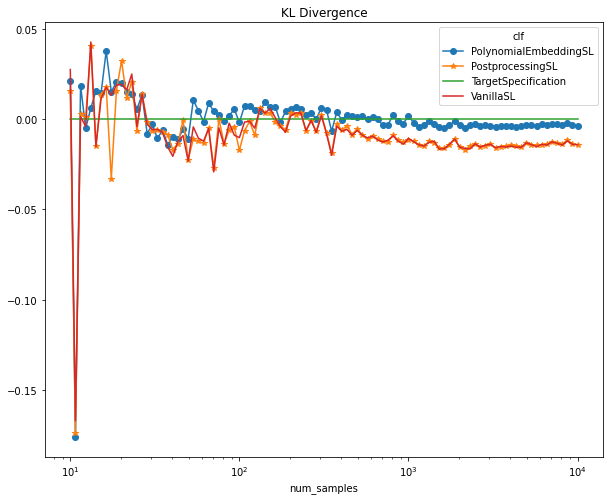

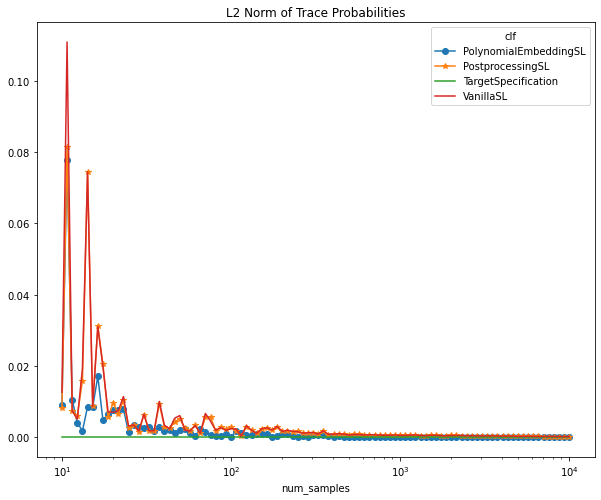

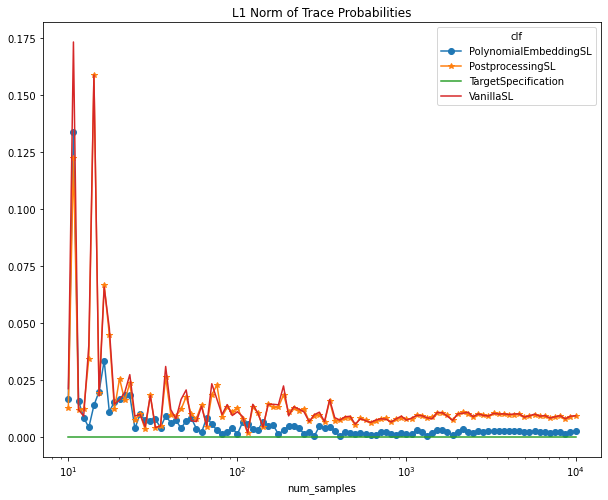

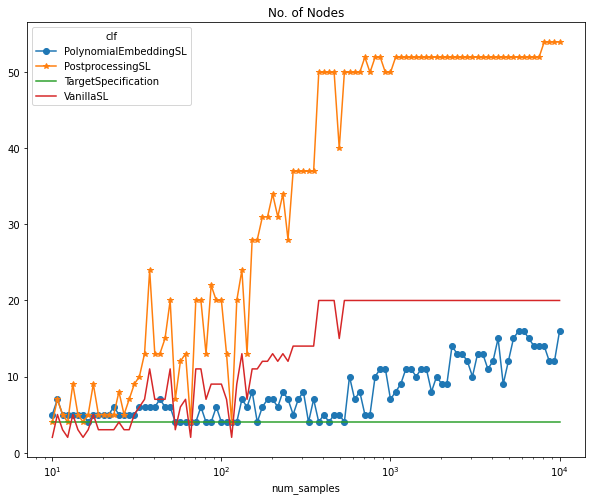

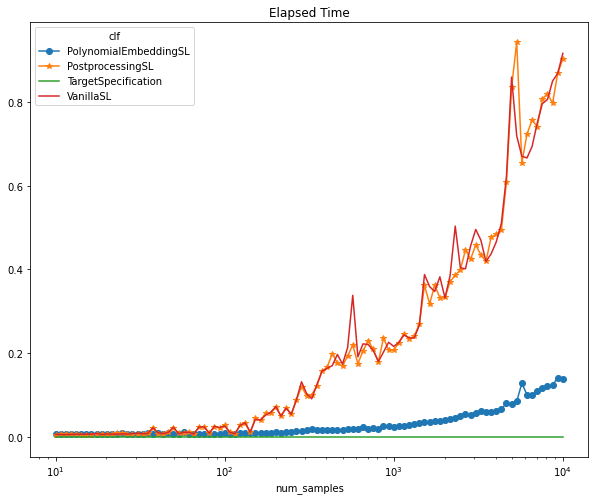

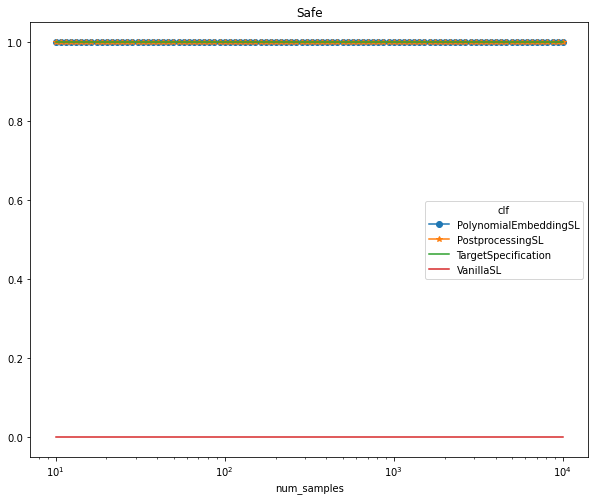

In [80]:
# Plot
evaluation.plot(x='num_samples', 
                selected_params={'p': '0.6', 'N': 20}, 
                figsize=(10, 8), 
                logx=True,
#                 logy=True,
                style={'PolynomialEmbeddingSL': '-o', 'PostprocessingSL': '-*'})
#                 style={'GreedyEmbeddingSL': '-x', 'PolynomialEmbeddingSL': '-o', 'PostprocessingSL': '-*'})

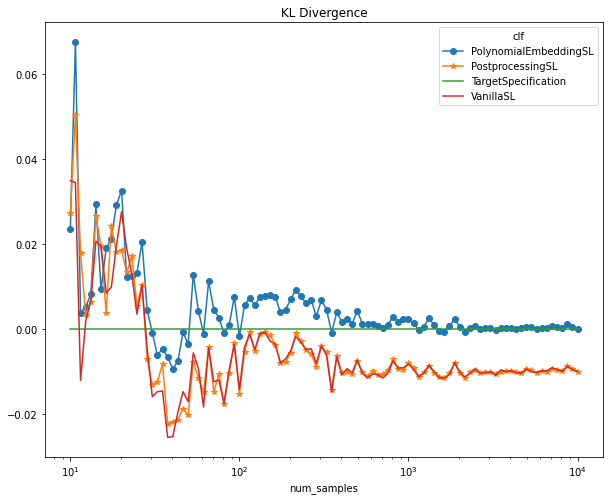

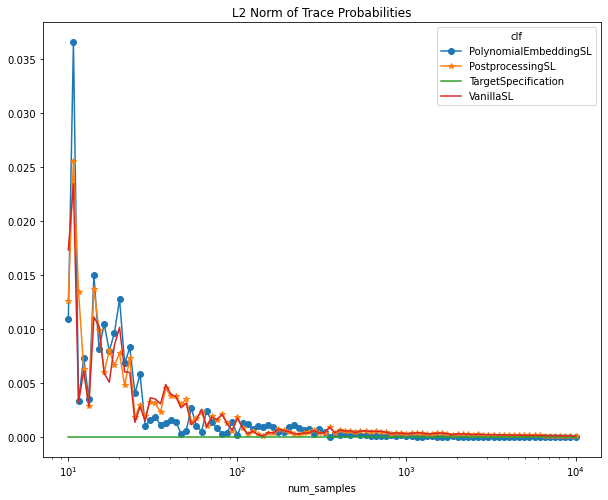

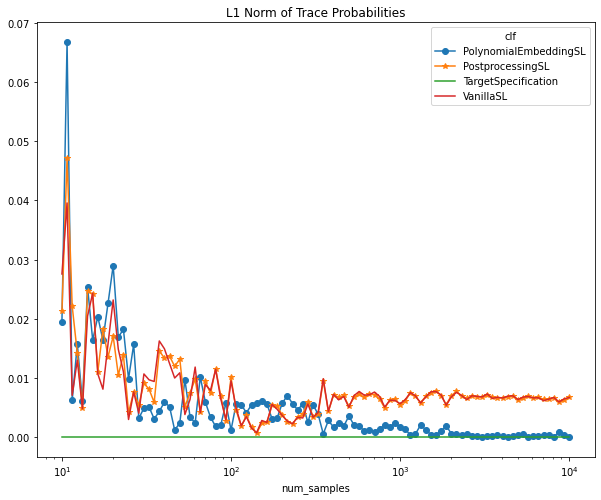

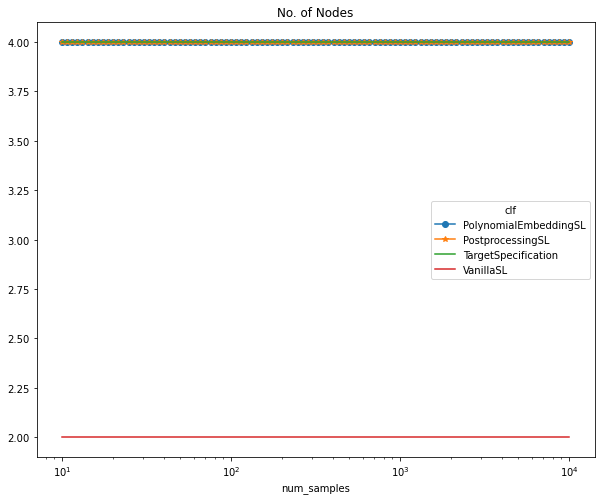

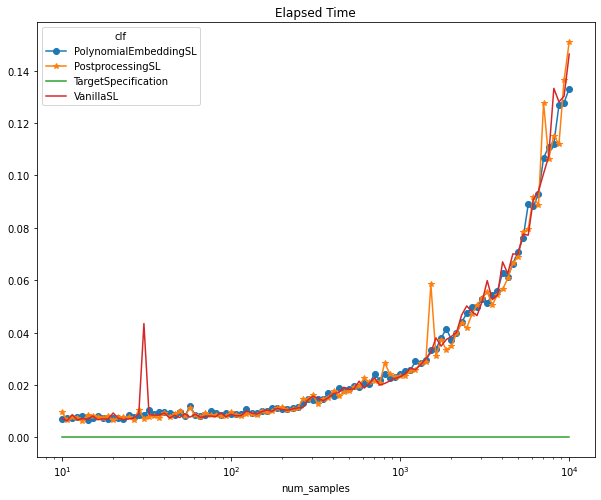

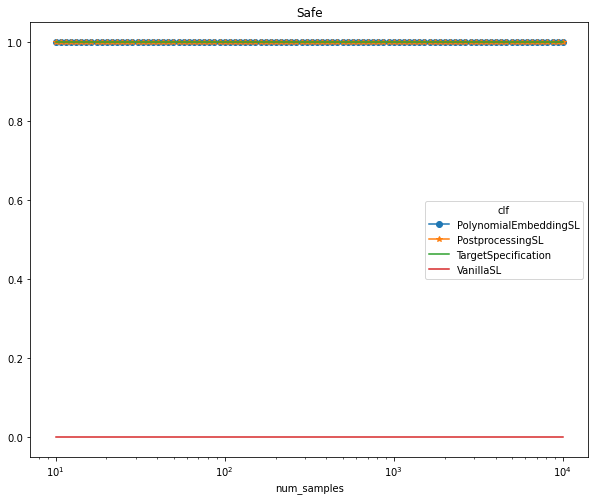

In [81]:
evaluation.plot(x='num_samples', 
                selected_params={'p': '5', 'N': 20}, 
                figsize=(10, 8), 
                logx=True,
#                 logy=True,
                style={'PolynomialEmbeddingSL': '-o', 'PostprocessingSL': '-*'})
#                 style={'GreedyEmbeddingSL': '-x', 'PolynomialEmbeddingSL': '-o', 'PostprocessingSL': '-*'})

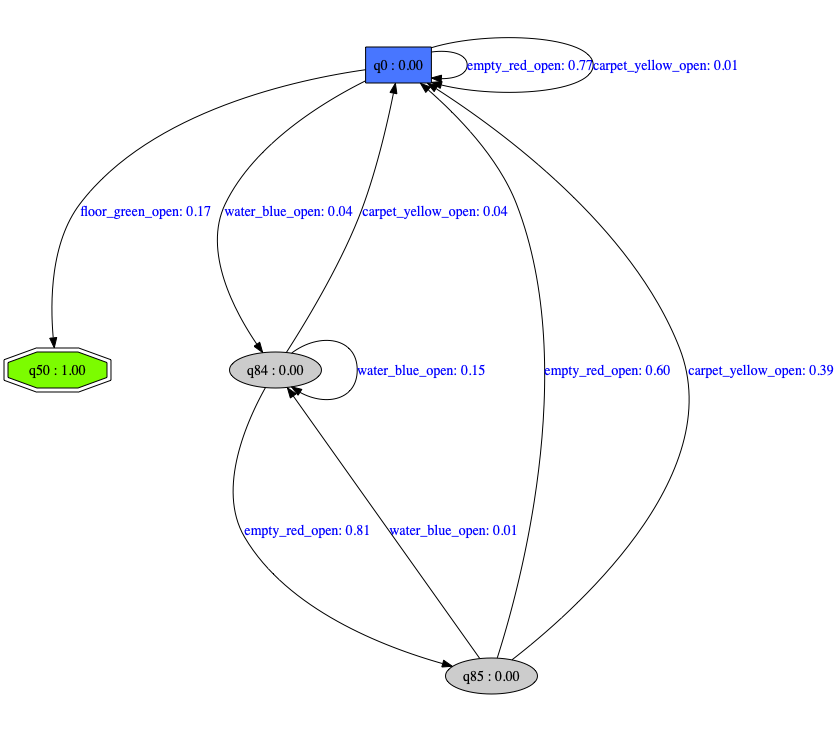

In [82]:
selected_params = {'p': '5',
                   'N': 20,
                   'clf': 'PolynomialEmbeddingSL',
                   'num_samples': num_samples[-1]}
filename = '_'.join([EXPERIMENT_NAME, env_id, 'learnedPDFA'])

evaluation.draw(selected_params, filename=filename)

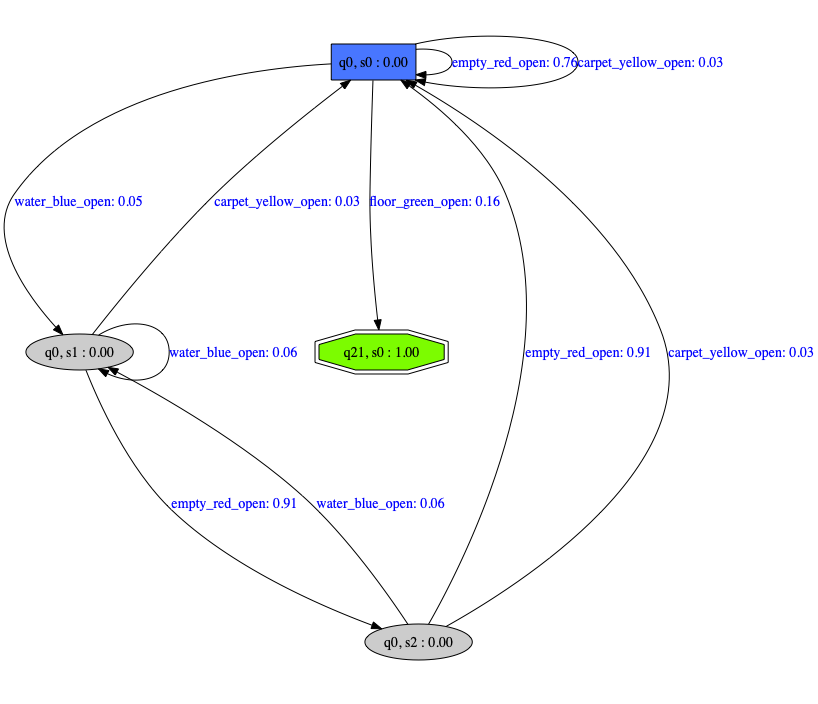

In [83]:
selected_params = {'p': '5',
                   'N': 20,
                   'clf': 'PostprocessingSL',
                   'num_samples': num_samples[90]}
filename = '_'.join([EXPERIMENT_NAME, env_id, 'learnedPDFA'])

evaluation.draw(selected_params, filename=filename)

In [ ]:
n_experiment = -5
dataset = estimator.experiments[n_experiment].dataset
transitionCounts = {}
def print_sample_probability(pdfa, traces):
    start_state = pdfa.start_state
    # Count all transitions from each node in the train sets
    for trace in traces:

        curr_state = start_state
        trace_prob = 1.0
    #     print(trace)

        for symbol in trace:
            next_state, _ = pdfa._get_next_state(curr_state, symbol)

            if curr_state not in transitionCounts:
                transitionCounts[curr_state] = {}
            if symbol not in transitionCounts[curr_state]:
                transitionCounts[curr_state][symbol] = 0

            transitionCounts[curr_state][symbol] += 1
            curr_state = next_state

    # Now compare against the actual distribution
    for curr_state, eachNodeTransitions in transitionCounts.items():
        sum_counts = sum(list(eachNodeTransitions.values()))
        for symbol, counts in eachNodeTransitions.items():
            next_state, y_true = pdfa._get_next_state(curr_state, symbol)
            y_pred = counts / sum_counts

            print(f'({curr_state}, {next_state}, {symbol:<20s}): GroundTruth={y_true:3f}, Pred={y_pred:4f}')

print_sample_probability(manually_specified_pdfa, dataset.X_train)
# print()
# print_sample_probability(manually_specified_pdfa, dataset.X_test)